# Projet 1 : Quel est l'artiste

L'objectif de ce projet est de construire et d'entraîner un modèle capable de répondre à la Question : Qui a peint ce tableau ?

Nous faisons face à une problématique de classification d'images.

Sur la base d'un tableau donné, notre modèle devra être en mesure d'en déterminer l'auteur.

## Import des librairies

In [2]:
# Utils
import os
import shutil
import time


# Maths - Stats
from sklearn.utils import shuffle
import numpy as np
import pandas as pd
import random as rd

# Data visualization
from matplotlib import pyplot as plt
import seaborn as sns

# Deep Learning Librairies
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Dense, Flatten, Dropout
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam

In [3]:
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'

In [4]:
# tf.config.list_physical_devices()
[k.device_type for k in tf.config.list_physical_devices()]

['CPU', 'GPU']

## Import des données

In [5]:
!git clone https://plmlab.math.cnrs.fr/chevallier-teaching/datasets/art-challenge.git

fatal: destination path 'art-challenge' already exists and is not an empty directory.


# Analyse exploratoire

Nous allons performer dans un premier temps une analyse exploratoire des données. Cela nous permettra de prendre en main le jeu de donnée et d'identifer de possible problème pour la suite. Par exemple nous pouvons verifier si les classes (ici les artistes) sont bien équilibrées, si les style sont tous bien représentés... Cela nous permettra aussi par la suite d'interpreter les résultats du modèle. Si le modèle ce trompe dans sa prédiction c'est il trompé avec un artiste au style similaire ?

## Chargement du dataset

Pour l'analyse exploratoire nous utilisons le dataset artists.csv qui répertorie les artistes que l'on considère pour ce projet, leur année de naissance et de mort, une mini biographie, leur style de peinture de prédilection, le nombre d'œuvres étudiées ici, ainsi qu'un lien vers leur page wikipédia (en anglais).

In [6]:
import pandas as pd

#chargement du dataset qui ce situe dans art-challenge
df_artists = pd.read_csv('art-challenge/artists.csv')

#affichage des 5 premières ligne
print(df_artists.head())

   id                name        years                         genre  \
0   0   Amedeo Modigliani  1884 - 1920                 Expressionism   
1   1  Vasiliy Kandinskiy  1866 - 1944  Expressionism,Abstractionism   
2   2        Diego Rivera  1886 - 1957       Social Realism,Muralism   
3   3        Claude Monet  1840 - 1926                 Impressionism   
4   4       Rene Magritte  1898 - 1967      Surrealism,Impressionism   

  nationality                                                bio  \
0     Italian  Amedeo Clemente Modigliani (Italian pronunciat...   
1     Russian  Wassily Wassilyevich Kandinsky (Russian: Васи́...   
2     Mexican  Diego María de la Concepción Juan Nepomuceno E...   
3      French  Oscar-Claude Monet (; French: [klod mɔnɛ]; 14 ...   
4     Belgian  René François Ghislain Magritte (French: [ʁəne...   

                                        wikipedia  paintings  
0  http://en.wikipedia.org/wiki/Amedeo_Modigliani        193  
1  http://en.wikipedia.org/wiki/

## Nombre de tableaux par artistes


Statistiques sur la colonne 'paintings' (nombre de tableaux) :
count     50.000000
mean     168.920000
std      157.451105
min       24.000000
25%       81.000000
50%      123.000000
75%      191.750000
max      877.000000
Name: paintings, dtype: float64


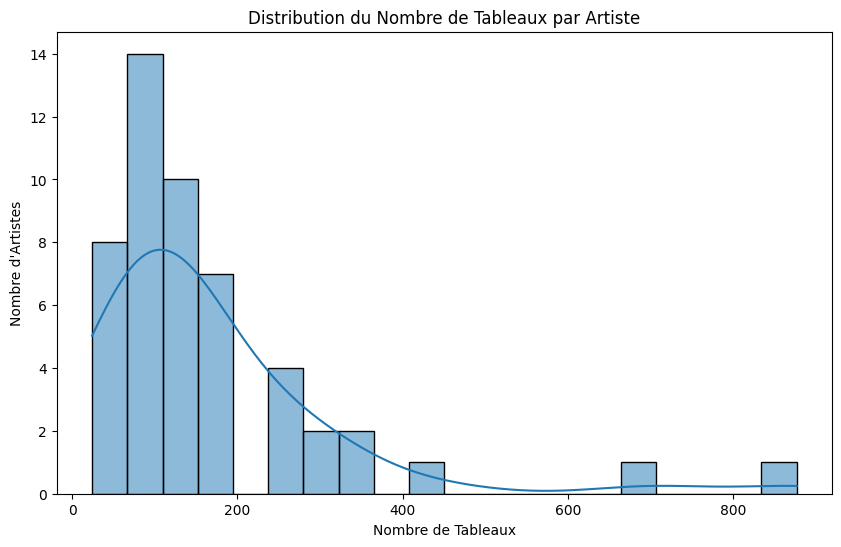

In [71]:
print("\nStatistiques sur la colonne 'paintings' (nombre de tableaux) :")
print(df_artists['paintings'].describe())

# Visualisation du nombre de tableaux par artiste
plt.figure(figsize=(10, 6))
sns.histplot(df_artists['paintings'], bins=20, kde=True)
plt.title("Distribution du Nombre de Tableaux par Artiste")
plt.xlabel("Nombre de Tableaux")
plt.ylabel("Nombre d'Artistes")
plt.show()

### Interprétation des Statistiques

* ***Moyenne et Écart Type :***
La moyenne de 168.9 peintures par artiste indique que la plupart des artistes disposent d'un nombre raisonnable d'œuvres.
L'écart type de 157.4 suggère une grande variabilité dans le nombre de peintures : certains artistes ont jusqu'à 877 œuvres, tandis que d'autres n'en possèdent que 24.

* ***Distribution :***
Les quartiles montrent que 25% des artistes ont moins de 81 peintures, tandis que 25% en ont plus de 191.75. Cela révèle une forte disparité dans le nombre d'œuvres, ce qui pourrait avoir un impact sur la performance du modèle.

* ***Minimum et Maximum :***
La présence d'artistes avec seulement 24 peintures indique qu'il pourrait y avoir des cas où les données ne sont pas suffisantes pour permettre un entraînement efficace du modèle.



## Distribution des styles dans le dataset

Text(0.5, 1.0, 'Distribution des Genres')

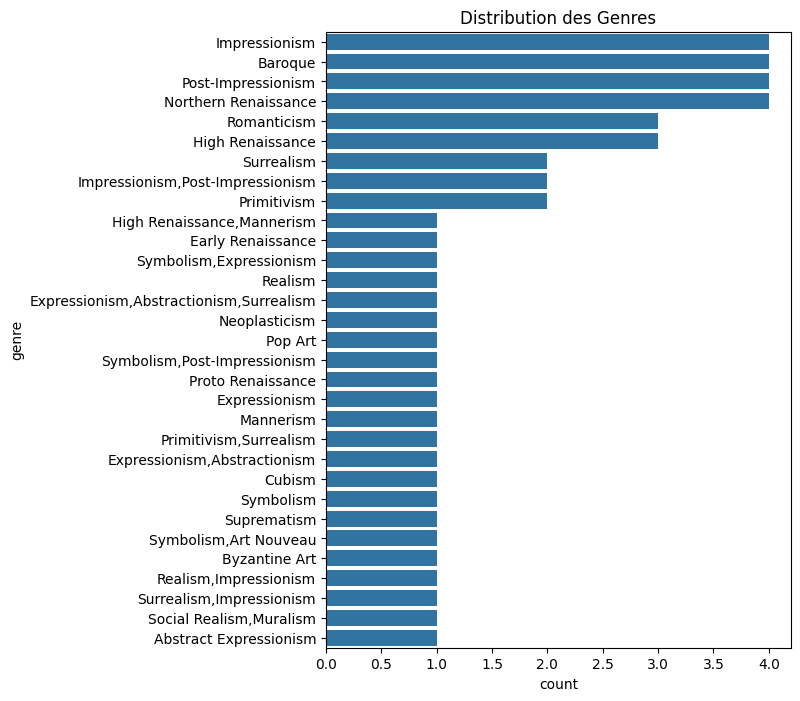

In [76]:
plt.figure(figsize=(6, 8))
sns.countplot(y='genre', data=df_artists, order=df_artists['genre'].value_counts().index)
plt.title("Distribution des Genres")

Ici on voit que les artistes ont des genres différents les un des autres. C'est une bonne choses, cela signifie que notre jeu de donnée est varié est cela augmente nos chance que nos artistes soient bien différentiable. On voit par contre que l'Impressionism, le Baroque et le Post-Impressionisme sont assez représenté. Il faudra faire attention par la suite que les artistes ne soient pas confondu les un avec les autres lors de la prédiction.

## Reste des données

Nous disposons également d'informations complémentaires sur chaque artiste, telles que leur année de naissance et de décès, une brève biographie, un lien vers leur page Wikipédia (en anglais) et leur nationalité. Cependant, nous avons choisi de ne pas intégrer ces données dans notre modèle. Notre objectif est de concevoir un modèle qui, à partir d'une image seule, identifie l'artiste, sans dépendre d'autres informations contextuelles.

Ces données pourraient être utiles dans une phase d'interprétation, au même titre les genres artistiques par exemple. Cependant, afin de rester focalisés, nous supposons ici que la qualité de la prédiction, qu'elle soit correcte ou non, n'est pas directement influencée par des éléments tels que la biographie, la nationalité ou la période historique de l'artiste. Ce qui nous intéresse avant tout, c'est d'évaluer les similitudes et les différences entre les tableaux, un aspect qui se prête davantage à une analyse visuelle qu'à une contextualisation biographique.

On pourrait supposer que deux artistes partageant la même nationalité et vivant à la même époque sont plus susceptibles de produire des œuvres similaires. Cependant, cette similarité se manifesterait principalement à travers leur affinité pour des genres artistiques communs. Par conséquent, une analyse axée sur les genres artistiques serait suffisante pour capturer ces similitudes.

# Prediction simple CNN

Nous devons maintenant construire un modèle qui va nous permettre de détecter l'auteur d'un tableau. Il s'agit donc d'une classification d'image. Dans ce cas précis, un réseau convolutif (CNN) est particulièrement bien adaptée, car les CNNs sont connus pour être performants pour l'analyse d'images.

Nous allons donc dans un premier temps en construire un "naïvement."

Ce CNN devra prendre en entrée uniquement les tableaux et nous retourner l'artiste prédit.

Commençons par préparer nos données.

import

In [7]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import transforms
from sklearn.model_selection import train_test_split

## Chargement du data set

Il nous faut d'abord charger le dataset qui contient toutes les images et les labelliser. La structure du dossier imagehq nous permet d'utiliser la fonction ImageFolder qui se chargera automatiquement de l'import et la labélisation des données.

Pour ce projet, nous n'avons pas de limites de temps imposé, notre prédiction n'a pas besoin d'être rapide, on cherche seulement à maximiser la précision de notre modèle. Ainsi, nous faisons le choix de prendre les données en haute qualité qui certes, nous demanderons plus de puissance de calcul et de mémoire, mais qui permettrons au modèle de capturer plus de détails fin qui peuvent être discriminants, notamment dans le cas de tableau comme ici.

In [8]:
import os
from torchvision import datasets, transforms
from torch.utils.data import DataLoader

# Chemin vers le dossier d'images
data_dir = 'art-challenge/images_hq'

# 2. Définir les transformations pour les images
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Redimensionner les images à 224x224 (comme dans ResNet, VGG, etc.)
    transforms.ToTensor(),          # Convertir les images en tenseurs PyTorch
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalisation avec des moyennes et std communes pour les images
    #On applique ici les transformation standar les plus utilisé et adpaté pour les réseaux CNN préentraîner
])

# 3.ImageFolder pour charger les images , ImageFolder prend en charge tout l'import et la labelisation grâce a la structure du dossier
art_dataset = datasets.ImageFolder(root=data_dir, transform=transform)

### Chargement du data set transformé

On charge aussi un dataser transformé qui nous servira par la suite pour la data augmentation

In [9]:
# Transformations pour les données - Utilisation de la data augmentation pour le jeu d'entraînement

train_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),  # Flip horizontal pour augmenter la diversité
    transforms.RandomRotation(10),      # Rotation aléatoire pour plus de robustesse
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),  # Jitter pour varier l'éclairage
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])


# Chargement du dataset avec ImageFolder pour appliquer les transformations
full_dataset_transformed = datasets.ImageFolder(root=data_dir, transform=train_transforms)

### Affichage de 10 images au hasard

Pour verifier que notre import c'est bien déroulé et pour avoir un aperçu du contenu de nos données on peut afficher 10 tableau pris aux hasard

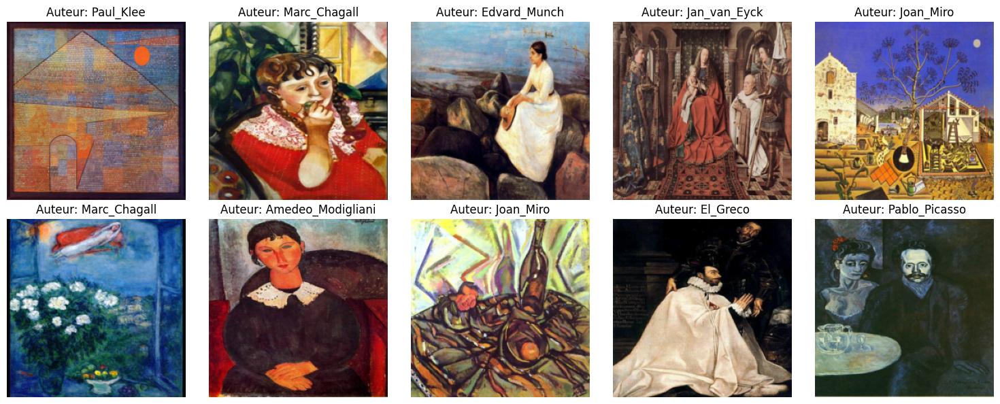

In [10]:
import matplotlib.pyplot as plt
import numpy as np

# Sélectionner 10 indices aléatoires
num_images = 10
random_indices = np.random.choice(len(art_dataset), size=num_images, replace=False)

# Créer un subplot 2x5
fig, axes = plt.subplots(2, 5, figsize=(15, 6))

for i, index in enumerate(random_indices):
    image, label = art_dataset[index]
    # Convertir l'image tensor en numpy array
    image_np = image.numpy().transpose((1, 2, 0))  # Transposition pour avoir les dimensions (H, W, C) au lieu de (C,H,W)
    # Dénormaliser l'image
    image_np = image_np * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
    # Clipping des valeurs en dehors de la plage 0-1
    image_np = np.clip(image_np, 0, 1)

    # Afficher l'image et le label
    row = i // 5
    col = i % 5
    axes[row, col].imshow(image_np)
    axes[row, col].set_title(f"Auteur: {art_dataset.classes[label]}")
    axes[row, col].axis('off')

plt.tight_layout()
plt.show()

## Pré traitement des données


Nous avons vu dans l'analyse exploratoire que tout les artistes n'était pas du tout également réprésenté.

Il est important que nos artistes ai un nombre similaires d'oeuvre pour avoir une représentation équitable des classes, si un artiste à trop peu d'oeuvre le modèle aura tendance à ignorer cette classe, au contraire si un artiste à trop d'oeuvre le modèle pourra favoriser cette classe mais aussi faire du surapprentissage et perdre de sa flexibilité.

Garder un nombre d'œuvres équilibré tout en gardant un grand nombred'artiste, est donc essentiel pour un apprentissage plus impartial et précis du modèle sans trop réduire la compléxité du problème.

In [11]:
df_artists['id'] = df_artists['id'].astype('category')
df_artists.describe()

,paintings
count,50.000000
mean,168.920000
std,157.451105
min,24.000000
25%,81.000000
50%,123.000000
75%,191.750000
max,877.000000


In [12]:
#Définition du nombre min et max de tableau
TAB_MIN = 120
TAB_MAX = 200

In [13]:
from collections import Counter

# Étape 1 : Compter les occurrences de chaque artiste dans le dataset
ARTIST_COUNT = Counter([art_dataset.classes[label] for _, label in art_dataset])

In [14]:
def filter_datasets(art_dataset, full_dataset_transformed, artist_counts, tab_min, tab_max):
    """
    Filtre les datasets pour ne conserver que les images des artistes ayant un nombre d'occurrences
    dans l'intervalle [tab_min, tab_max], de manière optimisée.

    Args:
        art_dataset (Dataset): Dataset d'origine non transformé.
        full_dataset_transformed (Dataset): Dataset transformé correspondant.
        artist_counts (dict): Dictionnaire contenant le nombre d'occurrences par artiste.
        tab_min (int): Nombre minimum d'occurrences pour inclure un artiste.
        tab_max (int): Nombre maximum d'occurrences pour inclure un artiste.

    Returns:
        tuple: Les datasets filtrés (art_datasetf, full_dataset_transformedf)
    """
    # Identifiez les artistes à conserver
    valid_labels = {
        label for label, count in artist_counts.items()
        if tab_min <= count <= tab_max
    }

    # Préfiltrage des datasets en ne conservant que les indices correspondants
    filtered_art_dataset = [
        (image, label) for image, label in art_dataset if art_dataset.classes[label] in valid_labels
    ]
    filtered_full_dataset = [
        (image, label) for image, label in full_dataset_transformed if full_dataset_transformed.classes[label] in valid_labels
    ]

    # Afficher les résultats
    print(f"Nombre d'images dans art_dataset après filtrage : {len(filtered_art_dataset)}")
    print(f"Nombre d'images dans full_dataset_transformed après filtrage : {len(filtered_full_dataset)}")

    return filtered_art_dataset, filtered_full_dataset


In [15]:
# Étape 3 : Remplacer les datasets par les versions filtrées
art_datasetf,full_dataset_transformedf = filter_datasets(art_dataset, full_dataset_transformed, ARTIST_COUNT, TAB_MIN, TAB_MAX)

Nombre d'images dans art_dataset après filtrage : 2345
Nombre d'images dans full_dataset_transformed après filtrage : 2345


### Nombre d'artiste gardés

In [16]:
# Obtenir la liste des artiste présent dans art_datasetf
unique_artists = set([art_dataset.classes[label] for _, label in art_datasetf])

# Print the number of unique artists
print("Nombre d'artistes différents dans art_datasetf:", len(unique_artists))

Nombre d'artistes différents dans art_datasetf: 15


Dans cette première partie, on gardera ces 15 artistes. On pourra faire varier ce nombre plus tard afin de comparer les performances en fonction du nombre d'artistes gardé.

Pour l'instant pour simplifier le problème et réduire un peu les temps de calcul sans trop réduire la complexité du problème, nous garderons ce nombre d'artistes.

Nous l'avons fixé en prenant les artistes qui ont entre 120 et 200 tableaux, afin qu'ils aient tous un nombre de tableaux conséquent et similaires..

### Mis à jour des labels

#### Affichage des labels de art_datasetf et leur artiste correspondant

In [ ]:
# Affichage des labels de art_datasetf et leur artiste correspondant

unique_labels = set([label for _, label in art_datasetf])
artist_label_mapping = {}
for _, label in art_datasetf:
    artist_name = art_dataset.classes[label]
    if artist_name not in artist_label_mapping:
        artist_label_mapping[artist_name] = label

print("Artiste et label correspondant dans art_datasetf:")
for artist, label in artist_label_mapping.items():
    print(f"Artiste: {artist}, Label: {label}")

print("\n")
print("\n")

unique_labels2 = set([label for _, label in full_dataset_transformedf])
artist_label_mapping2 = {}
for _, label in full_dataset_transformedf:
    artist_name = full_dataset_transformed.classes[label]
    if artist_name not in artist_label_mapping2:
        artist_label_mapping2[artist_name] = label

print("Artiste et label correspondant dans full_dataset_transformedf:")
for artist, label in artist_label_mapping2.items():
    print(f"Artiste: {artist}, Label: {label}")



Artiste et label correspondant dans art_datasetf:
Artiste: Amedeo_Modigliani, Label: 2
Artiste: Andy_Warhol, Label: 4
Artiste: Diego_Velazquez, Label: 9
Artiste: Frida_Kahlo, Label: 16
Artiste: Henri_Matisse, Label: 21
Artiste: Hieronymus_Bosch, Label: 24
Artiste: Kazimir_Malevich, Label: 28
Artiste: Leonardo_da_Vinci, Label: 29
Artiste: Mikhail_Vrubel, Label: 32
Artiste: Paul_Klee, Label: 36
Artiste: Peter_Paul_Rubens, Label: 37
Artiste: Pieter_Bruegel, Label: 40
Artiste: Rene_Magritte, Label: 43
Artiste: Salvador_Dali, Label: 44
Artiste: Sandro_Botticelli, Label: 45




Artiste et label correspondant dans full_dataset_transformedf:
Artiste: Amedeo_Modigliani, Label: 2
Artiste: Andy_Warhol, Label: 4
Artiste: Diego_Velazquez, Label: 9
Artiste: Frida_Kahlo, Label: 16
Artiste: Henri_Matisse, Label: 21
Artiste: Hieronymus_Bosch, Label: 24
Artiste: Kazimir_Malevich, Label: 28
Artiste: Leonardo_da_Vinci, Label: 29
Artiste: Mikhail_Vrubel, Label: 32
Artiste: Paul_Klee, Label: 36
Artiste: Pet

#### Re mapping des labels

In [17]:
# Changement des numéro pour que la prédiction fonctionne

def remap_labels(dataset, class_names):
    """
    Remap les labels d'un dataset en leur attribuant de nouveaux indices contigus.

    Args:
        dataset (list): Dataset sous forme de tuples (image, label).
        class_names (list): Liste des noms des classes.

    Returns:
        updated_dataset (list): Dataset avec les labels remappés.
        label_mapping (dict): Dictionnaire associant anciens labels aux nouveaux.
    """
    # Création du dictionnaire de remapping
    label_mapping = {class_name: idx for idx, class_name in enumerate(
        {class_names[label] for _, label in dataset})}

    # Mise à jour des labels dans le dataset
    updated_dataset = [(image, label_mapping[class_names[label]]) for image, label in dataset]

    return updated_dataset, label_mapping

In [18]:
# Remap des labels pour les deux datasets
art_datasetf, label_mapping = remap_labels(art_datasetf, art_dataset.classes)
full_dataset_transformedf, _ = remap_labels(full_dataset_transformedf, full_dataset_transformed.classes)

# Vérification des nouveaux labels
unique_labels = {label for _, label in art_datasetf}
print("Vérification des nouveaux labels dans art_datasetf :", unique_labels)

unique_labels2 = {label for _, label in full_dataset_transformedf}
print("Vérification des nouveaux labels dans full_dataset_transformedf :", unique_labels2)

Vérification des nouveaux labels dans art_datasetf : {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14}
Vérification des nouveaux labels dans full_dataset_transformedf : {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14}


#### Affichage des labels re mapper

In [ ]:
unique_labels = set([label for _, label in art_datasetf])
artist_label_mapping = {}
for _, label in art_datasetf:
    artist_name = art_dataset.classes[label]
    if artist_name not in artist_label_mapping:
        artist_label_mapping[artist_name] = label

print("Artiste et label correspondant dans art_datasetf:")
for artist, label in artist_label_mapping.items():
    print(f"Artiste: {artist}, Label: {label}")

print("\n")
print("\n")

unique_labels2 = set([label for _, label in full_dataset_transformedf])
artist_label_mapping2 = {}
for _, label in full_dataset_transformedf:
    artist_name = full_dataset_transformed.classes[label]
    if artist_name not in artist_label_mapping2:
        artist_label_mapping2[artist_name] = label

print("Artiste et label correspondant dans full_dataset_transformedf:")
for artist, label in artist_label_mapping2.items():
    print(f"Artiste: {artist}, Label: {label}")

Artiste et label correspondant dans art_datasetf:
Artiste: Alfred_Sisley, Label: 1
Artiste: Camille_Pissarro, Label: 5
Artiste: Andy_Warhol, Label: 4
Artiste: Albrecht_Dürer, Label: 0
Artiste: El_Greco, Label: 13
Artiste: Edvard_Munch, Label: 12
Artiste: Diego_Rivera, Label: 8
Artiste: Edgar_Degas, Label: 10
Artiste: Eugene_Delacroix, Label: 14
Artiste: Andrei_Rublev, Label: 3
Artiste: Amedeo_Modigliani, Label: 2
Artiste: Diego_Velazquez, Label: 9
Artiste: Caravaggio, Label: 6
Artiste: Claude_Monet, Label: 7
Artiste: Edouard_Manet, Label: 11




Artiste et label correspondant dans full_dataset_transformedf:
Artiste: Alfred_Sisley, Label: 1
Artiste: Camille_Pissarro, Label: 5
Artiste: Andy_Warhol, Label: 4
Artiste: Albrecht_Dürer, Label: 0
Artiste: El_Greco, Label: 13
Artiste: Edvard_Munch, Label: 12
Artiste: Diego_Rivera, Label: 8
Artiste: Edgar_Degas, Label: 10
Artiste: Eugene_Delacroix, Label: 14
Artiste: Andrei_Rublev, Label: 3
Artiste: Amedeo_Modigliani, Label: 2
Artiste: Diego_Vel

## Définition des hyperparamètres

In [19]:
# Définition des hyperparamètres
num_epochs = 20               # Nombre d'époques d'entraînement
batch_size = 64               # Taille de chaque lot de données
learning_rate = 0.001         # Taux d'apprentissage initial pour l'optimiseur
momentum = 0.9                # Momentum pour SGD
test_split = 0.2              # Fraction des données pour le test
val_split = 0.1               # Fraction des données d'entraînement pour la validation
random_seed = 42              # Pour la reproductibilité des résultats


# Choix du device - GPU si disponible, sinon CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

## Séparation des données en train test et val

In [20]:
from sklearn.model_selection import train_test_split
from torch.utils.data import Subset, DataLoader

def split_and_load_data(art_datasetf, full_dataset_transformedf, test_split, val_split, batch_size, random_seed):
    """
    Divise les indices du dataset en ensembles d'entraînement, validation, et test,
    puis crée des DataLoaders pour ces ensembles.

    Args:
        art_datasetf (Dataset): Dataset filtré non transformé.
        full_dataset_transformedf (Dataset): Dataset filtré et transformé.
        test_split (float): Fraction des données à utiliser pour l'ensemble de test.
        val_split (float): Fraction des données d'entraînement à utiliser pour la validation.
        batch_size (int): Taille des lots pour les DataLoaders.
        random_seed (int): Graine pour assurer la reproductibilité.

    Returns:
        dict: Contient les DataLoaders et les tailles des ensembles :
            - train_loader, val_loader, test_loader
            - train_loader_transformed
            - tailles : train_size, val_size, test_size
    """
    # Obtenez les indices du dataset
    indices = list(range(len(art_datasetf)))

    # Divisez les indices en ensembles d'entraînement et de test
    train_indices, test_indices = train_test_split(
        indices, test_size=test_split, random_state=random_seed
    )

    # Divisez les indices d'entraînement en ensembles d'entraînement et de validation
    train_indices, val_indices = train_test_split(
        train_indices, test_size=val_split, random_state=random_seed
    )

    # Créez des sous-ensembles de données à partir des indices
    train_dataset = Subset(art_datasetf, train_indices)
    train_dataset_transformed = Subset(full_dataset_transformedf, train_indices)
    test_dataset = Subset(art_datasetf, test_indices)
    val_dataset = Subset(art_datasetf, val_indices)

    # Chargement des données dans des DataLoaders
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    train_loader_transformed = DataLoader(train_dataset_transformed, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

    # Affichage des tailles des ensembles
    train_size = len(train_dataset)
    val_size = len(val_dataset)
    test_size = len(test_dataset)

    print(f"Taille de l'ensemble d'entraînement : {train_size}")
    print(f"Taille de l'ensemble d'entraînement transformé : {len(train_dataset_transformed)}")
    print(f"Taille de l'ensemble de validation : {val_size}")
    print(f"Taille de l'ensemble de test : {test_size}")

    return {
        "train_loader": train_loader,
        "train_loader_transformed": train_loader_transformed,
        "val_loader": val_loader,
        "test_loader": test_loader,
        "train_size": train_size,
        "val_size": val_size,
        "test_size": test_size,
    }


In [21]:
loaders = split_and_load_data(
    art_datasetf=art_datasetf,
    full_dataset_transformedf=full_dataset_transformedf,
    test_split=0.2,
    val_split=0.1,
    batch_size=32,
    random_seed=42
)

# Accédez aux DataLoaders et tailles
train_loader = loaders["train_loader"]
train_loader_transformed = loaders["train_loader_transformed"]
val_loader = loaders["val_loader"]
test_loader = loaders["test_loader"]

Taille de l'ensemble d'entraînement : 1688
Taille de l'ensemble d'entraînement transformé : 1688
Taille de l'ensemble de validation : 188
Taille de l'ensemble de test : 469


## Défintion du modèle CNN

Nous allons ici définir l'architecture de notre réseau CNN. Nous nous basons sur les méthodes les plus classiques et utilisé pour ce type de problème.

Les trois blocs de convolution (32, 64, et 128 canaux) permettent une extraction progressive des caractéristiques, des plus basiques  aux plus complexes.

 La normalisation de lot après chaque couche de convolution stabilise et accélère l'entraînement. Cela permet aussi d'atténuer le risque de sur-apprentissage.

 Chaque bloc de convolution est suivi par une opération de Max-Pooling (2x2) qui réduit les dimensions de l'image de moitié. Le Max-Pooling aide à se concentrer sur les caractéristiques les plus importantes, ce qui diminue le nombre de paramètres et réduit aussi le risque de surapprentissage.

 L'activation ReLU est appliquée après chaque couche de convolution pour introduire de la non-linéarité, ce qui aide le modèle à apprendre des relations complexes.

Enfin les couches entièrements connectées permettent de reduire la sorite du bloc convolutif puis de produire la prédiction finale. Elle sont accompagné d'un Dropout toujours pour diminuer le risque de surapprentisage


In [22]:
IM_SIZE = train_loader.dataset[10][0].shape[2]
INPUT_SHAPE = (IM_SIZE, IM_SIZE, 3)
print(INPUT_SHAPE)

(224, 224, 3)


In [23]:
class ImprovedCNN(nn.Module):
    def __init__(self, num_classes):
        super(ImprovedCNN, self).__init__()

        # Blocs de convolution avec batch normalization
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm2d(32)

        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm2d(64)

        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.bn3 = nn.BatchNorm2d(128)

        self.pool = nn.MaxPool2d(2, 2)

        # Adaptive pooling pour une taille de sortie constante (7x7)
        self.adaptive_pool = nn.AdaptiveAvgPool2d((7, 7))

        # Couches entièrement connectées
        self.fc1 = nn.Linear(128 * 7 * 7, 256)
        self.fc2 = nn.Linear(256, num_classes)
        self.dropout = nn.Dropout(0.5)

    def forward(self, x):

        x = self.pool(nn.functional.relu(self.bn1(self.conv1(x))))

        x = self.pool(nn.functional.relu(self.bn2(self.conv2(x))))

        x = self.pool(nn.functional.relu(self.bn3(self.conv3(x))))

        # Application d'un Adaptive Pooling pour s'assurer que la sortie est de la bonne taille
        x = self.adaptive_pool(x)

        x = x.view(-1, 128 * 7 * 7)  # Mise en forme pour les couches entièrement connectées

        x = nn.functional.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.fc2(x)
        return x



### Initialisation du modèle

In [24]:
# Initialisation du modèle
num_classes = len(unique_artists)

modelI = ImprovedCNN(num_classes).to(device)

print(num_classes)

15


### Défintion de la perte et de l'optim

In [35]:
# Définition de la fonction de perte et de l'optimiseur
criterion = nn.CrossEntropyLoss()  # Perte d'entropie croisée pour une classification multi-classes
optimizer = optim.SGD(modelI.parameters(), lr=learning_rate, momentum=momentum)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.5)  # Réduit le LR tous les 10 epochs

### Definition fonction train

In [25]:
def train(model, train_loader, val_loader, criterion, optimizer, scheduler, num_epochs):
    train_losses = []
    train_accuracies = []
    val_accuracies = []
    for epoch in range(num_epochs):
        model.train()  # Mode entraînement
        running_loss = 0.0
        correct_train = 0
        total_train = 0

        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()  # Remise à zéro des gradients
            outputs = model(images)
            loss = criterion(outputs, labels)  # Calcul de la perte
            loss.backward()  # Rétropropagation
            optimizer.step()  # Mise à jour des paramètres

            running_loss += loss.item()

            _, predicted = torch.max(outputs.data, 1)
            total_train += labels.size(0)
            correct_train += (predicted == labels).sum().item()

        # Ajustement du taux d'apprentissage
        scheduler.step()

        # Validation
        val_accuracy = evaluate(model, val_loader)[0]
        train_accuracy = 100 * correct_train / total_train

        print(f"Époque [{epoch+1}/{num_epochs}], Perte : {running_loss/len(train_loader):.4f}, Précision Entraînement : {train_accuracy:.2f}%, Précision Validation : {val_accuracy:.2f}%")
        train_losses.append(running_loss / len(train_loader))
        train_accuracies.append(train_accuracy)
        val_accuracies.append(val_accuracy)

    # Tracer la précision et la perte en fonction du nombre d'époques
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(range(1, num_epochs + 1), train_losses, label='Perte d\'entraînement')
    plt.xlabel('Époque')
    plt.ylabel('Perte')
    plt.title('Perte d\'entraînement en fonction du nombre d\'époques')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(range(1, num_epochs + 1), train_accuracies, label='Précision d\'entraînement')
    plt.plot(range(1, num_epochs + 1), val_accuracies, label='Précision de validation')
    plt.xlabel('Époque')
    plt.ylabel('Précision (%)')
    plt.title('Précision en fonction du nombre d\'époques')
    plt.legend()

    plt.tight_layout()
    plt.show()

    return train_losses, train_accuracies, val_accuracies

### Definition fonction d'éval

In [26]:
# Fonction d'évaluation
def evaluate(model, data_loader):
    model.eval()  # Mode évaluation
    correct = 0
    total = 0
    with torch.no_grad():
        for images, labels in data_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    return 100 * correct / total , predicted


## Entrainement et test

Époque [1/20], Perte : 2.5606, Précision Entraînement : 14.93%, Précision Validation : 29.26%
Époque [2/20], Perte : 2.2563, Précision Entraînement : 26.07%, Précision Validation : 34.04%
Époque [3/20], Perte : 2.0464, Précision Entraînement : 35.01%, Précision Validation : 38.83%
Époque [4/20], Perte : 1.9395, Précision Entraînement : 37.50%, Précision Validation : 36.70%
Époque [5/20], Perte : 1.8454, Précision Entraînement : 40.40%, Précision Validation : 42.02%
Époque [6/20], Perte : 1.7807, Précision Entraînement : 42.59%, Précision Validation : 39.36%
Époque [7/20], Perte : 1.6968, Précision Entraînement : 44.96%, Précision Validation : 45.74%
Époque [8/20], Perte : 1.5976, Précision Entraînement : 48.70%, Précision Validation : 50.00%
Époque [9/20], Perte : 1.5440, Précision Entraînement : 50.95%, Précision Validation : 51.06%
Époque [10/20], Perte : 1.5090, Précision Entraînement : 51.18%, Précision Validation : 49.47%
Époque [11/20], Perte : 1.4140, Précision Entraînement : 54

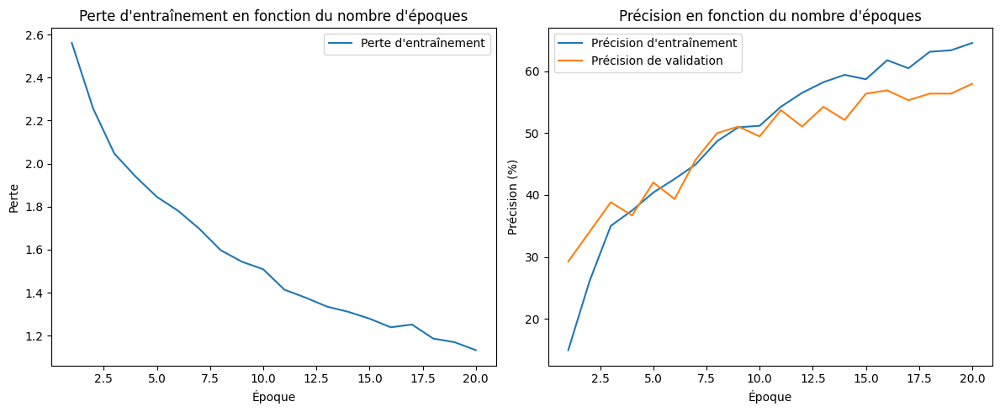

([2.56063575114844,
  2.256324199010741,
  2.0464281136134885,
  1.9395058762352422,
  1.8453785675876546,
  1.7806879776828695,
  1.6967542126493633,
  1.59762748682274,
  1.5439569882626802,
  1.508985236005963,
  1.414025032295371,
  1.3769085789626498,
  1.3355091956426512,
  1.3112913190193896,
  1.279449943101631,
  1.23934989830233,
  1.2521698407407076,
  1.1867488442726855,
  1.1701208994073689,
  1.1330277638615303],
 [14.928909952606634,
  26.066350710900473,
  35.01184834123223,
  37.5,
  40.40284360189573,
  42.59478672985782,
  44.964454976303315,
  48.69668246445497,
  50.947867298578196,
  51.18483412322275,
  54.2654028436019,
  56.51658767772512,
  58.2345971563981,
  59.41943127962085,
  58.708530805687204,
  61.78909952606635,
  60.485781990521325,
  63.15165876777251,
  63.388625592417064,
  64.57345971563981],
 [29.25531914893617,
  34.04255319148936,
  38.829787234042556,
  36.702127659574465,
  42.02127659574468,
  39.361702127659576,
  45.744680851063826,
  50.

In [ ]:
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'

# Entraînement et validation du modèle
train(modelI, train_loader, val_loader, criterion, optimizer, scheduler, num_epochs)

In [ ]:
# Évaluation finale sur le jeu de test
test_accuracy , pred_label = evaluate(modelI, test_loader)
print(f"Taux de précision sur le jeu de test : {test_accuracy:.2f}%")

Taux de précision sur le jeu de test : 54.58%


In [ ]:
# Évaluation finale sur le jeu de test avec les données transformées
#test_accuracy , pred_label = evaluate(modelIT, test_loader)
#print(f"Taux de précision sur le jeu de test : {test_accuracy:.2f}%")

### Affichage des résultats

In [27]:
import numpy as np
import random

def denormalize(image, mean, std):
    image = image * std + mean
    return np.clip(image, 0, 1)  # Clip pour garder les valeurs entre 0 et 1

def display_random_images_with_predictions(model, data_loader, class_names, num_images=10):
    model.eval()
    images_displayed = 0
    fig, axes = plt.subplots(2, 5, figsize=(15, 6))
    axes = axes.flatten()

    with torch.no_grad():
        for images, labels in data_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)

            indices = random.sample(range(len(images)), min(num_images - images_displayed, len(images)))

            for idx in indices:
                image = images[idx].cpu().numpy().transpose(1, 2, 0)

                # Dénormaliser l'image si elle a été normalisée
                image = denormalize(image, np.array([0.5, 0.5, 0.5]), np.array([0.5, 0.5, 0.5]))

                real_label = labels[idx].item()
                predicted_label = predicted[idx].item()

                real_author = class_names[real_label]
                predicted_author = class_names[predicted_label]

                ax = axes[images_displayed]
                ax.imshow(image)
                ax.set_title(f"Réel: {real_author}\nPrédit: {predicted_author}")
                ax.axis('off')

                images_displayed += 1
                if images_displayed >= num_images:
                    break
            if images_displayed >= num_images:
                break

    plt.tight_layout()
    plt.show()


In [ ]:
class_names = list(label_mapping.keys())

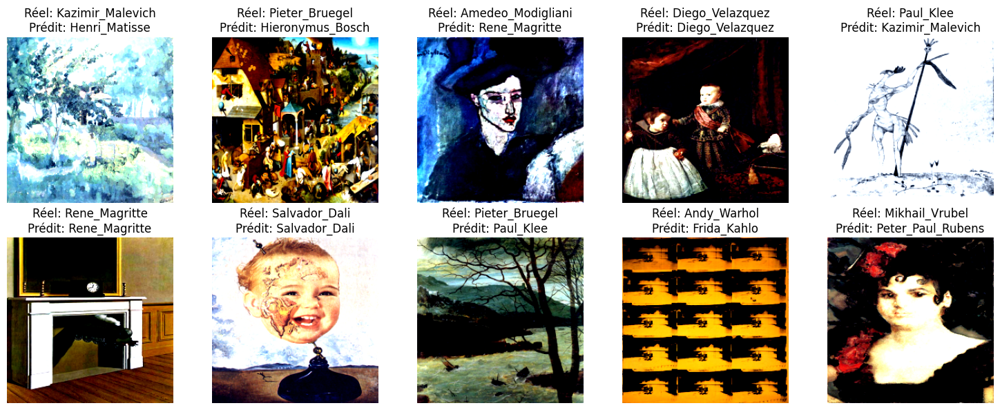

In [ ]:
# Appeler la fonction pour afficher les images Avec le premier model : modelI
display_random_images_with_predictions(modelI, test_loader, class_names)

## Explication des résultats

La classification d'œuvres d'art par artiste est une tâche particulièrement complexe pour plusieurs raisons:

*   Les peintures varient énormément en termes de style, de couleur, de texture et de composition même au sein des œuvres d’un seul artiste
*   De nombreux artistes partagent des caractéristiques stylistiques communes

Ceci rend donc la distinction entre artistes difficile. Un modèle convolutionnel assez simple, avec quelques couches, comme construit précédement, manque de profondeur et de paramètres  pour capturer ces nuances artistiques ainsi les résulats sont peu satisfaisant et on obtient que 54% de prédiction sur le jeu de test.



### Amélioration

L'utilisation d'un réseau préentraîné, comme ResNet50, est donc recommandée dans un cas comme le notre. Les modèles comme ResNet50 sont beaucoup plus profonds et ont été préentraînés sur des bases de données massives (comme ImageNet), permettant d'apprendre une hiérarchie de caractéristiques visuelles très fines. Cette richesse dans les caractéristiques extraites est essentielle pour capturer les détails spécifiques des œuvres d'art et pour faire la différence entre les artistes. En transférant les connaissances d'un réseau préentraîné, notre modèle peut démarrer avec une compréhension plus approfondie des images, ce qui se traduit généralement par des performances de classification significativement améliorées.



# Prédiction avec transfer learning


## Definition du modèle

In [31]:
from torchvision import models

# Définition de la classe du modèle
class ArtClassificationModel(nn.Module):
    def __init__(self, num_classes, pretrained=True):
        super(ArtClassificationModel, self).__init__()
        # Charger le modèle ResNet50
        self.model = models.resnet50(pretrained=pretrained)

        # Geler les paramètres pour ne pas entraîner les couches convolutionnelles
        for param in self.model.parameters():
            param.requires_grad = False

        # Modifier la dernière couche pour adapter le modèle au nombre de classes
        self.model.fc = nn.Linear(self.model.fc.in_features, num_classes)

    def forward(self, x):
        return self.model(x)

## Initialisation

In [ ]:
#Instancier le modèle
model50 = ArtClassificationModel(num_classes=len(unique_artists), pretrained=True)

# Déplacer le modèle vers le device
model50 = model50.to(device)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 158MB/s]


## Definition des hyperparamètres

In [ ]:
# Définition des hyperparamètres
num_epochs = 23
batch_size = 64
learning_rate = 0.001
momentum = 0.9

In [ ]:
# Définition de la fonction de perte et de l'optimiseur
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model50.model.fc.parameters(), lr=learning_rate, momentum=momentum)  # Optimisation uniquement de la dernière couche
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.5)

## Entrainement

Époque [1/23], Perte : 2.4566, Précision Entraînement : 27.67%, Précision Validation : 51.60%
Époque [2/23], Perte : 1.8489, Précision Entraînement : 56.75%, Précision Validation : 60.11%
Époque [3/23], Perte : 1.4979, Précision Entraînement : 66.65%, Précision Validation : 70.74%
Époque [4/23], Perte : 1.2799, Précision Entraînement : 72.27%, Précision Validation : 73.94%
Époque [5/23], Perte : 1.1526, Précision Entraînement : 74.05%, Précision Validation : 75.53%
Époque [6/23], Perte : 1.0257, Précision Entraînement : 76.54%, Précision Validation : 76.60%
Époque [7/23], Perte : 0.9583, Précision Entraînement : 79.32%, Précision Validation : 78.72%
Époque [8/23], Perte : 0.8885, Précision Entraînement : 80.75%, Précision Validation : 75.00%
Époque [9/23], Perte : 0.8288, Précision Entraînement : 81.22%, Précision Validation : 77.13%
Époque [10/23], Perte : 0.8017, Précision Entraînement : 82.05%, Précision Validation : 78.72%
Époque [11/23], Perte : 0.7623, Précision Entraînement : 82

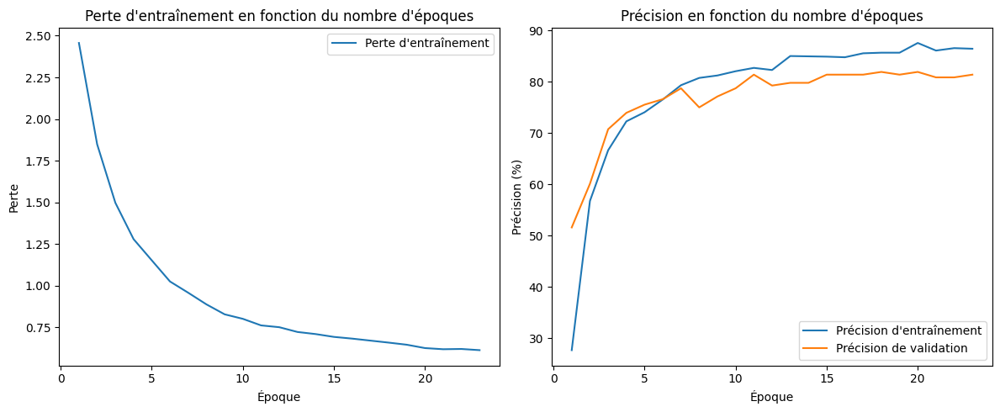

([2.456592667777583,
  1.8489371043331218,
  1.4979302253363267,
  1.2799455692183297,
  1.1525993448383403,
  1.0257499690325755,
  0.9583346922442598,
  0.8885333065716725,
  0.8287669487719266,
  0.8017183564743906,
  0.7623467698412122,
  0.751502107899144,
  0.722883791293738,
  0.7102455283110997,
  0.6933667822828833,
  0.6831018784136142,
  0.6711083301958048,
  0.659175399339424,
  0.6464072859512185,
  0.62630284676012,
  0.6193756686066682,
  0.6209197415495818,
  0.6137709656976303],
 [27.665876777251185,
  56.75355450236967,
  66.64691943127963,
  72.27488151658768,
  74.0521327014218,
  76.54028436018957,
  79.32464454976304,
  80.74644549763033,
  81.22037914691943,
  82.04976303317535,
  82.70142180094787,
  82.2867298578199,
  85.01184834123222,
  84.95260663507109,
  84.89336492890995,
  84.77488151658768,
  85.54502369668246,
  85.66350710900474,
  85.66350710900474,
  87.55924170616113,
  86.0781990521327,
  86.5521327014218,
  86.43364928909952],
 [51.5957446808510

In [ ]:
train(model50, train_loader, val_loader, criterion, optimizer, scheduler, num_epochs)

## Evaluation

In [ ]:
# Évaluation finale sur le jeu de test
test_accuracy, pred_label = evaluate(model50, test_loader)
print(f"Taux de précision sur le jeu de test : {test_accuracy:.2f}%")

Taux de précision sur le jeu de test : 75.27%


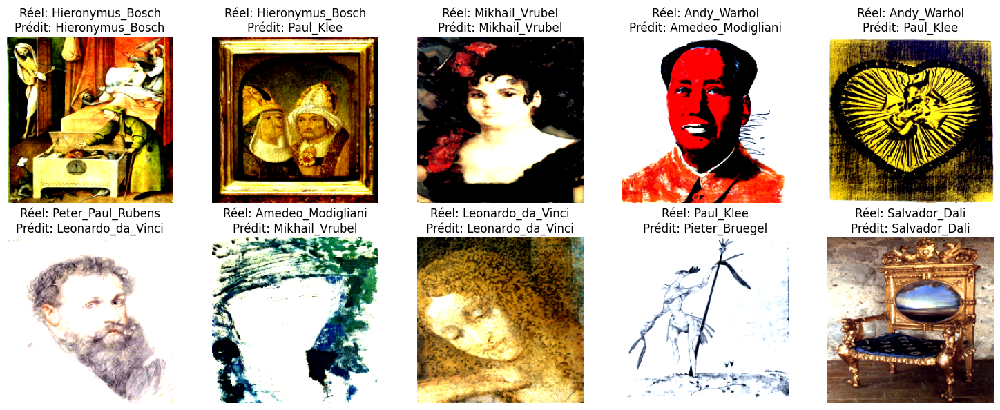

In [ ]:
# Appeler la fonction pour afficher les images
display_random_images_with_predictions(model50, test_loader, class_names)


## Analyse des résultats


En utilisantResNet50 comme modèle préentraîné, nous atteignons désormais une précision de 75 % sur la classification des artistes. Ce résultat est nettement plus élevé que celui obtenu avec le modèle convolutionnel simple, il confirme bien l’efficacité du transfert learning pour une tâche aussi complexe.

# Comparaison des différents modèles et différents paramètres

On a vu précédemment que le modèle préentraîné ResNET50 donnait de bien meilleurs résultats que le modèle que nous avions construit, mais qu'en est il des autres modèles ?

 De plus, a-t-on choisi les bons paramètres, ne peut-on pas faire mieux ?

Enfin, qu'en est-il de notre choix sur le nombre d'artistes gardés, es ce un choix judicieux, comment évoluent les résultats si on modifie ce nombre et si on intégre les artiste qui ont "trop" de tableaux.

Nous allons tacher d'y répondre dans cette partie

## Récaputilatif


In [ ]:
### CHARGEMENT DES DONNEES ###

# art_dataset = datasets.ImageFolder(root=data_dir, transform=transform)
# full_dataset_transformed = datasets.ImageFolder(root=data_dir, transform=train_transforms)

### FILTRAGE DES ARTIST ET RE MAPPING ###

# ARTIST_COUNT = Counter([art_dataset.classes[label] for _, label in art_dataset])
# art_datasetf,full_dataset_transformedf = filter_datasets(art_dataset, full_dataset_transformed, ARTIST_COUNT, TAB_MIN, TAB_MAX)
# art_datasetf, label_mapping = remap_labels(art_datasetf, art_dataset.classes)
# full_dataset_transformedf, _ = remap_labels(full_dataset_transformedf, full_dataset_transformed.classes)
# unique_artists = set([art_dataset.classes[label] for _, label in art_datasetf])

### SEPARATION DES DONNES ###

# loaders = split_and_load_data(art_datasetf=art_datasetf,full_dataset_transformedf=full_dataset_transformedf,test_split=0.2,val_split=0.1,batch_size=32,random_seed=42)
# train_loader = loaders["train_loader"]
# train_loader_transformed = loaders["train_loader_transformed"]
# val_loader = loaders["val_loader"]
# test_loader = loaders["test_loader"]

### INITIALISATION DU MODELE ###

# num_classes = len(unique_artists)
# model50 = ArtClassificationModel(num_classes=num_classes, pretrained=True)
# model50 = model50.to(device)

### TRAIN ###

# train(model50, train_loader, val_loader, criterion, optimizer, scheduler, num_epochs)

### EVAL ###

# test_accuracy, pred_label = evaluate(model50, test_loader)

### Affichage ###
# class_names = list(label_mapping.keys())
# display_random_images_with_predictions(model50, test_loader, class_names)


## Choix du modèle

### Fonction pour comparer les modèles

In [ ]:
def compare_models(models, train_loader, val_loader, test_loader, criterion, optimizer_fn, scheduler_fn, num_epochs):
    """
    Compare plusieurs modèles sur les ensembles d'entraînement, validation et test.

    Args:
        models (dict): Dictionnaire contenant les modèles à comparer. Ex: {'Model1': model1, 'Model2': model2}.
        train_loader (DataLoader): DataLoader pour l'ensemble d'entraînement.
        val_loader (DataLoader): DataLoader pour l'ensemble de validation.
        test_loader (DataLoader): DataLoader pour l'ensemble de test.
        criterion: Fonction de perte.
        optimizer_fn (callable): Fonction pour créer l'optimiseur, ex: `lambda model: optim.Adam(model.parameters(), lr=0.001)`.
        scheduler_fn (callable): Fonction pour créer le scheduler, ex: `lambda optimizer: StepLR(optimizer, step_size=10, gamma=0.1)`.
        num_epochs (int): Nombre d'époques pour l'entraînement.

    Returns:
        dict: Résultats pour chaque modèle (pertes, précisions).
    """
    results = {}

    for model_name, model in models.items():
        print(f"\n{'=' * 20} Entraînement du modèle : {model_name} {'=' * 20}\n")

        # Déplacer le modèle sur le périphérique
        model.to(device)

        # Créer un optimiseur et un scheduler pour ce modèle
        optimizer = optimizer_fn(model)
        scheduler = scheduler_fn(optimizer)

        # Entraîner le modèle
        train_losses, train_accuracies, val_accuracies = train(
            model=model,
            train_loader=train_loader,
            val_loader=val_loader,
            criterion=criterion,
            optimizer=optimizer,
            scheduler=scheduler,
            num_epochs=num_epochs
        )

        # Évaluer sur l'ensemble de test
        test_accuracy, _ = evaluate(model, test_loader)

        print(f"\nTest Accuracy for {model_name}: {test_accuracy:.2f}%\n")

        # Sauvegarder les résultats
        results[model_name] = {
            'train_losses': train_losses,
            'train_accuracies': train_accuracies,
            'val_accuracies': val_accuracies,
            'test_accuracy': test_accuracy
        }

    return results


### Definition de tout les modèles

In [ ]:
# Fonction pour charger les modèles pré-entraînés et adapter les couches de sortie
def create_pretrained_model(model_name, num_classes):
    if model_name == "ResNet18":
        model = models.resnet18(pretrained=True)
        model.fc = nn.Linear(model.fc.in_features, num_classes)
    elif model_name == "ResNet50":
        model = models.resnet50(pretrained=True)
        model.fc = nn.Linear(model.fc.in_features, num_classes)
    elif model_name == "VGG16":
        model = models.vgg16(pretrained=True)
        model.classifier[6] = nn.Linear(model.classifier[6].in_features, num_classes)
    else:
        raise ValueError(f"Modèle inconnu : {model_name}")
    return model

In [ ]:
# Nombre de classes (par exemple, le nombre d'artistes à prédire)
num_classes = len(unique_artists)

# Initialiser les modèles
models_to_compare = {
    "ImprovedCNN": ImprovedCNN(num_classes),
    "ResNet18": create_pretrained_model("ResNet18", num_classes),
    "ResNet50": create_pretrained_model("ResNet50", num_classes),
    "VGG16": create_pretrained_model("VGG16", num_classes),
}

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 185MB/s]
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "h

### Comparaison et choix


==================== Entraînement du modèle : ImprovedCNN ====================

Époque [1/20], Perte : 2.6599, Précision Entraînement : 16.65%, Précision Validation : 29.79%
Époque [2/20], Perte : 2.2711, Précision Entraînement : 24.59%, Précision Validation : 36.70%
Époque [3/20], Perte : 2.1391, Précision Entraînement : 29.27%, Précision Validation : 37.23%
Époque [4/20], Perte : 2.0698, Précision Entraînement : 32.70%, Précision Validation : 38.30%
Époque [5/20], Perte : 1.9716, Précision Entraînement : 34.60%, Précision Validation : 36.17%
Époque [6/20], Perte : 1.8808, Précision Entraînement : 37.38%, Précision Validation : 45.74%
Époque [7/20], Perte : 1.8666, Précision Entraînement : 38.92%, Précision Validation : 41.49%
Époque [8/20], Perte : 1.7908, Précision Entraînement : 40.34%, Précision Validation : 43.62%
Époque [9/20], Perte : 1.6870, Précision Entraînement : 44.19%, Précision Validation : 45.74%
Époque [10/20], Perte : 1.7050, Précision Entraînement : 44.37%, Précisio

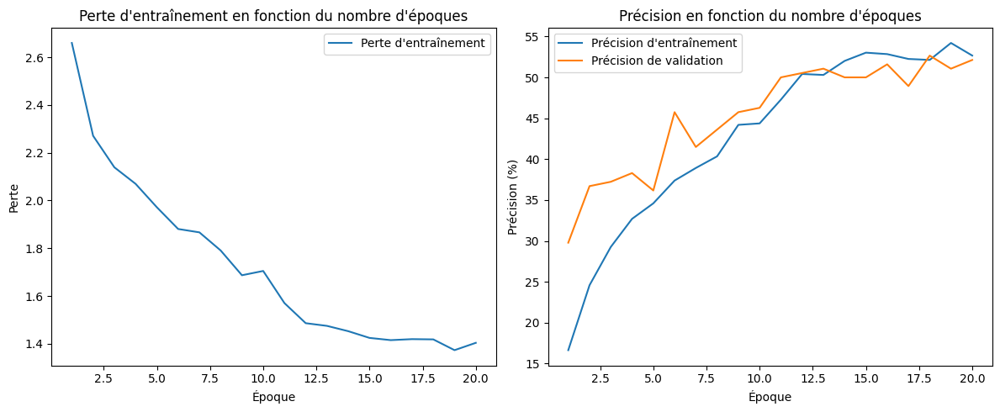


Test Accuracy for ImprovedCNN: 50.32%


==================== Entraînement du modèle : ResNet18 ====================

Époque [1/20], Perte : 1.6187, Précision Entraînement : 51.54%, Précision Validation : 54.79%
Époque [2/20], Perte : 0.9643, Précision Entraînement : 69.79%, Précision Validation : 51.60%
Époque [3/20], Perte : 0.5971, Précision Entraînement : 81.46%, Précision Validation : 59.57%
Époque [4/20], Perte : 0.4455, Précision Entraînement : 84.30%, Précision Validation : 59.57%
Époque [5/20], Perte : 0.3665, Précision Entraînement : 88.03%, Précision Validation : 65.43%
Époque [6/20], Perte : 0.2450, Précision Entraînement : 92.77%, Précision Validation : 68.09%
Époque [7/20], Perte : 0.1966, Précision Entraînement : 94.14%, Précision Validation : 60.11%
Époque [8/20], Perte : 0.2622, Précision Entraînement : 90.76%, Précision Validation : 59.57%
Époque [9/20], Perte : 0.2658, Précision Entraînement : 91.35%, Précision Validation : 61.17%
Époque [10/20], Perte : 0.1047, Préc

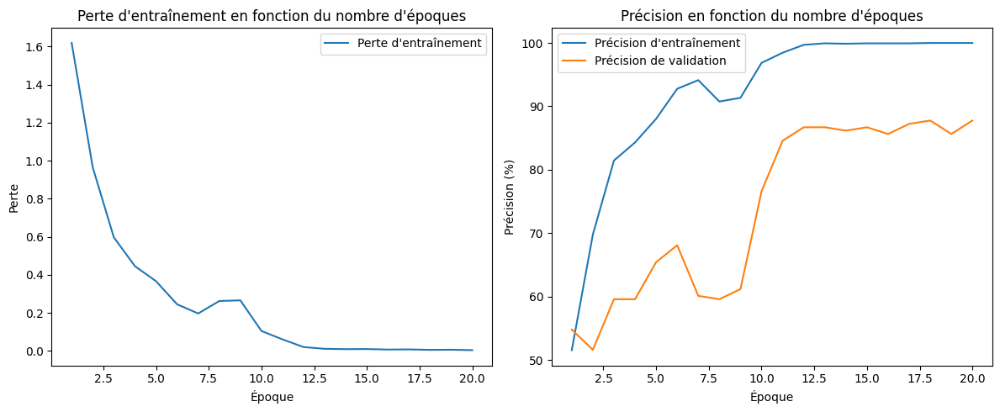


Test Accuracy for ResNet18: 80.38%


==================== Entraînement du modèle : ResNet50 ====================

Époque [1/20], Perte : 2.2550, Précision Entraînement : 32.17%, Précision Validation : 26.06%
Époque [2/20], Perte : 1.5489, Précision Entraînement : 51.48%, Précision Validation : 33.51%
Époque [3/20], Perte : 1.4747, Précision Entraînement : 55.21%, Précision Validation : 45.74%
Époque [4/20], Perte : 1.1971, Précision Entraînement : 61.73%, Précision Validation : 57.45%
Époque [5/20], Perte : 0.8923, Précision Entraînement : 72.51%, Précision Validation : 56.91%
Époque [6/20], Perte : 0.8089, Précision Entraînement : 74.05%, Précision Validation : 48.94%
Époque [7/20], Perte : 0.6210, Précision Entraînement : 80.51%, Précision Validation : 57.45%
Époque [8/20], Perte : 0.5472, Précision Entraînement : 82.35%, Précision Validation : 52.66%
Époque [9/20], Perte : 0.5276, Précision Entraînement : 83.35%, Précision Validation : 64.89%
Époque [10/20], Perte : 0.4415, Précisi

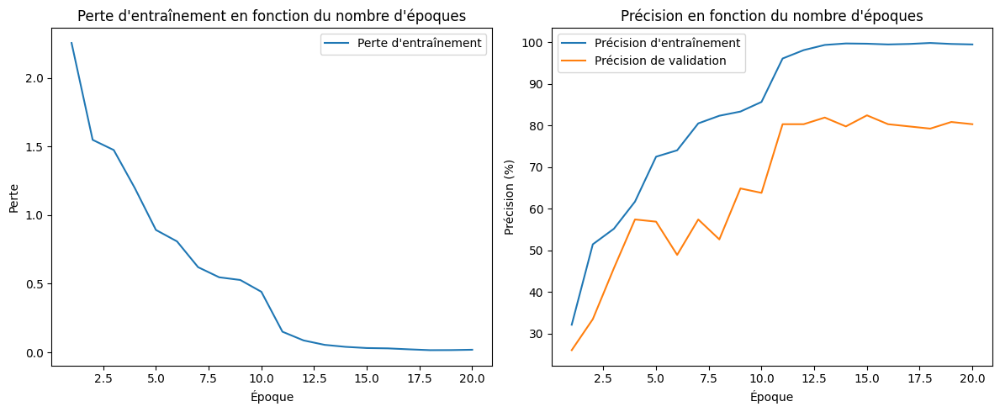


Test Accuracy for ResNet50: 80.60%


==================== Entraînement du modèle : VGG16 ====================

Époque [1/20], Perte : 2.8270, Précision Entraînement : 7.11%, Précision Validation : 9.57%
Époque [2/20], Perte : 2.6208, Précision Entraînement : 11.02%, Précision Validation : 14.89%
Époque [3/20], Perte : 2.5370, Précision Entraînement : 13.63%, Précision Validation : 17.55%
Époque [4/20], Perte : 2.4343, Précision Entraînement : 15.11%, Précision Validation : 19.15%
Époque [5/20], Perte : 2.3802, Précision Entraînement : 17.71%, Précision Validation : 27.66%
Époque [6/20], Perte : 2.2828, Précision Entraînement : 20.79%, Précision Validation : 23.94%
Époque [7/20], Perte : 2.2172, Précision Entraînement : 21.92%, Précision Validation : 26.06%
Époque [8/20], Perte : 2.1253, Précision Entraînement : 26.18%, Précision Validation : 27.13%
Époque [9/20], Perte : 2.0802, Précision Entraînement : 27.25%, Précision Validation : 30.32%
Époque [10/20], Perte : 1.9968, Précision En

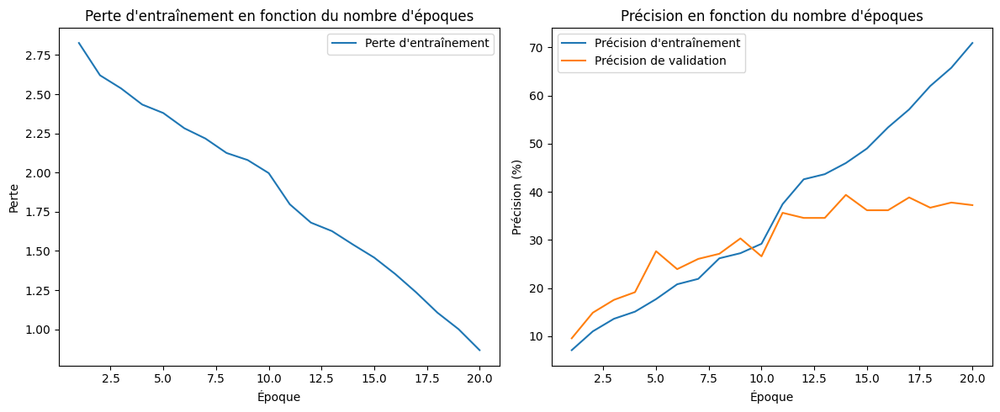


Test Accuracy for VGG16: 35.61%


Résultats pour ImprovedCNN:
  Précision finale sur l'entraînement : 52.67%
  Précision finale sur la validation : 52.13%
  Précision sur l'ensemble de test    : 50.32%

Résultats pour ResNet18:
  Précision finale sur l'entraînement : 100.00%
  Précision finale sur la validation : 87.77%
  Précision sur l'ensemble de test    : 80.38%

Résultats pour ResNet50:
  Précision finale sur l'entraînement : 99.47%
  Précision finale sur la validation : 80.32%
  Précision sur l'ensemble de test    : 80.60%

Résultats pour VGG16:
  Précision finale sur l'entraînement : 70.91%
  Précision finale sur la validation : 37.23%
  Précision sur l'ensemble de test    : 35.61%


In [ ]:
# Critère de perte
criterion = nn.CrossEntropyLoss()

# Optimiseur et scheduler configurés dynamiquement
optimizer_fn = lambda model: optim.Adam(model.parameters(), lr=0.001)
scheduler_fn = lambda optimizer: torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.1)

# Comparer les modèles
results = compare_models(
    models=models_to_compare,
    train_loader=train_loader,
    val_loader=val_loader,
    test_loader=test_loader,
    criterion=criterion,
    optimizer_fn=optimizer_fn,
    scheduler_fn=scheduler_fn,
    num_epochs=20
)

# Afficher les résultats
for model_name, metrics in results.items():
    print(f"\nRésultats pour {model_name}:")
    print(f"  Précision finale sur l'entraînement : {metrics['train_accuracies'][-1]:.2f}%")
    print(f"  Précision finale sur la validation : {metrics['val_accuracies'][-1]:.2f}%")
    print(f"  Précision sur l'ensemble de test    : {metrics['test_accuracy']:.2f}%")

On voit ici que les performances sont différentes en fonction des modèles, il pourrait être intéressant de tester encore d'autres modèle qui pourrait nous donner de meilleures performances.

Dans le cadre de ce projet, on se contentera d'utiliser ResNet18 qui a des performances similaires à ResNet50 tout en étant deux fois plus léger (donc moins de ressources et entraînement plus rapide)

## Optimisation des paramètres

Il aurait était jucidieux d'optimiser les paramètres de tout les modèles afin de pouvoir choisir le meilleur modèle avec les meilleurs paramètres.

Ici on se contentera d'optimiser les paramètres de ResNet18 afin d'avoir un aperçu des amélioration possible sans prendre trop de temps de calcul

###  Fonction pour tester différentes combinaisons de paramètres

In [28]:
from sklearn.model_selection import ParameterGrid
from torch.optim.lr_scheduler import StepLR

In [29]:
def create_resnet18_model(num_classes, pretrained=True):
    model = models.resnet18(pretrained=pretrained)
    model.fc = nn.Linear(model.fc.in_features, num_classes)
    return model

In [24]:
def grid_search(train_loader, val_loader, num_classes):
    best_accuracy = 0
    best_params = {}

    for params in ParameterGrid(param_grid):
        print(f"Entraînement avec les paramètres : {params}")

        # Créer le modèle
        model = create_resnet18_model(num_classes)
        model.to(device)

        # Choisir l'optimiseur
        if params['optimizer'] == 'adam':
            optimizer = optim.Adam(model.parameters(), lr=params['lr'])
        elif params['optimizer'] == 'sgd':
            optimizer = optim.SGD(model.parameters(), lr=params['lr'], momentum=0.9)

        # Scheduler pour ajuster le taux d'apprentissage
        scheduler = StepLR(optimizer, step_size=params['step_size'], gamma=params['gamma'])

        # Critère de perte
        criterion = nn.CrossEntropyLoss()

        # Entraîner le modèle
        train_losses, train_accuracies, val_accuracies = train(
            model, train_loader, val_loader, criterion, optimizer, scheduler, num_epochs=params['num_epochs']
        )

        # Évaluer les performances sur l'ensemble de validation
        val_accuracy = val_accuracies[-1]

        # Comparer avec les meilleurs résultats
        if val_accuracy > best_accuracy:
            best_accuracy = val_accuracy
            best_params = params

    print(f"\nMeilleurs paramètres : {best_params}")
    print(f"Meilleure précision de validation : {best_accuracy:.2f}%")
    return best_params, best_accuracy

### Definition des diférents paramètres

In [ ]:
param_grid = {
    'lr': [0.001, 0.0001],  # Taux d'apprentissage
    'batch_size': [32, 64],  # Taille du batch
    'optimizer': ['adam', 'sgd'],  # Optimiseurs possibles
    'num_epochs': [10, 20],  # Nombre d'époques
    'step_size': [5, 10],  # Taille de l'étape du scheduler
    'gamma': [0.1, 0.5]  # Facteur de réduction du scheduler
}

### Comparaison

Entraînement avec les paramètres : {'batch_size': 32, 'gamma': 0.1, 'lr': 0.001, 'num_epochs': 10, 'optimizer': 'adam', 'step_size': 5}


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Époque [1/10], Perte : 1.6962, Précision Entraînement : 48.99%, Précision Validation : 36.70%
Époque [2/10], Perte : 0.8958, Précision Entraînement : 72.51%, Précision Validation : 49.47%
Époque [3/10], Perte : 0.6055, Précision Entraînement : 80.86%, Précision Validation : 47.34%
Époque [4/10], Perte : 0.6019, Précision Entraînement : 81.40%, Précision Validation : 64.36%
Époque [5/10], Perte : 0.3386, Précision Entraînement : 88.92%, Précision Validation : 68.62%
Époque [6/10], Perte : 0.1393, Précision Entraînement : 96.80%, Précision Validation : 82.45%
Époque [7/10], Perte : 0.0526, Précision Entraînement : 99.35%, Précision Validation : 81.91%
Époque [8/10], Perte : 0.0402, Précision Entraînement : 99.35%, Précision Validation : 83.51%
Époque [9/10], Perte : 0.0305, Précision Entraînement : 99.70%, Précision Validation : 84.57%
Époque [10/10], Perte : 0.0205, Précision Entraînement : 99.94%, Précision Validation : 86.70%


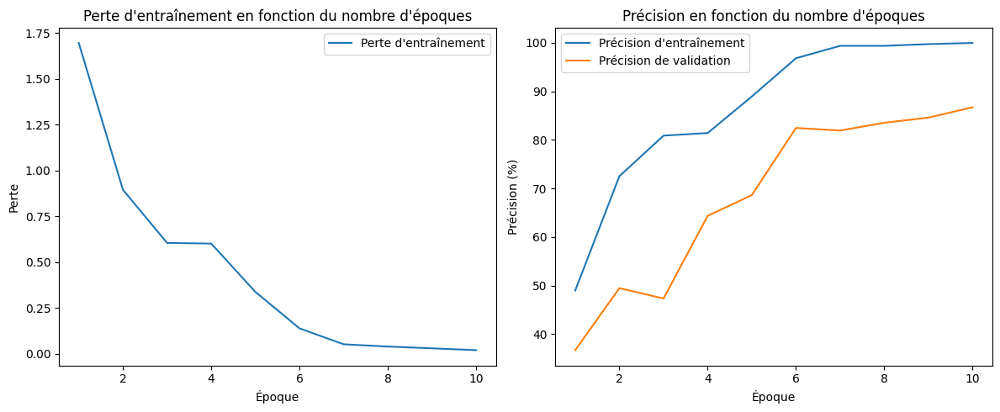

Entraînement avec les paramètres : {'batch_size': 32, 'gamma': 0.1, 'lr': 0.001, 'num_epochs': 10, 'optimizer': 'adam', 'step_size': 10}
Époque [1/10], Perte : 1.7977, Précision Entraînement : 46.09%, Précision Validation : 50.00%
Époque [2/10], Perte : 0.9558, Précision Entraînement : 70.50%, Précision Validation : 54.79%
Époque [3/10], Perte : 0.6582, Précision Entraînement : 79.38%, Précision Validation : 61.70%
Époque [4/10], Perte : 0.4703, Précision Entraînement : 85.13%, Précision Validation : 59.57%
Époque [5/10], Perte : 0.3961, Précision Entraînement : 86.85%, Précision Validation : 58.51%
Époque [6/10], Perte : 0.3074, Précision Entraînement : 90.64%, Précision Validation : 66.49%
Époque [7/10], Perte : 0.1806, Précision Entraînement : 94.61%, Précision Validation : 76.06%
Époque [8/10], Perte : 0.1600, Précision Entraînement : 95.14%, Précision Validation : 77.13%
Époque [9/10], Perte : 0.1338, Précision Entraînement : 95.79%, Précision Validation : 68.62%
Époque [10/10], P

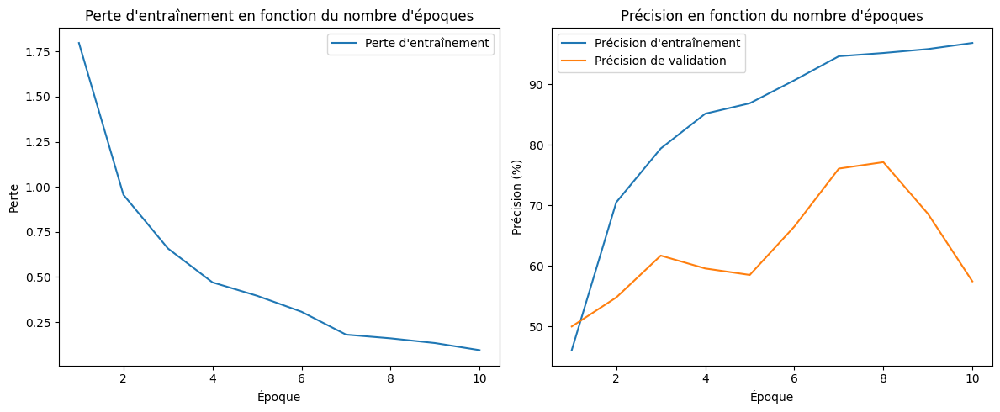

Entraînement avec les paramètres : {'batch_size': 32, 'gamma': 0.1, 'lr': 0.001, 'num_epochs': 10, 'optimizer': 'sgd', 'step_size': 5}
Époque [1/10], Perte : 2.2999, Précision Entraînement : 32.46%, Précision Validation : 64.36%
Époque [2/10], Perte : 1.2012, Précision Entraînement : 73.10%, Précision Validation : 77.13%
Époque [3/10], Perte : 0.7405, Précision Entraînement : 83.77%, Précision Validation : 81.38%
Époque [4/10], Perte : 0.5067, Précision Entraînement : 89.75%, Précision Validation : 81.91%
Époque [5/10], Perte : 0.3521, Précision Entraînement : 93.60%, Précision Validation : 81.38%
Époque [6/10], Perte : 0.2621, Précision Entraînement : 96.09%, Précision Validation : 82.98%
Époque [7/10], Perte : 0.2477, Précision Entraînement : 96.62%, Précision Validation : 81.91%
Époque [8/10], Perte : 0.2358, Précision Entraînement : 97.16%, Précision Validation : 81.91%
Époque [9/10], Perte : 0.2286, Précision Entraînement : 97.45%, Précision Validation : 82.45%
Époque [10/10], Per

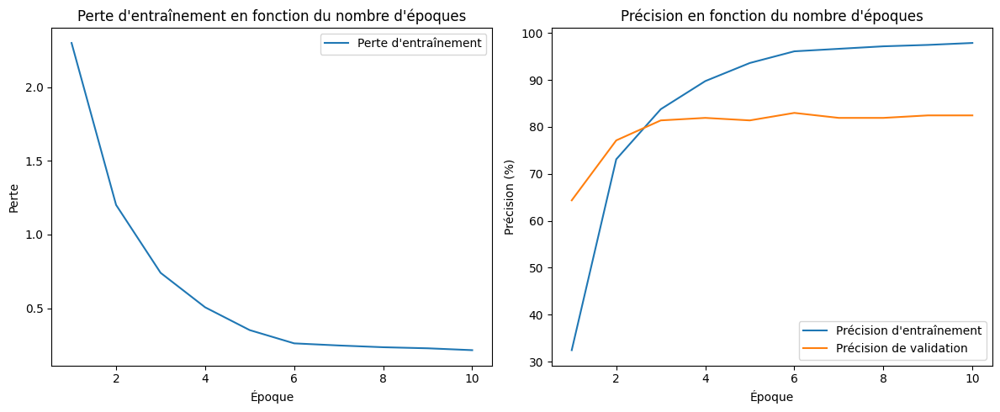

Entraînement avec les paramètres : {'batch_size': 32, 'gamma': 0.1, 'lr': 0.001, 'num_epochs': 10, 'optimizer': 'sgd', 'step_size': 10}
Époque [1/10], Perte : 2.2914, Précision Entraînement : 31.46%, Précision Validation : 63.30%
Époque [2/10], Perte : 1.2349, Précision Entraînement : 71.21%, Précision Validation : 78.19%
Époque [3/10], Perte : 0.7603, Précision Entraînement : 83.83%, Précision Validation : 81.91%
Époque [4/10], Perte : 0.5090, Précision Entraînement : 89.87%, Précision Validation : 82.98%
Époque [5/10], Perte : 0.3709, Précision Entraînement : 92.89%, Précision Validation : 83.51%
Époque [6/10], Perte : 0.2430, Précision Entraînement : 96.98%, Précision Validation : 83.51%
Époque [7/10], Perte : 0.1787, Précision Entraînement : 98.34%, Précision Validation : 85.64%
Époque [8/10], Perte : 0.1303, Précision Entraînement : 99.17%, Précision Validation : 85.11%
Époque [9/10], Perte : 0.0984, Précision Entraînement : 99.64%, Précision Validation : 85.11%
Époque [10/10], Pe

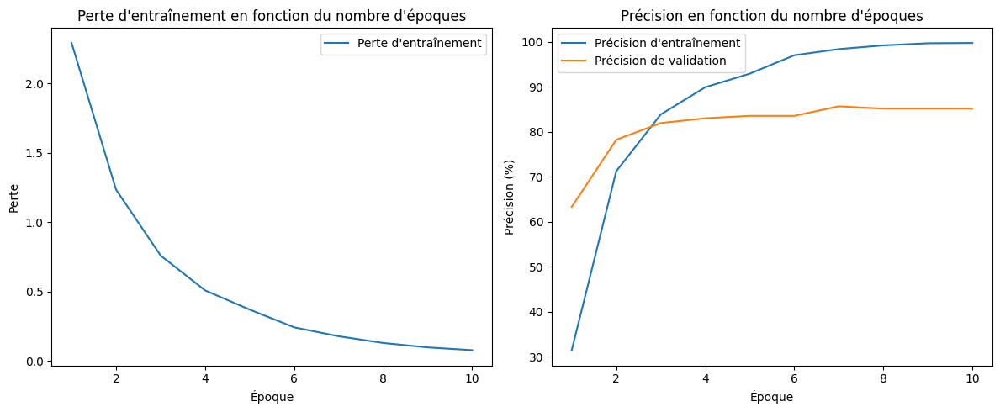

Entraînement avec les paramètres : {'batch_size': 32, 'gamma': 0.1, 'lr': 0.001, 'num_epochs': 20, 'optimizer': 'adam', 'step_size': 5}
Époque [1/20], Perte : 1.8082, Précision Entraînement : 46.62%, Précision Validation : 47.34%
Époque [2/20], Perte : 1.0192, Précision Entraînement : 68.84%, Précision Validation : 63.30%
Époque [3/20], Perte : 0.6434, Précision Entraînement : 80.04%, Précision Validation : 60.64%
Époque [4/20], Perte : 0.5448, Précision Entraînement : 83.00%, Précision Validation : 50.00%
Époque [5/20], Perte : 0.3546, Précision Entraînement : 88.33%, Précision Validation : 64.89%
Époque [6/20], Perte : 0.1857, Précision Entraînement : 94.43%, Précision Validation : 86.17%
Époque [7/20], Perte : 0.0698, Précision Entraînement : 98.93%, Précision Validation : 85.64%
Époque [8/20], Perte : 0.0451, Précision Entraînement : 99.53%, Précision Validation : 82.98%
Époque [9/20], Perte : 0.0343, Précision Entraînement : 99.64%, Précision Validation : 84.57%
Époque [10/20], Pe

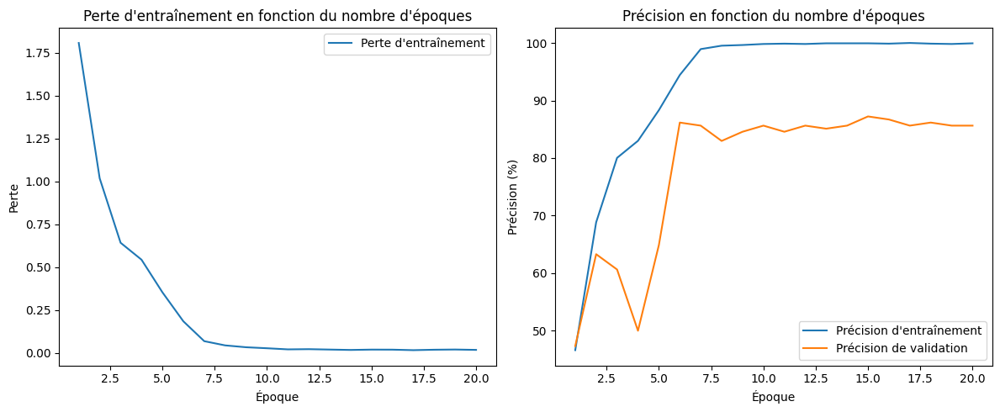

Entraînement avec les paramètres : {'batch_size': 32, 'gamma': 0.1, 'lr': 0.001, 'num_epochs': 20, 'optimizer': 'adam', 'step_size': 10}
Époque [1/20], Perte : 1.7385, Précision Entraînement : 51.01%, Précision Validation : 40.43%
Époque [2/20], Perte : 1.0426, Précision Entraînement : 66.88%, Précision Validation : 52.13%
Époque [3/20], Perte : 0.7335, Précision Entraînement : 77.07%, Précision Validation : 46.81%
Époque [4/20], Perte : 0.5792, Précision Entraînement : 81.64%, Précision Validation : 68.09%
Époque [5/20], Perte : 0.3753, Précision Entraînement : 87.50%, Précision Validation : 70.74%
Époque [6/20], Perte : 0.3274, Précision Entraînement : 89.69%, Précision Validation : 63.83%
Époque [7/20], Perte : 0.2428, Précision Entraînement : 92.36%, Précision Validation : 64.36%
Époque [8/20], Perte : 0.1699, Précision Entraînement : 94.49%, Précision Validation : 61.70%
Époque [9/20], Perte : 0.1653, Précision Entraînement : 95.20%, Précision Validation : 55.85%
Époque [10/20], P

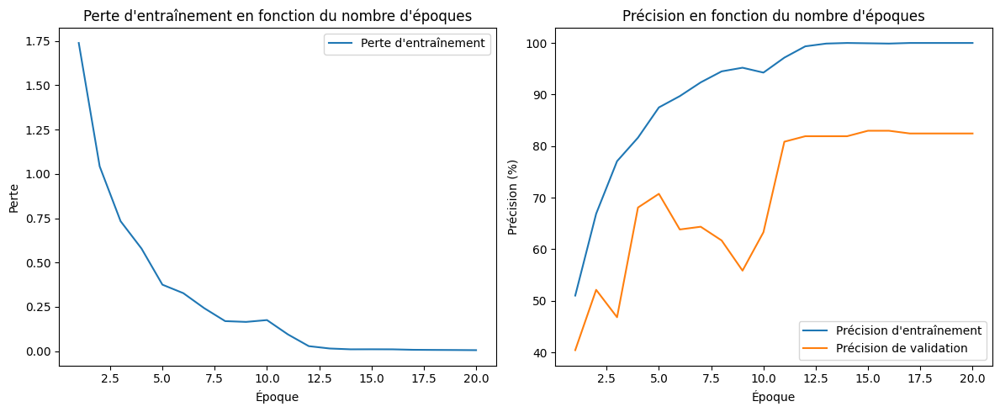

Entraînement avec les paramètres : {'batch_size': 32, 'gamma': 0.1, 'lr': 0.001, 'num_epochs': 20, 'optimizer': 'sgd', 'step_size': 5}
Époque [1/20], Perte : 2.3133, Précision Entraînement : 29.68%, Précision Validation : 60.64%
Époque [2/20], Perte : 1.2352, Précision Entraînement : 71.92%, Précision Validation : 76.60%
Époque [3/20], Perte : 0.7478, Précision Entraînement : 83.83%, Précision Validation : 80.85%
Époque [4/20], Perte : 0.5039, Précision Entraînement : 89.57%, Précision Validation : 82.45%
Époque [5/20], Perte : 0.3489, Précision Entraînement : 94.25%, Précision Validation : 84.57%
Époque [6/20], Perte : 0.2577, Précision Entraînement : 96.56%, Précision Validation : 84.57%
Époque [7/20], Perte : 0.2487, Précision Entraînement : 97.10%, Précision Validation : 84.04%
Époque [8/20], Perte : 0.2364, Précision Entraînement : 97.27%, Précision Validation : 85.11%
Époque [9/20], Perte : 0.2314, Précision Entraînement : 97.69%, Précision Validation : 85.11%
Époque [10/20], Per

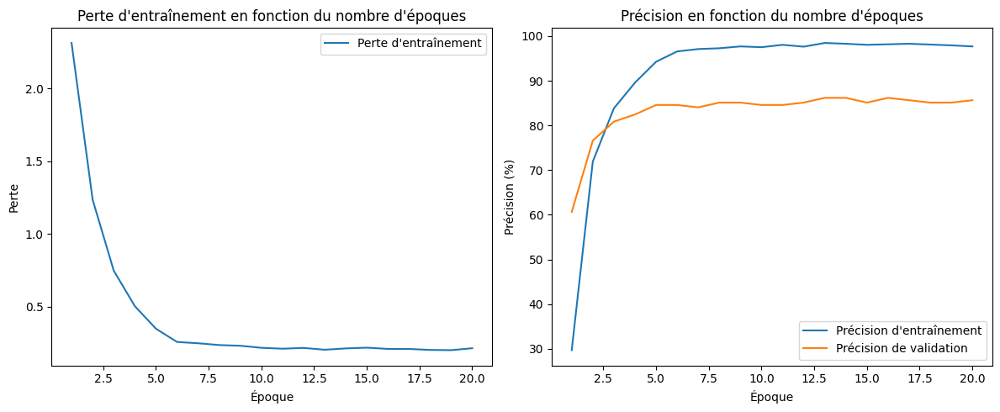

Entraînement avec les paramètres : {'batch_size': 32, 'gamma': 0.1, 'lr': 0.001, 'num_epochs': 20, 'optimizer': 'sgd', 'step_size': 10}
Époque [1/20], Perte : 2.3380, Précision Entraînement : 29.03%, Précision Validation : 60.11%
Époque [2/20], Perte : 1.2234, Précision Entraînement : 70.26%, Précision Validation : 76.06%
Époque [3/20], Perte : 0.7587, Précision Entraînement : 82.76%, Précision Validation : 80.85%
Époque [4/20], Perte : 0.5083, Précision Entraînement : 88.92%, Précision Validation : 82.98%
Époque [5/20], Perte : 0.3554, Précision Entraînement : 92.95%, Précision Validation : 82.45%
Époque [6/20], Perte : 0.2457, Précision Entraînement : 96.74%, Précision Validation : 84.57%
Époque [7/20], Perte : 0.1794, Précision Entraînement : 97.81%, Précision Validation : 85.11%
Époque [8/20], Perte : 0.1356, Précision Entraînement : 98.93%, Précision Validation : 85.11%
Époque [9/20], Perte : 0.1035, Précision Entraînement : 99.53%, Précision Validation : 85.11%
Époque [10/20], Pe

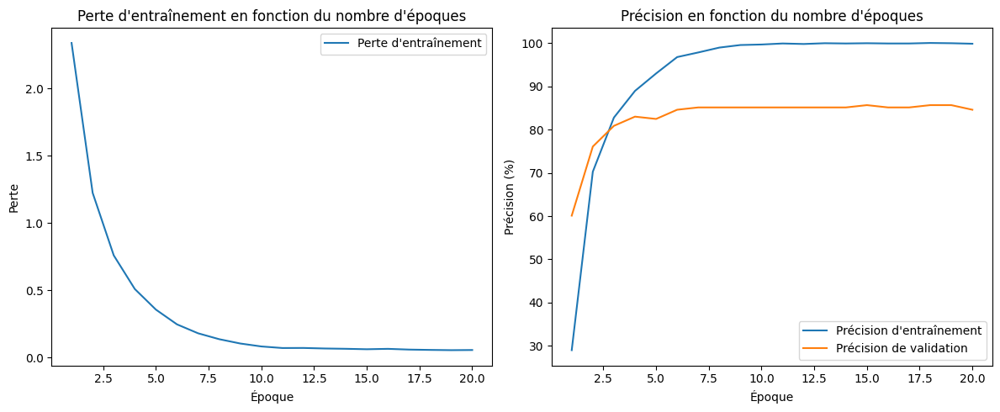

Entraînement avec les paramètres : {'batch_size': 32, 'gamma': 0.1, 'lr': 0.0001, 'num_epochs': 10, 'optimizer': 'adam', 'step_size': 5}
Époque [1/10], Perte : 1.5569, Précision Entraînement : 56.28%, Précision Validation : 79.26%
Époque [2/10], Perte : 0.4127, Précision Entraînement : 91.17%, Précision Validation : 82.98%
Époque [3/10], Perte : 0.1380, Précision Entraînement : 99.05%, Précision Validation : 85.64%
Époque [4/10], Perte : 0.0594, Précision Entraînement : 99.76%, Précision Validation : 87.77%
Époque [5/10], Perte : 0.0319, Précision Entraînement : 99.94%, Précision Validation : 88.30%
Époque [6/10], Perte : 0.0202, Précision Entraînement : 100.00%, Précision Validation : 88.83%
Époque [7/10], Perte : 0.0184, Précision Entraînement : 100.00%, Précision Validation : 87.23%
Époque [8/10], Perte : 0.0202, Précision Entraînement : 100.00%, Précision Validation : 87.77%
Époque [9/10], Perte : 0.0179, Précision Entraînement : 100.00%, Précision Validation : 87.77%
Époque [10/10

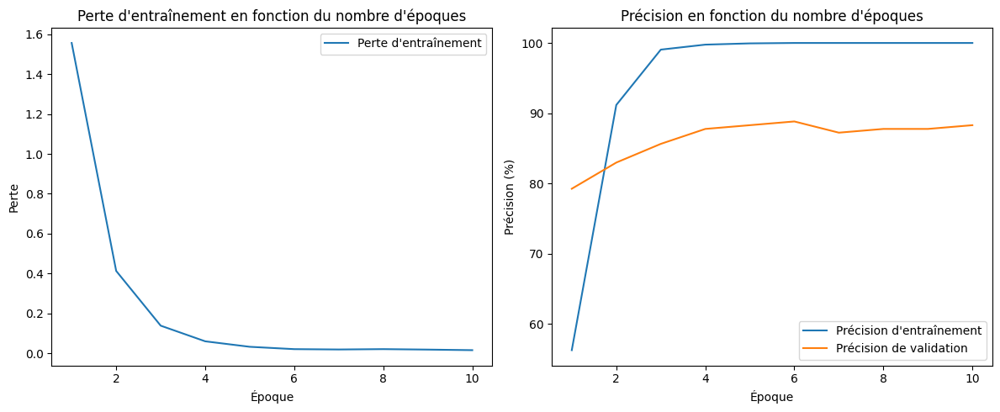

Entraînement avec les paramètres : {'batch_size': 32, 'gamma': 0.1, 'lr': 0.0001, 'num_epochs': 10, 'optimizer': 'adam', 'step_size': 10}
Époque [1/10], Perte : 1.5247, Précision Entraînement : 57.11%, Précision Validation : 82.98%
Époque [2/10], Perte : 0.4067, Précision Entraînement : 92.18%, Précision Validation : 84.04%
Époque [3/10], Perte : 0.1380, Précision Entraînement : 98.70%, Précision Validation : 84.57%
Époque [4/10], Perte : 0.0636, Précision Entraînement : 99.82%, Précision Validation : 86.70%
Époque [5/10], Perte : 0.0313, Précision Entraînement : 100.00%, Précision Validation : 85.11%
Époque [6/10], Perte : 0.0198, Précision Entraînement : 99.94%, Précision Validation : 87.23%
Époque [7/10], Perte : 0.0135, Précision Entraînement : 100.00%, Précision Validation : 86.70%
Époque [8/10], Perte : 0.0120, Précision Entraînement : 100.00%, Précision Validation : 86.70%
Époque [9/10], Perte : 0.0094, Précision Entraînement : 100.00%, Précision Validation : 87.77%
Époque [10/1

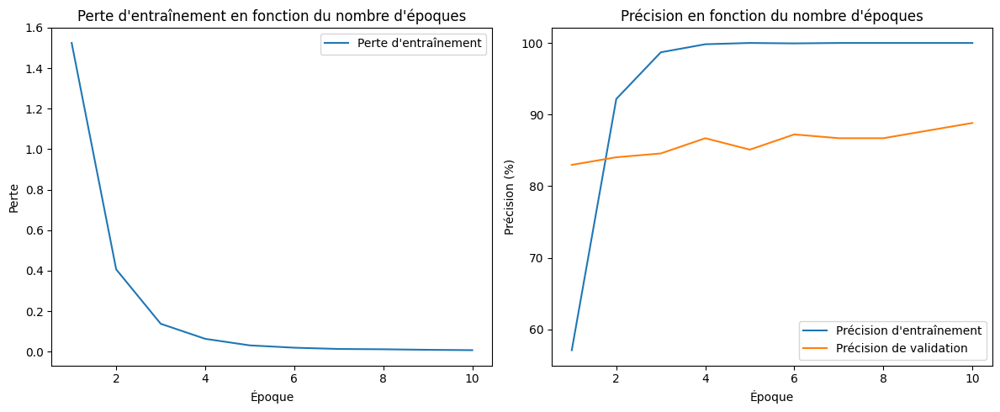

Entraînement avec les paramètres : {'batch_size': 32, 'gamma': 0.1, 'lr': 0.0001, 'num_epochs': 10, 'optimizer': 'sgd', 'step_size': 5}
Époque [1/10], Perte : 2.7840, Précision Entraînement : 10.13%, Précision Validation : 12.77%
Époque [2/10], Perte : 2.5150, Précision Entraînement : 19.91%, Précision Validation : 19.15%
Époque [3/10], Perte : 2.3252, Précision Entraînement : 31.58%, Précision Validation : 34.04%
Époque [4/10], Perte : 2.1588, Précision Entraînement : 41.82%, Précision Validation : 44.15%
Époque [5/10], Perte : 2.0007, Précision Entraînement : 49.23%, Précision Validation : 47.34%
Époque [6/10], Perte : 1.9134, Précision Entraînement : 52.67%, Précision Validation : 51.06%
Époque [7/10], Perte : 1.8998, Précision Entraînement : 55.33%, Précision Validation : 50.53%
Époque [8/10], Perte : 1.8768, Précision Entraînement : 55.63%, Précision Validation : 50.00%
Époque [9/10], Perte : 1.8745, Précision Entraînement : 55.98%, Précision Validation : 55.32%
Époque [10/10], Pe

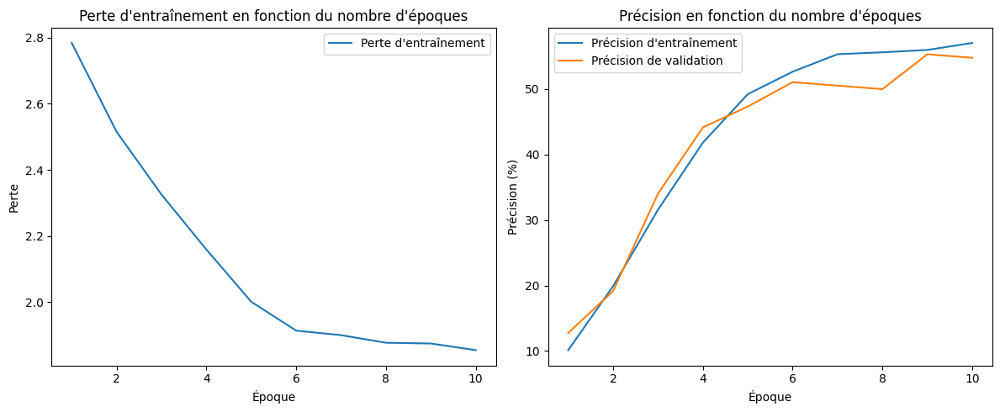

Entraînement avec les paramètres : {'batch_size': 32, 'gamma': 0.1, 'lr': 0.0001, 'num_epochs': 10, 'optimizer': 'sgd', 'step_size': 10}
Époque [1/10], Perte : 2.7910, Précision Entraînement : 7.17%, Précision Validation : 9.57%
Époque [2/10], Perte : 2.5620, Précision Entraînement : 15.94%, Précision Validation : 20.21%
Époque [3/10], Perte : 2.3790, Précision Entraînement : 26.84%, Précision Validation : 30.32%
Époque [4/10], Perte : 2.2120, Précision Entraînement : 39.04%, Précision Validation : 45.74%
Époque [5/10], Perte : 2.0525, Précision Entraînement : 48.10%, Précision Validation : 49.47%
Époque [6/10], Perte : 1.9097, Précision Entraînement : 55.57%, Précision Validation : 57.45%
Époque [7/10], Perte : 1.7761, Précision Entraînement : 60.01%, Précision Validation : 60.11%
Époque [8/10], Perte : 1.6548, Précision Entraînement : 63.80%, Précision Validation : 65.43%
Époque [9/10], Perte : 1.5395, Précision Entraînement : 67.54%, Précision Validation : 66.49%
Époque [10/10], Per

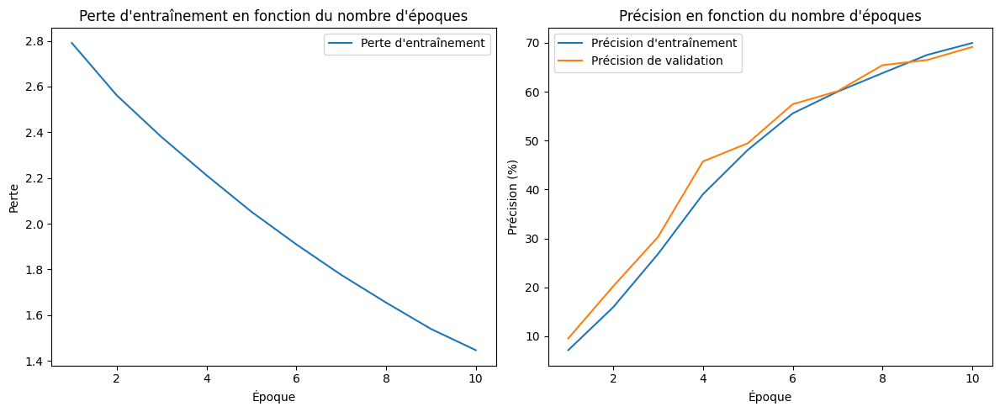

Entraînement avec les paramètres : {'batch_size': 32, 'gamma': 0.1, 'lr': 0.0001, 'num_epochs': 20, 'optimizer': 'adam', 'step_size': 5}
Époque [1/20], Perte : 1.5785, Précision Entraînement : 55.15%, Précision Validation : 80.32%
Époque [2/20], Perte : 0.4242, Précision Entraînement : 92.30%, Précision Validation : 84.57%
Époque [3/20], Perte : 0.1495, Précision Entraînement : 98.82%, Précision Validation : 83.51%
Époque [4/20], Perte : 0.0607, Précision Entraînement : 99.94%, Précision Validation : 87.23%
Époque [5/20], Perte : 0.0319, Précision Entraînement : 100.00%, Précision Validation : 87.23%
Époque [6/20], Perte : 0.0220, Précision Entraînement : 100.00%, Précision Validation : 86.70%
Époque [7/20], Perte : 0.0227, Précision Entraînement : 100.00%, Précision Validation : 86.17%
Époque [8/20], Perte : 0.0214, Précision Entraînement : 100.00%, Précision Validation : 86.70%
Époque [9/20], Perte : 0.0187, Précision Entraînement : 100.00%, Précision Validation : 87.23%
Époque [10/2

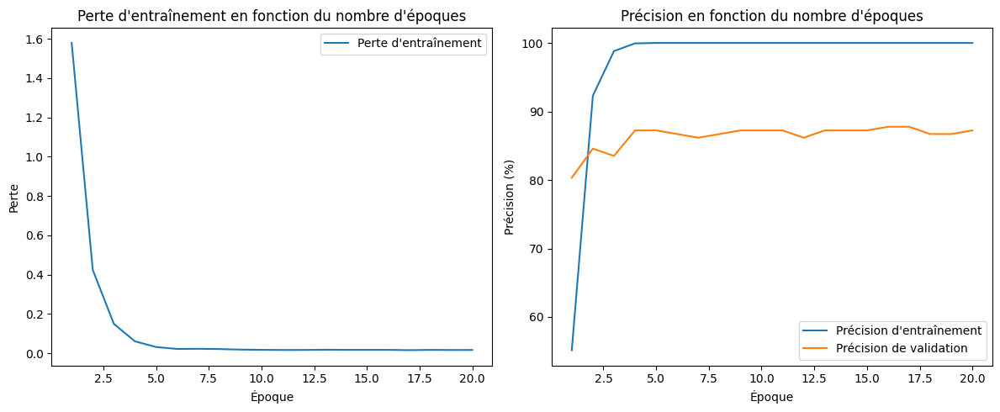

Entraînement avec les paramètres : {'batch_size': 32, 'gamma': 0.1, 'lr': 0.0001, 'num_epochs': 20, 'optimizer': 'adam', 'step_size': 10}
Époque [1/20], Perte : 1.5749, Précision Entraînement : 54.38%, Précision Validation : 81.38%
Époque [2/20], Perte : 0.4157, Précision Entraînement : 92.00%, Précision Validation : 87.77%
Époque [3/20], Perte : 0.1482, Précision Entraînement : 99.05%, Précision Validation : 87.77%
Époque [4/20], Perte : 0.0581, Précision Entraînement : 99.76%, Précision Validation : 87.23%
Époque [5/20], Perte : 0.0310, Précision Entraînement : 100.00%, Précision Validation : 88.83%
Époque [6/20], Perte : 0.0199, Précision Entraînement : 100.00%, Précision Validation : 85.64%
Époque [7/20], Perte : 0.0158, Précision Entraînement : 100.00%, Précision Validation : 87.23%
Époque [8/20], Perte : 0.0119, Précision Entraînement : 100.00%, Précision Validation : 87.23%
Époque [9/20], Perte : 0.0094, Précision Entraînement : 100.00%, Précision Validation : 87.77%
Époque [10/

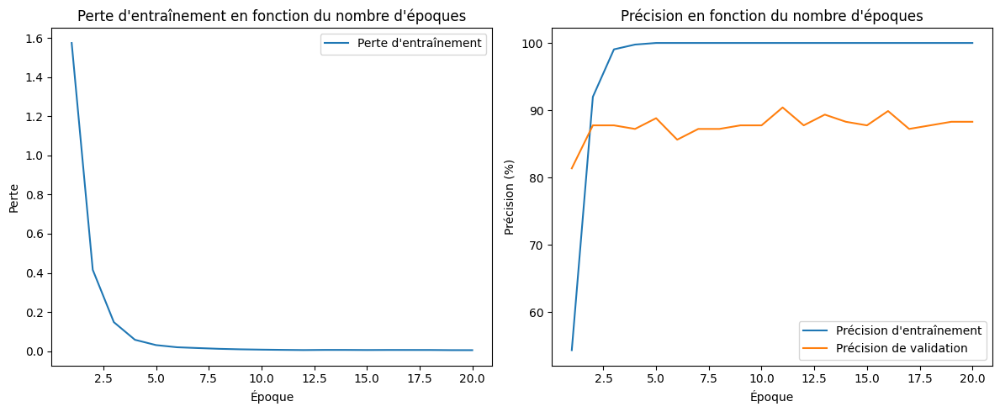

Entraînement avec les paramètres : {'batch_size': 32, 'gamma': 0.1, 'lr': 0.0001, 'num_epochs': 20, 'optimizer': 'sgd', 'step_size': 5}
Époque [1/20], Perte : 2.7851, Précision Entraînement : 10.07%, Précision Validation : 10.64%
Époque [2/20], Perte : 2.5242, Précision Entraînement : 20.26%, Précision Validation : 22.87%
Époque [3/20], Perte : 2.3445, Précision Entraînement : 30.45%, Précision Validation : 33.51%
Époque [4/20], Perte : 2.1822, Précision Entraînement : 39.81%, Précision Validation : 43.62%
Époque [5/20], Perte : 2.0155, Précision Entraînement : 48.52%, Précision Validation : 53.72%
Époque [6/20], Perte : 1.9320, Précision Entraînement : 52.61%, Précision Validation : 51.60%
Époque [7/20], Perte : 1.9084, Précision Entraînement : 54.50%, Précision Validation : 55.32%
Époque [8/20], Perte : 1.9005, Précision Entraînement : 54.98%, Précision Validation : 55.32%
Époque [9/20], Perte : 1.8931, Précision Entraînement : 54.80%, Précision Validation : 54.26%
Époque [10/20], Pe

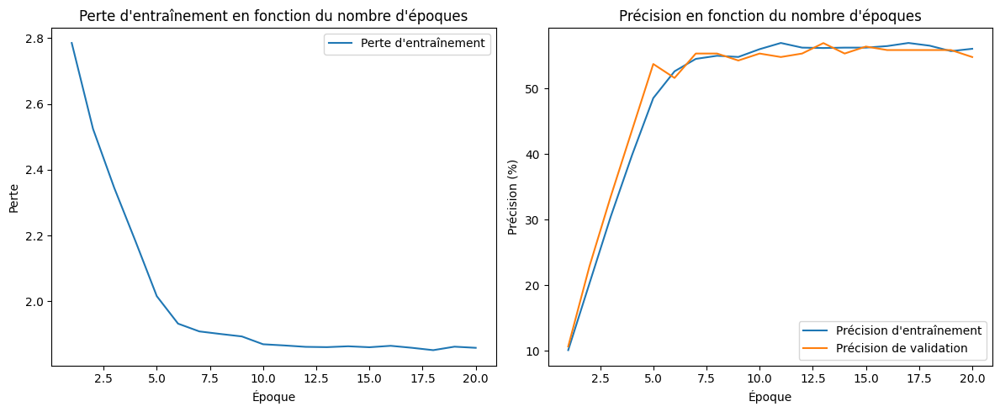

Entraînement avec les paramètres : {'batch_size': 32, 'gamma': 0.1, 'lr': 0.0001, 'num_epochs': 20, 'optimizer': 'sgd', 'step_size': 10}
Époque [1/20], Perte : 2.8403, Précision Entraînement : 7.23%, Précision Validation : 9.57%
Époque [2/20], Perte : 2.5641, Précision Entraînement : 17.36%, Précision Validation : 22.34%
Époque [3/20], Perte : 2.3725, Précision Entraînement : 29.32%, Précision Validation : 31.91%
Époque [4/20], Perte : 2.2087, Précision Entraînement : 38.92%, Précision Validation : 44.68%
Époque [5/20], Perte : 2.0521, Précision Entraînement : 48.82%, Précision Validation : 53.19%
Époque [6/20], Perte : 1.9049, Précision Entraînement : 55.86%, Précision Validation : 56.38%
Époque [7/20], Perte : 1.7741, Précision Entraînement : 60.37%, Précision Validation : 59.04%
Époque [8/20], Perte : 1.6547, Précision Entraînement : 64.57%, Précision Validation : 61.17%
Époque [9/20], Perte : 1.5386, Précision Entraînement : 68.19%, Précision Validation : 62.77%
Époque [10/20], Per

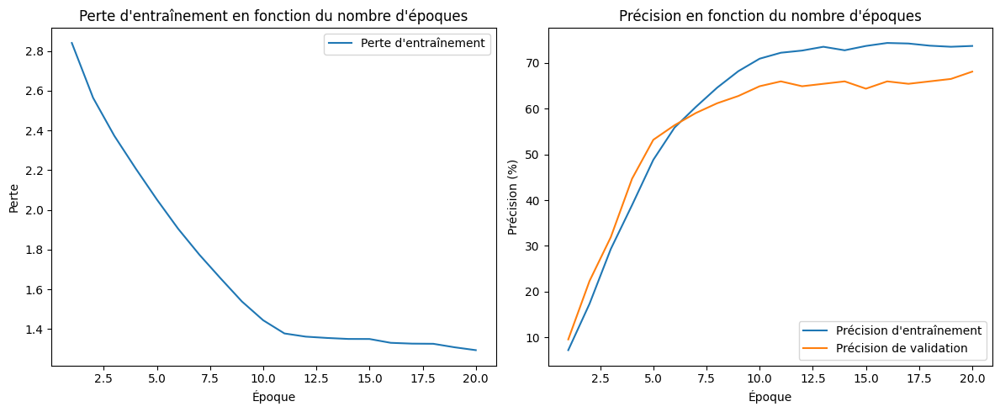

Entraînement avec les paramètres : {'batch_size': 32, 'gamma': 0.5, 'lr': 0.001, 'num_epochs': 10, 'optimizer': 'adam', 'step_size': 5}
Époque [1/10], Perte : 1.6783, Précision Entraînement : 50.30%, Précision Validation : 59.57%
Époque [2/10], Perte : 1.0528, Précision Entraînement : 67.12%, Précision Validation : 42.02%
Époque [3/10], Perte : 0.7261, Précision Entraînement : 78.20%, Précision Validation : 59.04%
Époque [4/10], Perte : 0.5524, Précision Entraînement : 81.87%, Précision Validation : 53.19%
Époque [5/10], Perte : 0.4133, Précision Entraînement : 86.91%, Précision Validation : 71.81%
Époque [6/10], Perte : 0.1911, Précision Entraînement : 94.43%, Précision Validation : 79.79%
Époque [7/10], Perte : 0.0501, Précision Entraînement : 99.05%, Précision Validation : 84.04%
Époque [8/10], Perte : 0.0242, Précision Entraînement : 99.64%, Précision Validation : 85.64%
Époque [9/10], Perte : 0.0131, Précision Entraînement : 99.88%, Précision Validation : 87.77%
Époque [10/10], Pe

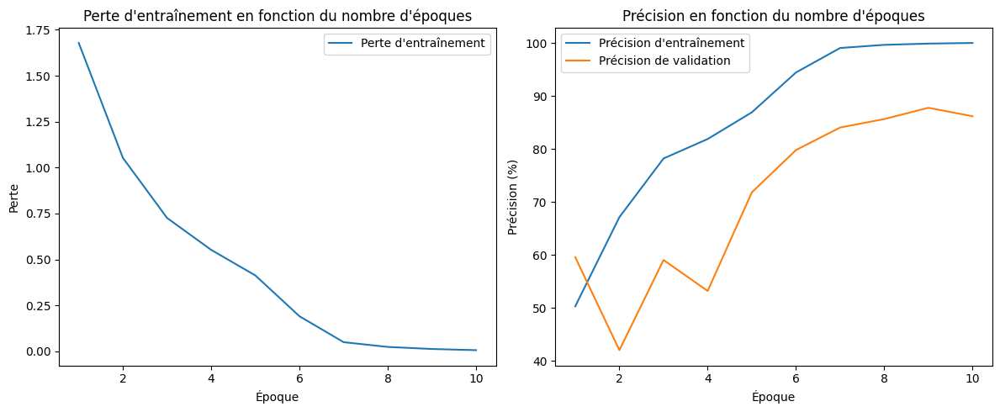

Entraînement avec les paramètres : {'batch_size': 32, 'gamma': 0.5, 'lr': 0.001, 'num_epochs': 10, 'optimizer': 'adam', 'step_size': 10}
Époque [1/10], Perte : 1.6186, Précision Entraînement : 51.07%, Précision Validation : 37.23%
Époque [2/10], Perte : 0.9052, Précision Entraînement : 72.45%, Précision Validation : 61.17%
Époque [3/10], Perte : 0.6661, Précision Entraînement : 79.09%, Précision Validation : 37.77%
Époque [4/10], Perte : 0.4826, Précision Entraînement : 84.36%, Précision Validation : 43.62%
Époque [5/10], Perte : 0.3227, Précision Entraînement : 89.81%, Précision Validation : 63.83%
Époque [6/10], Perte : 0.2473, Précision Entraînement : 92.00%, Précision Validation : 71.28%
Époque [7/10], Perte : 0.2213, Précision Entraînement : 92.83%, Précision Validation : 70.74%
Époque [8/10], Perte : 0.2385, Précision Entraînement : 91.94%, Précision Validation : 63.83%
Époque [9/10], Perte : 0.2042, Précision Entraînement : 93.13%, Précision Validation : 73.40%
Époque [10/10], P

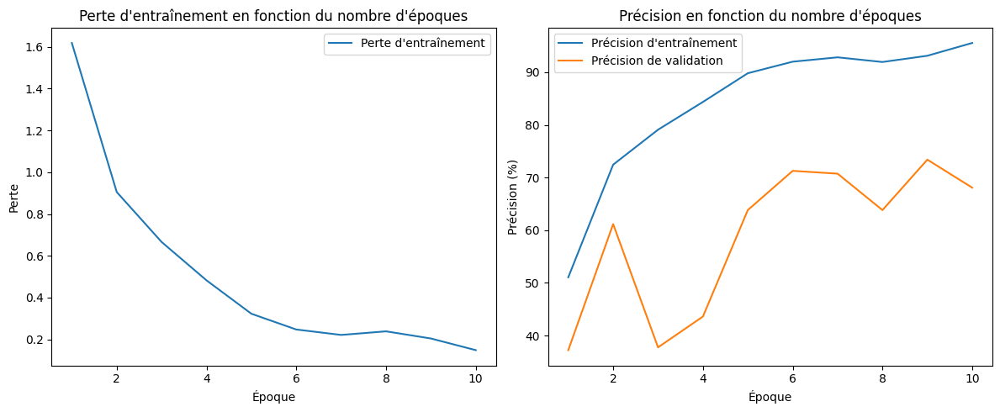

Entraînement avec les paramètres : {'batch_size': 32, 'gamma': 0.5, 'lr': 0.001, 'num_epochs': 10, 'optimizer': 'sgd', 'step_size': 5}
Époque [1/10], Perte : 2.3026, Précision Entraînement : 31.04%, Précision Validation : 64.89%
Époque [2/10], Perte : 1.2107, Précision Entraînement : 71.86%, Précision Validation : 79.79%
Époque [3/10], Perte : 0.7649, Précision Entraînement : 83.00%, Précision Validation : 80.32%
Époque [4/10], Perte : 0.5037, Précision Entraînement : 89.28%, Précision Validation : 82.45%
Époque [5/10], Perte : 0.3348, Précision Entraînement : 93.84%, Précision Validation : 84.04%
Époque [6/10], Perte : 0.2398, Précision Entraînement : 96.86%, Précision Validation : 84.57%
Époque [7/10], Perte : 0.2066, Précision Entraînement : 98.05%, Précision Validation : 85.64%
Époque [8/10], Perte : 0.1837, Précision Entraînement : 98.28%, Précision Validation : 84.57%
Époque [9/10], Perte : 0.1546, Précision Entraînement : 98.82%, Précision Validation : 84.04%
Époque [10/10], Per

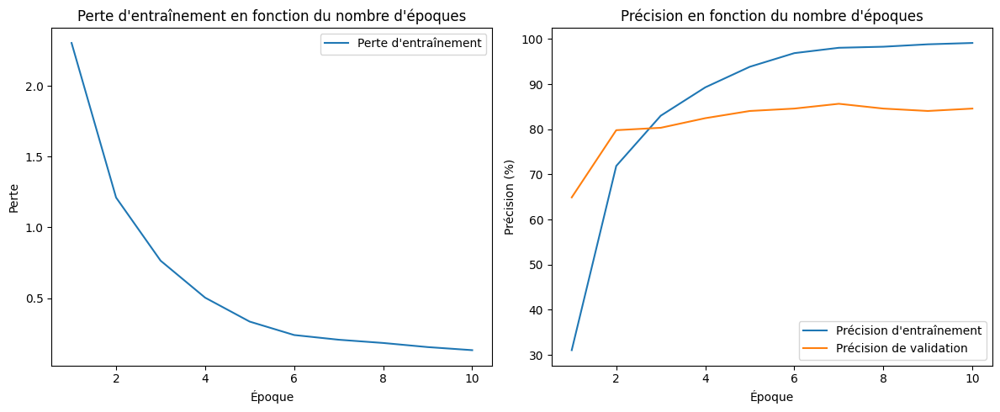

Entraînement avec les paramètres : {'batch_size': 32, 'gamma': 0.5, 'lr': 0.001, 'num_epochs': 10, 'optimizer': 'sgd', 'step_size': 10}
Époque [1/10], Perte : 2.3336, Précision Entraînement : 29.92%, Précision Validation : 62.77%
Époque [2/10], Perte : 1.2243, Précision Entraînement : 71.45%, Précision Validation : 75.53%
Époque [3/10], Perte : 0.7580, Précision Entraînement : 82.82%, Précision Validation : 80.32%
Époque [4/10], Perte : 0.5185, Précision Entraînement : 89.04%, Précision Validation : 82.45%
Époque [5/10], Perte : 0.3455, Précision Entraînement : 93.66%, Précision Validation : 81.91%
Époque [6/10], Perte : 0.2410, Précision Entraînement : 96.92%, Précision Validation : 82.98%
Époque [7/10], Perte : 0.1667, Précision Entraînement : 98.40%, Précision Validation : 85.64%
Époque [8/10], Perte : 0.1220, Précision Entraînement : 99.35%, Précision Validation : 84.57%
Époque [9/10], Perte : 0.1029, Précision Entraînement : 99.41%, Précision Validation : 84.04%
Époque [10/10], Pe

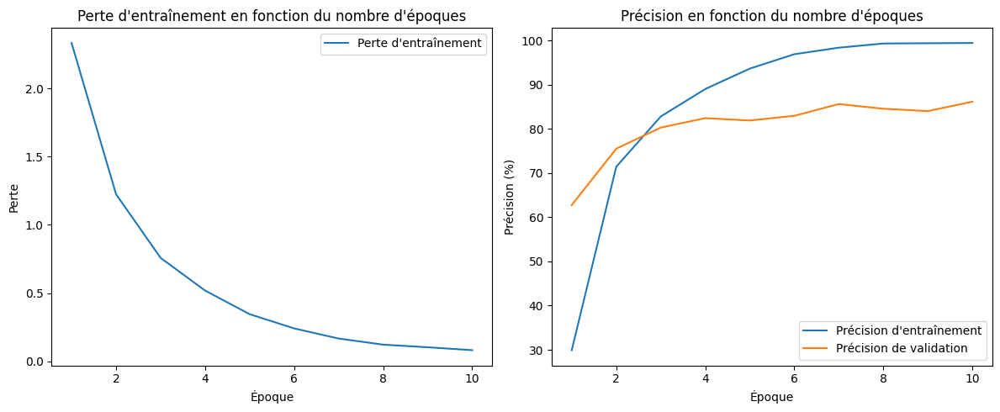

Entraînement avec les paramètres : {'batch_size': 32, 'gamma': 0.5, 'lr': 0.001, 'num_epochs': 20, 'optimizer': 'adam', 'step_size': 5}
Époque [1/20], Perte : 1.5967, Précision Entraînement : 52.13%, Précision Validation : 43.09%
Époque [2/20], Perte : 1.0545, Précision Entraînement : 67.24%, Précision Validation : 56.91%
Époque [3/20], Perte : 0.7332, Précision Entraînement : 77.90%, Précision Validation : 63.30%
Époque [4/20], Perte : 0.4237, Précision Entraînement : 86.55%, Précision Validation : 45.74%
Époque [5/20], Perte : 0.3184, Précision Entraînement : 90.23%, Précision Validation : 44.68%
Époque [6/20], Perte : 0.1355, Précision Entraînement : 96.27%, Précision Validation : 79.79%
Époque [7/20], Perte : 0.0505, Précision Entraînement : 98.64%, Précision Validation : 82.98%
Époque [8/20], Perte : 0.0216, Précision Entraînement : 99.64%, Précision Validation : 83.51%
Époque [9/20], Perte : 0.0140, Précision Entraînement : 99.82%, Précision Validation : 83.51%
Époque [10/20], Pe

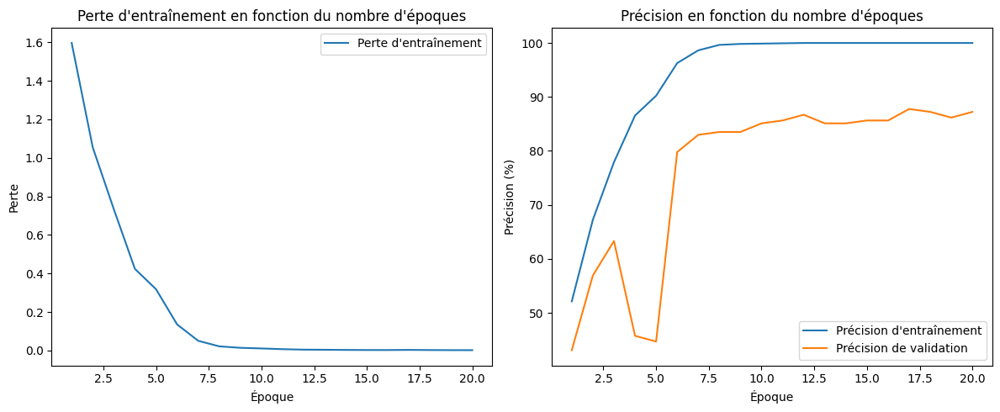

Entraînement avec les paramètres : {'batch_size': 32, 'gamma': 0.5, 'lr': 0.001, 'num_epochs': 20, 'optimizer': 'adam', 'step_size': 10}
Époque [1/20], Perte : 1.6732, Précision Entraînement : 49.82%, Précision Validation : 20.74%
Époque [2/20], Perte : 0.9506, Précision Entraînement : 71.98%, Précision Validation : 55.85%
Époque [3/20], Perte : 0.6581, Précision Entraînement : 79.38%, Précision Validation : 66.49%
Époque [4/20], Perte : 0.4921, Précision Entraînement : 84.54%, Précision Validation : 55.85%
Époque [5/20], Perte : 0.4259, Précision Entraînement : 86.14%, Précision Validation : 44.15%
Époque [6/20], Perte : 0.3200, Précision Entraînement : 90.17%, Précision Validation : 48.94%
Époque [7/20], Perte : 0.2200, Précision Entraînement : 92.95%, Précision Validation : 68.09%
Époque [8/20], Perte : 0.1669, Précision Entraînement : 95.08%, Précision Validation : 56.38%
Époque [9/20], Perte : 0.1326, Précision Entraînement : 95.62%, Précision Validation : 69.68%
Époque [10/20], P

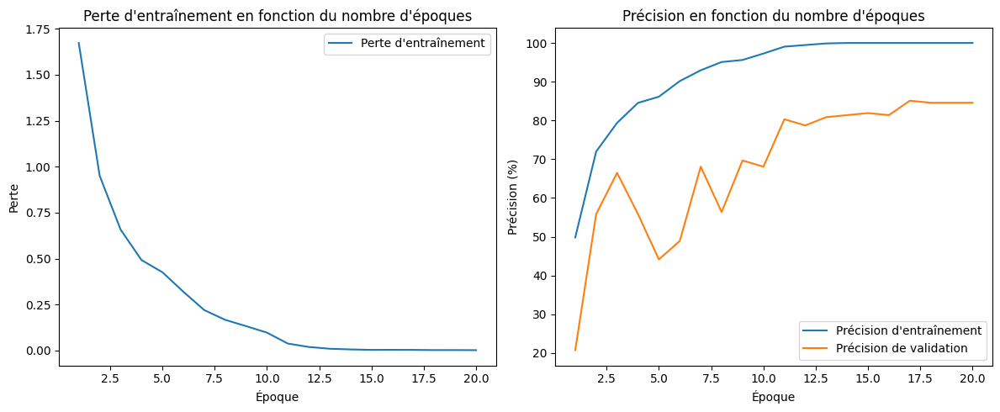

Entraînement avec les paramètres : {'batch_size': 32, 'gamma': 0.5, 'lr': 0.001, 'num_epochs': 20, 'optimizer': 'sgd', 'step_size': 5}
Époque [1/20], Perte : 2.2988, Précision Entraînement : 30.09%, Précision Validation : 59.04%
Époque [2/20], Perte : 1.2130, Précision Entraînement : 72.57%, Précision Validation : 76.60%
Époque [3/20], Perte : 0.7386, Précision Entraînement : 83.65%, Précision Validation : 81.91%
Époque [4/20], Perte : 0.4925, Précision Entraînement : 89.69%, Précision Validation : 81.91%
Époque [5/20], Perte : 0.3332, Précision Entraînement : 94.43%, Précision Validation : 82.45%
Époque [6/20], Perte : 0.2436, Précision Entraînement : 97.10%, Précision Validation : 82.45%
Époque [7/20], Perte : 0.1954, Précision Entraînement : 98.22%, Précision Validation : 82.45%
Époque [8/20], Perte : 0.1724, Précision Entraînement : 98.22%, Précision Validation : 82.45%
Époque [9/20], Perte : 0.1503, Précision Entraînement : 99.17%, Précision Validation : 83.51%
Époque [10/20], Per

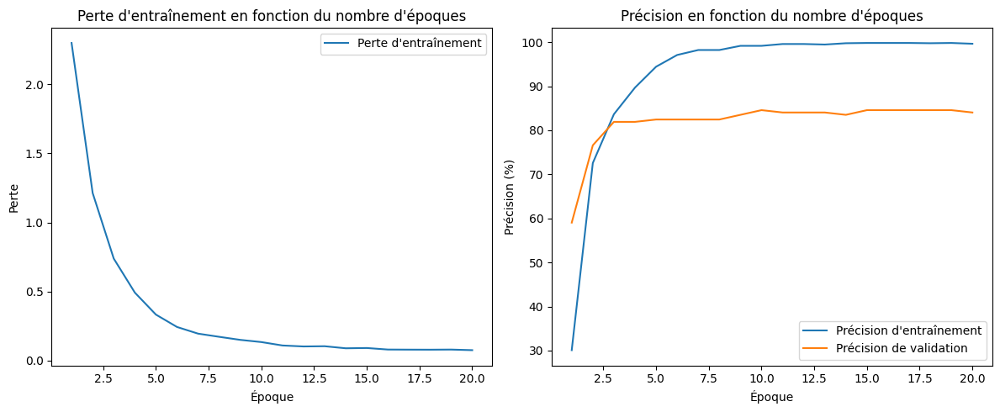

Entraînement avec les paramètres : {'batch_size': 32, 'gamma': 0.5, 'lr': 0.001, 'num_epochs': 20, 'optimizer': 'sgd', 'step_size': 10}
Époque [1/20], Perte : 2.2877, Précision Entraînement : 30.04%, Précision Validation : 62.77%
Époque [2/20], Perte : 1.2119, Précision Entraînement : 71.45%, Précision Validation : 75.00%
Époque [3/20], Perte : 0.7300, Précision Entraînement : 83.47%, Précision Validation : 80.85%
Époque [4/20], Perte : 0.5025, Précision Entraînement : 89.63%, Précision Validation : 79.79%
Époque [5/20], Perte : 0.3470, Précision Entraînement : 93.66%, Précision Validation : 80.85%
Époque [6/20], Perte : 0.2439, Précision Entraînement : 96.21%, Précision Validation : 80.85%
Époque [7/20], Perte : 0.1728, Précision Entraînement : 98.10%, Précision Validation : 82.98%
Époque [8/20], Perte : 0.1358, Précision Entraînement : 98.82%, Précision Validation : 83.51%
Époque [9/20], Perte : 0.1038, Précision Entraînement : 99.29%, Précision Validation : 84.04%
Époque [10/20], Pe

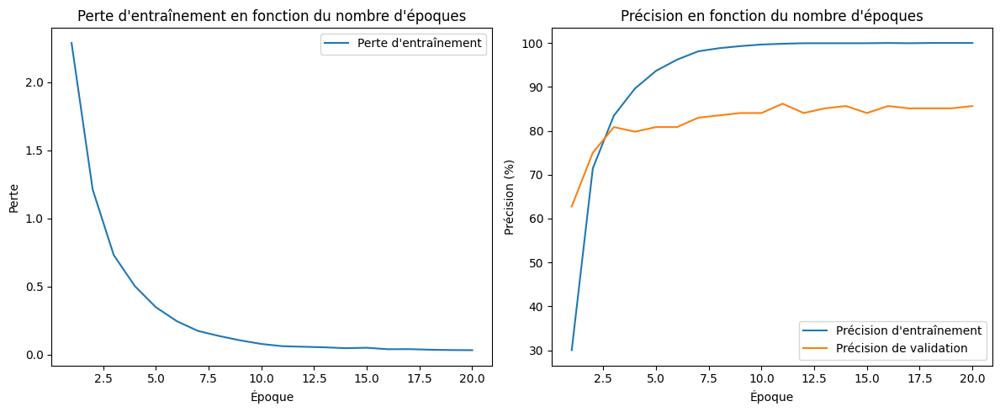

Entraînement avec les paramètres : {'batch_size': 32, 'gamma': 0.5, 'lr': 0.0001, 'num_epochs': 10, 'optimizer': 'adam', 'step_size': 5}
Époque [1/10], Perte : 1.5750, Précision Entraînement : 56.10%, Précision Validation : 82.45%
Époque [2/10], Perte : 0.4197, Précision Entraînement : 91.11%, Précision Validation : 84.57%
Époque [3/10], Perte : 0.1471, Précision Entraînement : 98.99%, Précision Validation : 88.30%
Époque [4/10], Perte : 0.0630, Précision Entraînement : 99.82%, Précision Validation : 85.11%
Époque [5/10], Perte : 0.0324, Précision Entraînement : 100.00%, Précision Validation : 87.23%
Époque [6/10], Perte : 0.0222, Précision Entraînement : 100.00%, Précision Validation : 87.77%
Époque [7/10], Perte : 0.0159, Précision Entraînement : 100.00%, Précision Validation : 87.77%
Époque [8/10], Perte : 0.0151, Précision Entraînement : 100.00%, Précision Validation : 87.23%
Époque [9/10], Perte : 0.0126, Précision Entraînement : 100.00%, Précision Validation : 86.17%
Époque [10/1

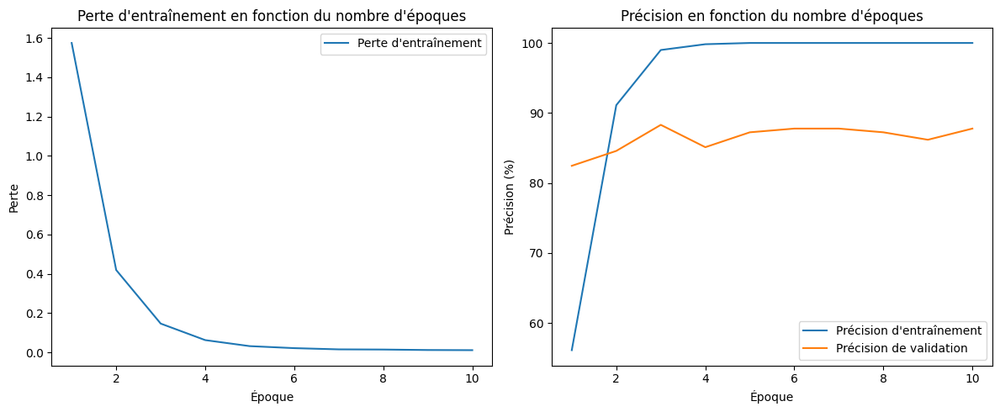

Entraînement avec les paramètres : {'batch_size': 32, 'gamma': 0.5, 'lr': 0.0001, 'num_epochs': 10, 'optimizer': 'adam', 'step_size': 10}
Époque [1/10], Perte : 1.5562, Précision Entraînement : 56.28%, Précision Validation : 80.85%
Époque [2/10], Perte : 0.4087, Précision Entraînement : 91.17%, Précision Validation : 85.64%
Époque [3/10], Perte : 0.1367, Précision Entraînement : 99.05%, Précision Validation : 86.70%
Époque [4/10], Perte : 0.0608, Précision Entraînement : 99.70%, Précision Validation : 88.30%
Époque [5/10], Perte : 0.0303, Précision Entraînement : 100.00%, Précision Validation : 87.23%
Époque [6/10], Perte : 0.0207, Précision Entraînement : 100.00%, Précision Validation : 88.30%
Époque [7/10], Perte : 0.0149, Précision Entraînement : 100.00%, Précision Validation : 87.77%
Époque [8/10], Perte : 0.0108, Précision Entraînement : 100.00%, Précision Validation : 89.36%
Époque [9/10], Perte : 0.0079, Précision Entraînement : 100.00%, Précision Validation : 87.77%
Époque [10/

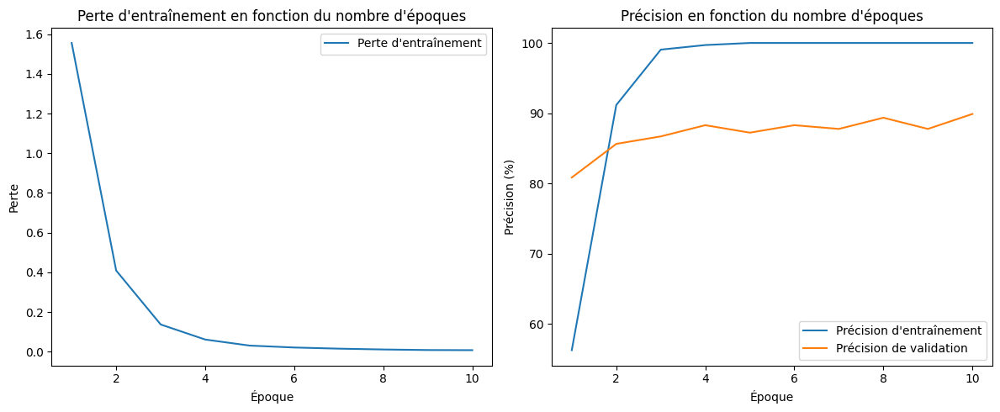

Entraînement avec les paramètres : {'batch_size': 32, 'gamma': 0.5, 'lr': 0.0001, 'num_epochs': 10, 'optimizer': 'sgd', 'step_size': 5}
Époque [1/10], Perte : 2.7773, Précision Entraînement : 8.83%, Précision Validation : 8.51%
Époque [2/10], Perte : 2.5463, Précision Entraînement : 18.78%, Précision Validation : 22.34%
Époque [3/10], Perte : 2.3563, Précision Entraînement : 30.81%, Précision Validation : 37.77%
Époque [4/10], Perte : 2.1889, Précision Entraînement : 40.94%, Précision Validation : 47.87%
Époque [5/10], Perte : 2.0443, Précision Entraînement : 49.35%, Précision Validation : 55.32%
Époque [6/10], Perte : 1.9233, Précision Entraînement : 53.91%, Précision Validation : 59.04%
Époque [7/10], Perte : 1.8537, Précision Entraînement : 57.52%, Précision Validation : 60.11%
Époque [8/10], Perte : 1.7849, Précision Entraînement : 60.60%, Précision Validation : 61.17%
Époque [9/10], Perte : 1.7250, Précision Entraînement : 61.14%, Précision Validation : 62.77%
Époque [10/10], Pert

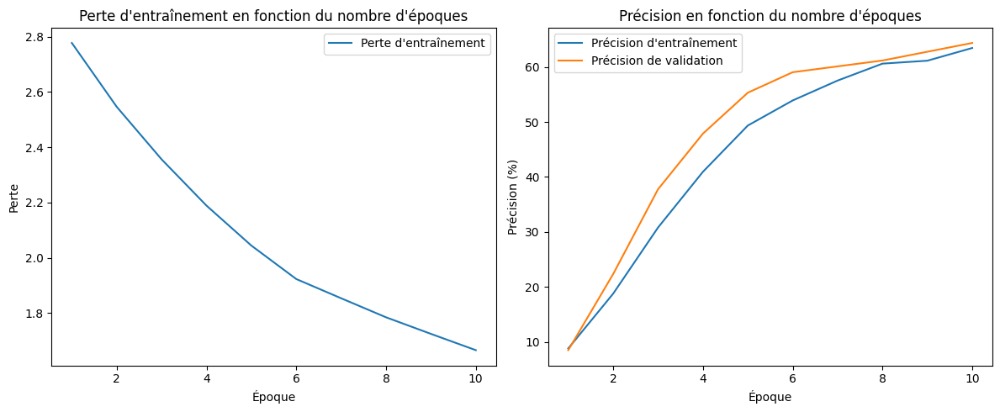

Entraînement avec les paramètres : {'batch_size': 32, 'gamma': 0.5, 'lr': 0.0001, 'num_epochs': 10, 'optimizer': 'sgd', 'step_size': 10}
Époque [1/10], Perte : 2.7564, Précision Entraînement : 9.06%, Précision Validation : 9.57%
Époque [2/10], Perte : 2.4983, Précision Entraînement : 20.91%, Précision Validation : 19.68%
Époque [3/10], Perte : 2.3152, Précision Entraînement : 32.70%, Précision Validation : 34.57%
Époque [4/10], Perte : 2.1541, Précision Entraînement : 42.83%, Précision Validation : 44.15%
Époque [5/10], Perte : 1.9976, Précision Entraînement : 50.65%, Précision Validation : 53.72%
Époque [6/10], Perte : 1.8436, Précision Entraînement : 57.64%, Précision Validation : 62.77%
Époque [7/10], Perte : 1.7241, Précision Entraînement : 62.50%, Précision Validation : 65.96%
Époque [8/10], Perte : 1.6091, Précision Entraînement : 65.64%, Précision Validation : 69.68%
Époque [9/10], Perte : 1.4956, Précision Entraînement : 68.72%, Précision Validation : 70.21%
Époque [10/10], Per

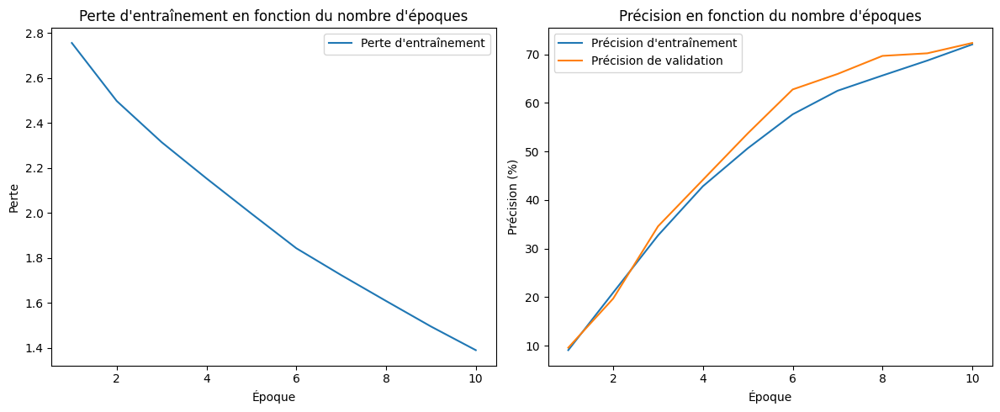

Entraînement avec les paramètres : {'batch_size': 32, 'gamma': 0.5, 'lr': 0.0001, 'num_epochs': 20, 'optimizer': 'adam', 'step_size': 5}
Époque [1/20], Perte : 1.5752, Précision Entraînement : 56.22%, Précision Validation : 81.38%
Époque [2/20], Perte : 0.4118, Précision Entraînement : 91.59%, Précision Validation : 86.70%
Époque [3/20], Perte : 0.1448, Précision Entraînement : 98.82%, Précision Validation : 85.64%
Époque [4/20], Perte : 0.0615, Précision Entraînement : 99.88%, Précision Validation : 88.30%
Époque [5/20], Perte : 0.0351, Précision Entraînement : 100.00%, Précision Validation : 87.77%
Époque [6/20], Perte : 0.0197, Précision Entraînement : 100.00%, Précision Validation : 88.30%
Époque [7/20], Perte : 0.0172, Précision Entraînement : 100.00%, Précision Validation : 88.30%
Époque [8/20], Perte : 0.0141, Précision Entraînement : 99.94%, Précision Validation : 88.83%
Époque [9/20], Perte : 0.0148, Précision Entraînement : 100.00%, Précision Validation : 88.83%
Époque [10/20

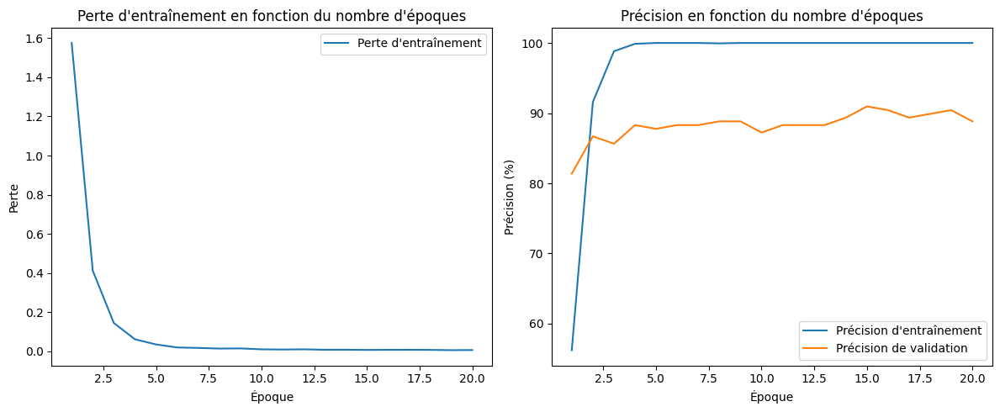

Entraînement avec les paramètres : {'batch_size': 32, 'gamma': 0.5, 'lr': 0.0001, 'num_epochs': 20, 'optimizer': 'adam', 'step_size': 10}
Époque [1/20], Perte : 1.5297, Précision Entraînement : 56.69%, Précision Validation : 82.98%
Époque [2/20], Perte : 0.4035, Précision Entraînement : 91.23%, Précision Validation : 86.17%
Époque [3/20], Perte : 0.1378, Précision Entraînement : 99.05%, Précision Validation : 86.70%
Époque [4/20], Perte : 0.0541, Précision Entraînement : 99.94%, Précision Validation : 88.83%
Époque [5/20], Perte : 0.0299, Précision Entraînement : 100.00%, Précision Validation : 88.30%
Époque [6/20], Perte : 0.0193, Précision Entraînement : 100.00%, Précision Validation : 89.89%
Époque [7/20], Perte : 0.0145, Précision Entraînement : 100.00%, Précision Validation : 88.30%
Époque [8/20], Perte : 0.0113, Précision Entraînement : 100.00%, Précision Validation : 87.77%
Époque [9/20], Perte : 0.0098, Précision Entraînement : 100.00%, Précision Validation : 89.89%
Époque [10/

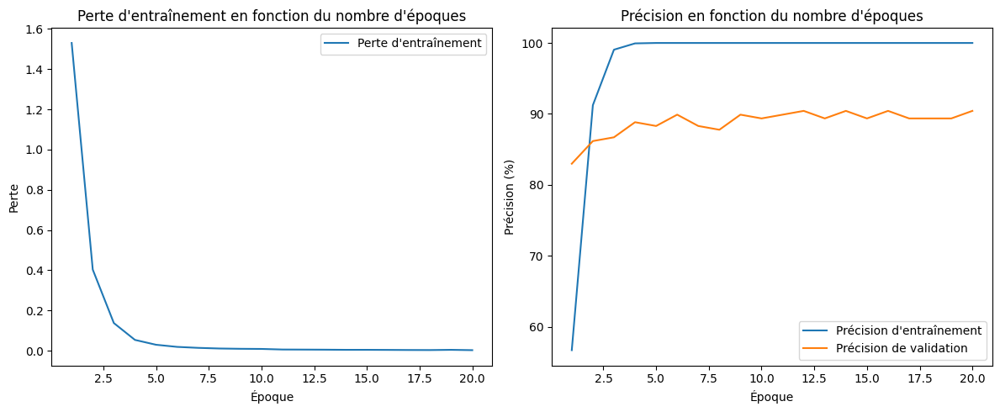

Entraînement avec les paramètres : {'batch_size': 32, 'gamma': 0.5, 'lr': 0.0001, 'num_epochs': 20, 'optimizer': 'sgd', 'step_size': 5}
Époque [1/20], Perte : 2.8073, Précision Entraînement : 6.64%, Précision Validation : 10.11%
Époque [2/20], Perte : 2.5453, Précision Entraînement : 18.72%, Précision Validation : 19.68%
Époque [3/20], Perte : 2.3558, Précision Entraînement : 30.15%, Précision Validation : 31.91%
Époque [4/20], Perte : 2.1891, Précision Entraînement : 40.76%, Précision Validation : 38.83%
Époque [5/20], Perte : 2.0299, Précision Entraînement : 49.11%, Précision Validation : 45.74%
Époque [6/20], Perte : 1.9138, Précision Entraînement : 53.38%, Précision Validation : 49.47%
Époque [7/20], Perte : 1.8458, Précision Entraînement : 57.76%, Précision Validation : 54.26%
Époque [8/20], Perte : 1.7768, Précision Entraînement : 60.49%, Précision Validation : 53.72%
Époque [9/20], Perte : 1.7179, Précision Entraînement : 62.44%, Précision Validation : 55.85%
Époque [10/20], Per

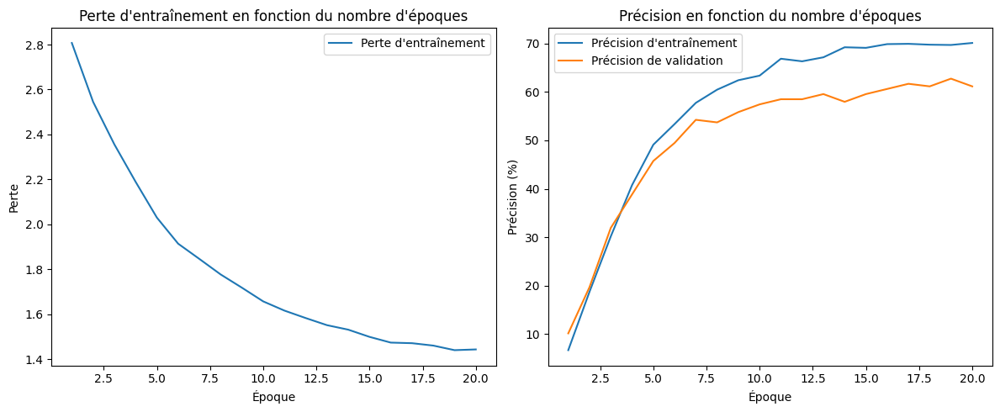

Entraînement avec les paramètres : {'batch_size': 32, 'gamma': 0.5, 'lr': 0.0001, 'num_epochs': 20, 'optimizer': 'sgd', 'step_size': 10}
Époque [1/20], Perte : 2.8451, Précision Entraînement : 7.17%, Précision Validation : 10.64%
Époque [2/20], Perte : 2.6063, Précision Entraînement : 15.11%, Précision Validation : 19.68%
Époque [3/20], Perte : 2.4128, Précision Entraînement : 26.24%, Précision Validation : 30.85%
Époque [4/20], Perte : 2.2385, Précision Entraînement : 37.56%, Précision Validation : 43.62%
Époque [5/20], Perte : 2.0760, Précision Entraînement : 47.33%, Précision Validation : 49.47%
Époque [6/20], Perte : 1.9359, Précision Entraînement : 54.15%, Précision Validation : 55.32%
Époque [7/20], Perte : 1.7815, Précision Entraînement : 60.49%, Précision Validation : 57.98%
Époque [8/20], Perte : 1.6663, Précision Entraînement : 63.74%, Précision Validation : 62.23%
Époque [9/20], Perte : 1.5469, Précision Entraînement : 66.88%, Précision Validation : 65.43%
Époque [10/20], Pe

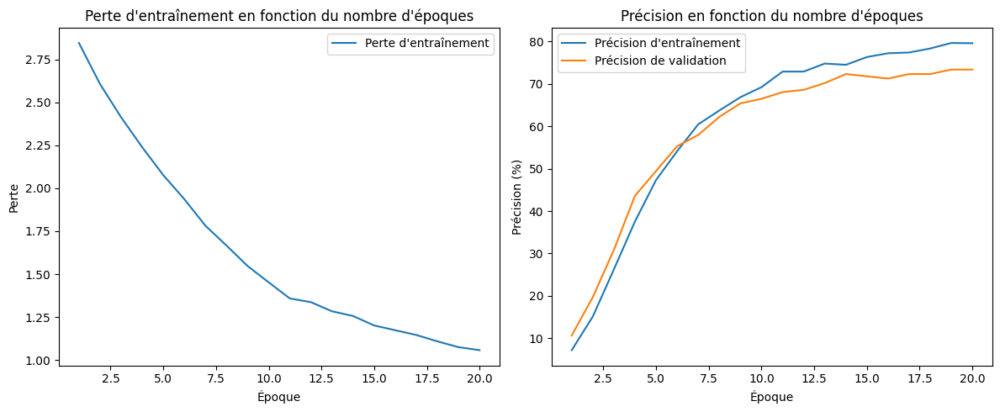

Entraînement avec les paramètres : {'batch_size': 64, 'gamma': 0.1, 'lr': 0.001, 'num_epochs': 10, 'optimizer': 'adam', 'step_size': 5}
Époque [1/10], Perte : 1.6069, Précision Entraînement : 52.13%, Précision Validation : 59.04%
Époque [2/10], Perte : 0.9313, Précision Entraînement : 69.85%, Précision Validation : 41.49%
Époque [3/10], Perte : 0.6677, Précision Entraînement : 79.50%, Précision Validation : 58.51%
Époque [4/10], Perte : 0.5007, Précision Entraînement : 83.23%, Précision Validation : 61.70%
Époque [5/10], Perte : 0.3748, Précision Entraînement : 88.63%, Précision Validation : 65.43%
Époque [6/10], Perte : 0.1536, Précision Entraînement : 95.85%, Précision Validation : 81.91%
Époque [7/10], Perte : 0.0619, Précision Entraînement : 99.05%, Précision Validation : 80.85%
Époque [8/10], Perte : 0.0467, Précision Entraînement : 99.05%, Précision Validation : 82.45%
Époque [9/10], Perte : 0.0327, Précision Entraînement : 99.82%, Précision Validation : 83.51%
Époque [10/10], Pe

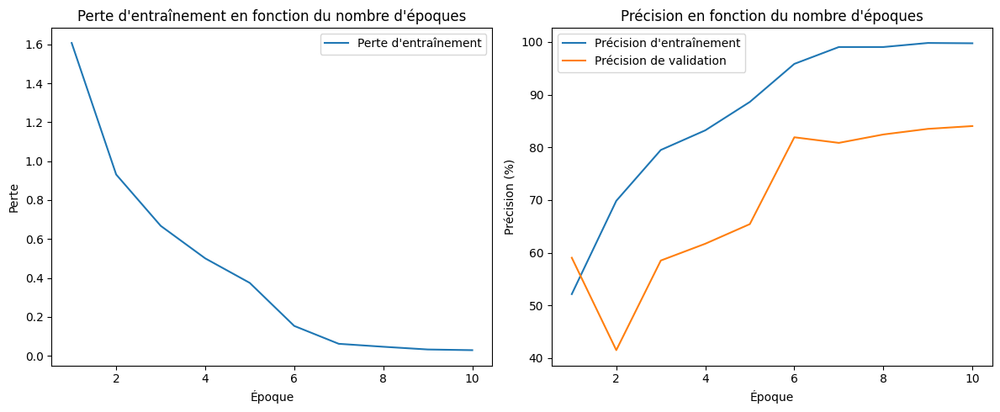

Entraînement avec les paramètres : {'batch_size': 64, 'gamma': 0.1, 'lr': 0.001, 'num_epochs': 10, 'optimizer': 'adam', 'step_size': 10}
Époque [1/10], Perte : 1.7292, Précision Entraînement : 48.46%, Précision Validation : 25.53%
Époque [2/10], Perte : 0.9415, Précision Entraînement : 70.79%, Précision Validation : 48.40%
Époque [3/10], Perte : 0.6880, Précision Entraînement : 78.32%, Précision Validation : 66.49%
Époque [4/10], Perte : 0.4267, Précision Entraînement : 85.78%, Précision Validation : 62.77%
Époque [5/10], Perte : 0.3382, Précision Entraînement : 88.68%, Précision Validation : 59.57%
Époque [6/10], Perte : 0.2661, Précision Entraînement : 92.18%, Précision Validation : 58.51%
Époque [7/10], Perte : 0.3559, Précision Entraînement : 87.80%, Précision Validation : 51.60%
Époque [8/10], Perte : 0.2197, Précision Entraînement : 93.84%, Précision Validation : 61.17%
Époque [9/10], Perte : 0.1383, Précision Entraînement : 95.68%, Précision Validation : 63.83%
Époque [10/10], P

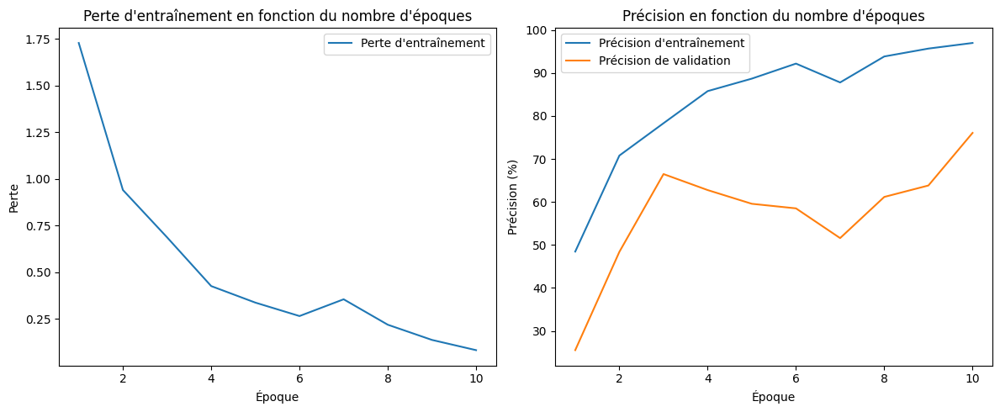

Entraînement avec les paramètres : {'batch_size': 64, 'gamma': 0.1, 'lr': 0.001, 'num_epochs': 10, 'optimizer': 'sgd', 'step_size': 5}
Époque [1/10], Perte : 2.2198, Précision Entraînement : 34.30%, Précision Validation : 64.36%
Époque [2/10], Perte : 1.1823, Précision Entraînement : 73.28%, Précision Validation : 77.66%
Époque [3/10], Perte : 0.7215, Précision Entraînement : 83.06%, Précision Validation : 78.72%
Époque [4/10], Perte : 0.4848, Précision Entraînement : 90.46%, Précision Validation : 81.91%
Époque [5/10], Perte : 0.3381, Précision Entraînement : 94.25%, Précision Validation : 83.51%
Époque [6/10], Perte : 0.2459, Précision Entraînement : 96.50%, Précision Validation : 82.98%
Époque [7/10], Perte : 0.2370, Précision Entraînement : 97.10%, Précision Validation : 84.04%
Époque [8/10], Perte : 0.2257, Précision Entraînement : 97.45%, Précision Validation : 81.91%
Époque [9/10], Perte : 0.2183, Précision Entraînement : 97.69%, Précision Validation : 83.51%
Époque [10/10], Per

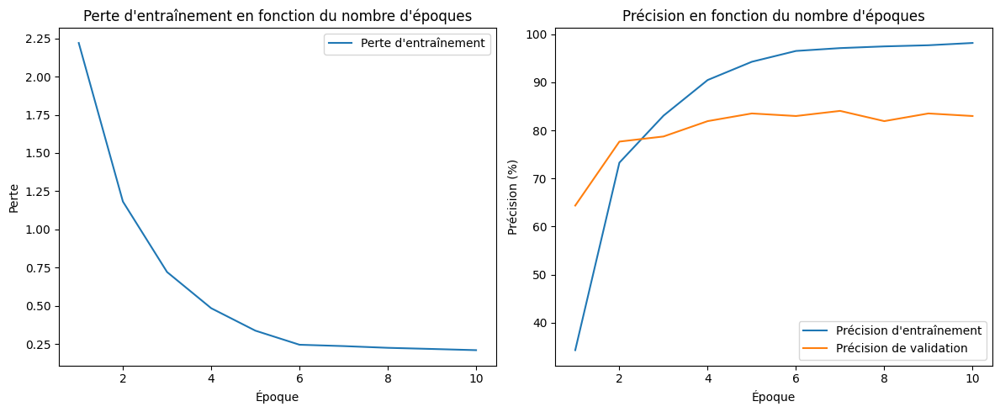

Entraînement avec les paramètres : {'batch_size': 64, 'gamma': 0.1, 'lr': 0.001, 'num_epochs': 10, 'optimizer': 'sgd', 'step_size': 10}
Époque [1/10], Perte : 2.3018, Précision Entraînement : 30.45%, Précision Validation : 63.83%
Époque [2/10], Perte : 1.2053, Précision Entraînement : 73.10%, Précision Validation : 79.79%
Époque [3/10], Perte : 0.7249, Précision Entraînement : 83.77%, Précision Validation : 81.91%
Époque [4/10], Perte : 0.4913, Précision Entraînement : 89.87%, Précision Validation : 82.98%
Époque [5/10], Perte : 0.3520, Précision Entraînement : 93.54%, Précision Validation : 84.04%
Époque [6/10], Perte : 0.2346, Précision Entraînement : 97.04%, Précision Validation : 85.11%
Époque [7/10], Perte : 0.1708, Précision Entraînement : 98.22%, Précision Validation : 86.17%
Époque [8/10], Perte : 0.1261, Précision Entraînement : 99.05%, Précision Validation : 85.64%
Époque [9/10], Perte : 0.0977, Précision Entraînement : 99.53%, Précision Validation : 87.23%
Époque [10/10], Pe

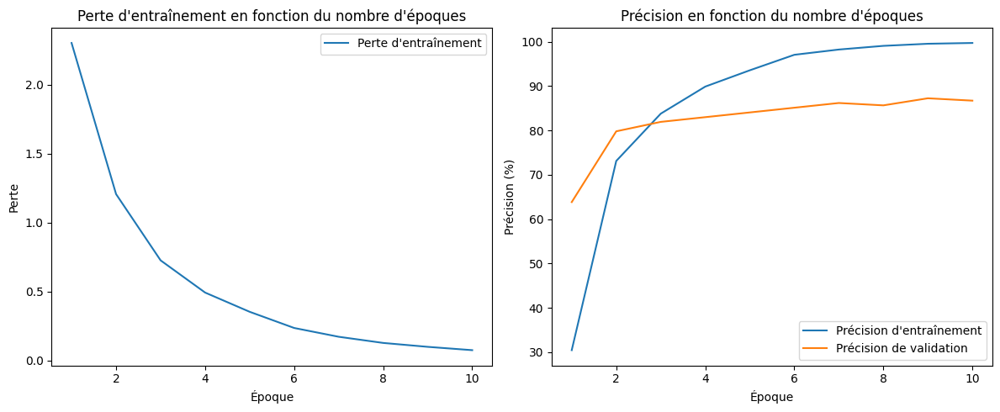

Entraînement avec les paramètres : {'batch_size': 64, 'gamma': 0.1, 'lr': 0.001, 'num_epochs': 20, 'optimizer': 'adam', 'step_size': 5}
Époque [1/20], Perte : 1.8270, Précision Entraînement : 45.62%, Précision Validation : 47.87%
Époque [2/20], Perte : 1.0238, Précision Entraînement : 68.48%, Précision Validation : 54.26%
Époque [3/20], Perte : 0.7370, Précision Entraînement : 77.07%, Précision Validation : 52.13%
Époque [4/20], Perte : 0.4830, Précision Entraînement : 84.72%, Précision Validation : 57.45%
Époque [5/20], Perte : 0.3421, Précision Entraînement : 89.16%, Précision Validation : 71.81%
Époque [6/20], Perte : 0.1343, Précision Entraînement : 96.74%, Précision Validation : 83.51%
Époque [7/20], Perte : 0.0516, Précision Entraînement : 99.35%, Précision Validation : 84.04%
Époque [8/20], Perte : 0.0382, Précision Entraînement : 99.82%, Précision Validation : 85.64%
Époque [9/20], Perte : 0.0260, Précision Entraînement : 99.82%, Précision Validation : 84.57%
Époque [10/20], Pe

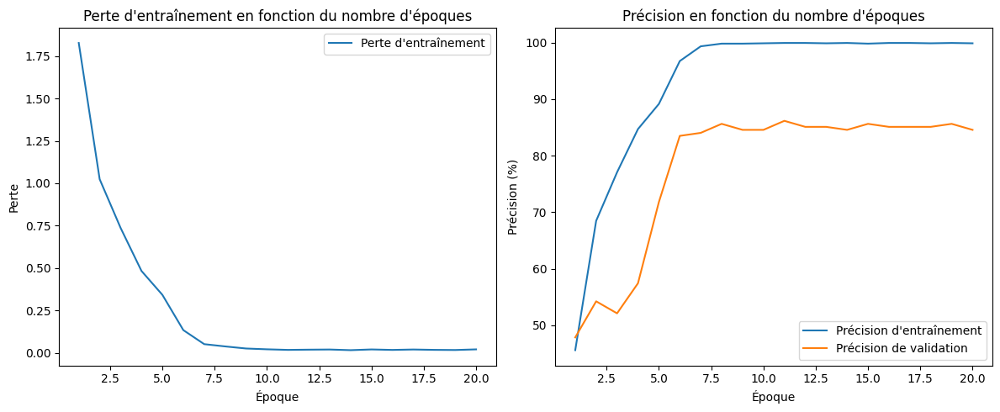

Entraînement avec les paramètres : {'batch_size': 64, 'gamma': 0.1, 'lr': 0.001, 'num_epochs': 20, 'optimizer': 'adam', 'step_size': 10}
Époque [1/20], Perte : 1.7533, Précision Entraînement : 47.99%, Précision Validation : 48.94%
Époque [2/20], Perte : 1.0851, Précision Entraînement : 66.29%, Précision Validation : 67.02%
Époque [3/20], Perte : 0.6886, Précision Entraînement : 77.96%, Précision Validation : 49.47%
Époque [4/20], Perte : 0.4775, Précision Entraînement : 84.36%, Précision Validation : 63.83%
Époque [5/20], Perte : 0.3492, Précision Entraînement : 89.87%, Précision Validation : 61.17%
Époque [6/20], Perte : 0.3329, Précision Entraînement : 89.63%, Précision Validation : 63.30%
Époque [7/20], Perte : 0.2286, Précision Entraînement : 92.65%, Précision Validation : 63.83%
Époque [8/20], Perte : 0.1728, Précision Entraînement : 94.96%, Précision Validation : 68.62%
Époque [9/20], Perte : 0.1214, Précision Entraînement : 96.27%, Précision Validation : 70.74%
Époque [10/20], P

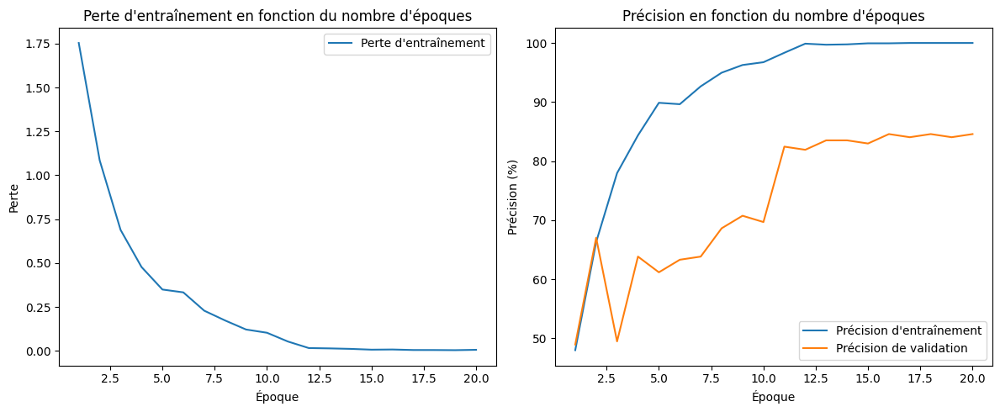

Entraînement avec les paramètres : {'batch_size': 64, 'gamma': 0.1, 'lr': 0.001, 'num_epochs': 20, 'optimizer': 'sgd', 'step_size': 5}
Époque [1/20], Perte : 2.3393, Précision Entraînement : 29.38%, Précision Validation : 61.70%
Époque [2/20], Perte : 1.2559, Précision Entraînement : 71.39%, Précision Validation : 73.40%
Époque [3/20], Perte : 0.7712, Précision Entraînement : 82.05%, Précision Validation : 78.19%
Époque [4/20], Perte : 0.5211, Précision Entraînement : 89.34%, Précision Validation : 79.26%
Époque [5/20], Perte : 0.3601, Précision Entraînement : 93.54%, Précision Validation : 83.51%
Époque [6/20], Perte : 0.2735, Précision Entraînement : 96.92%, Précision Validation : 81.38%
Époque [7/20], Perte : 0.2557, Précision Entraînement : 97.10%, Précision Validation : 82.98%
Époque [8/20], Perte : 0.2430, Précision Entraînement : 97.45%, Précision Validation : 81.91%
Époque [9/20], Perte : 0.2414, Précision Entraînement : 97.51%, Précision Validation : 82.98%
Époque [10/20], Per

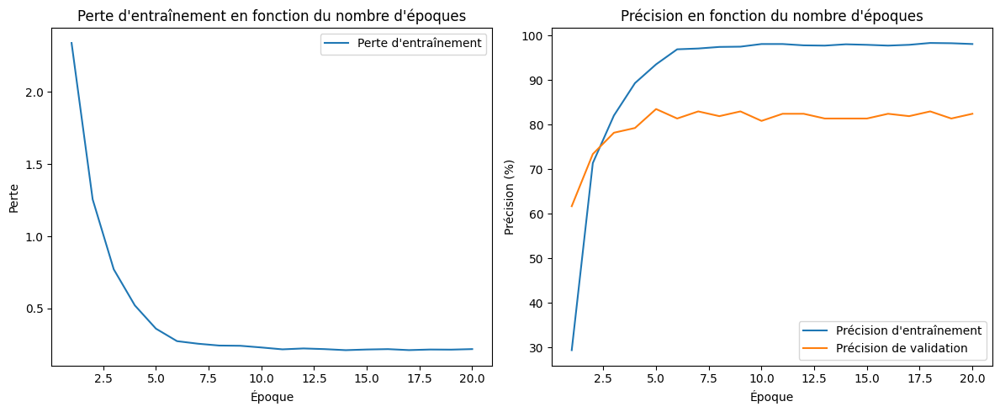

Entraînement avec les paramètres : {'batch_size': 64, 'gamma': 0.1, 'lr': 0.001, 'num_epochs': 20, 'optimizer': 'sgd', 'step_size': 10}
Époque [1/20], Perte : 2.2417, Précision Entraînement : 33.65%, Précision Validation : 65.43%
Époque [2/20], Perte : 1.1828, Précision Entraînement : 73.99%, Précision Validation : 75.00%
Époque [3/20], Perte : 0.7486, Précision Entraînement : 83.06%, Précision Validation : 79.26%
Époque [4/20], Perte : 0.4848, Précision Entraînement : 90.76%, Précision Validation : 81.91%
Époque [5/20], Perte : 0.3330, Précision Entraînement : 94.61%, Précision Validation : 83.51%
Époque [6/20], Perte : 0.2393, Précision Entraînement : 96.74%, Précision Validation : 85.64%
Époque [7/20], Perte : 0.1728, Précision Entraînement : 98.22%, Précision Validation : 85.11%
Époque [8/20], Perte : 0.1331, Précision Entraînement : 98.76%, Précision Validation : 84.57%
Époque [9/20], Perte : 0.1007, Précision Entraînement : 99.41%, Précision Validation : 84.57%
Époque [10/20], Pe

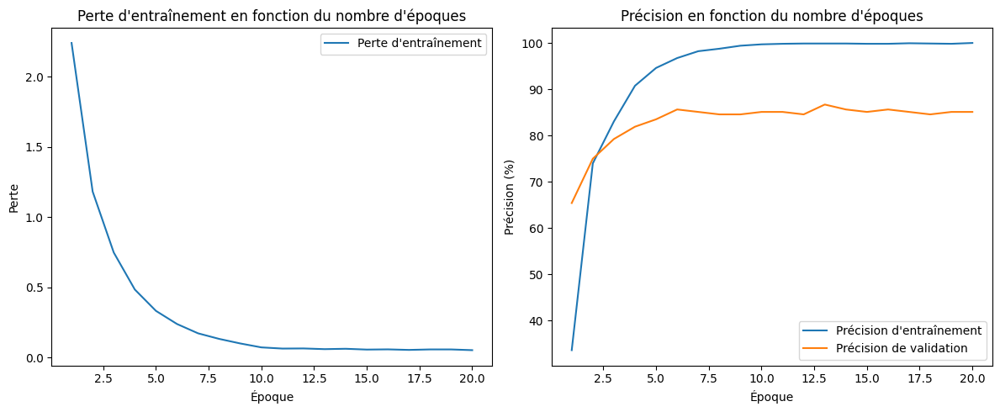

Entraînement avec les paramètres : {'batch_size': 64, 'gamma': 0.1, 'lr': 0.0001, 'num_epochs': 10, 'optimizer': 'adam', 'step_size': 5}
Époque [1/10], Perte : 1.5630, Précision Entraînement : 56.40%, Précision Validation : 81.91%
Époque [2/10], Perte : 0.4120, Précision Entraînement : 92.12%, Précision Validation : 83.51%
Époque [3/10], Perte : 0.1391, Précision Entraînement : 98.82%, Précision Validation : 87.23%
Époque [4/10], Perte : 0.0605, Précision Entraînement : 99.76%, Précision Validation : 88.83%
Époque [5/10], Perte : 0.0299, Précision Entraînement : 100.00%, Précision Validation : 87.23%
Époque [6/10], Perte : 0.0227, Précision Entraînement : 99.94%, Précision Validation : 88.30%
Époque [7/10], Perte : 0.0204, Précision Entraînement : 100.00%, Précision Validation : 87.77%
Époque [8/10], Perte : 0.0207, Précision Entraînement : 100.00%, Précision Validation : 88.30%
Époque [9/10], Perte : 0.0182, Précision Entraînement : 100.00%, Précision Validation : 88.83%
Époque [10/10

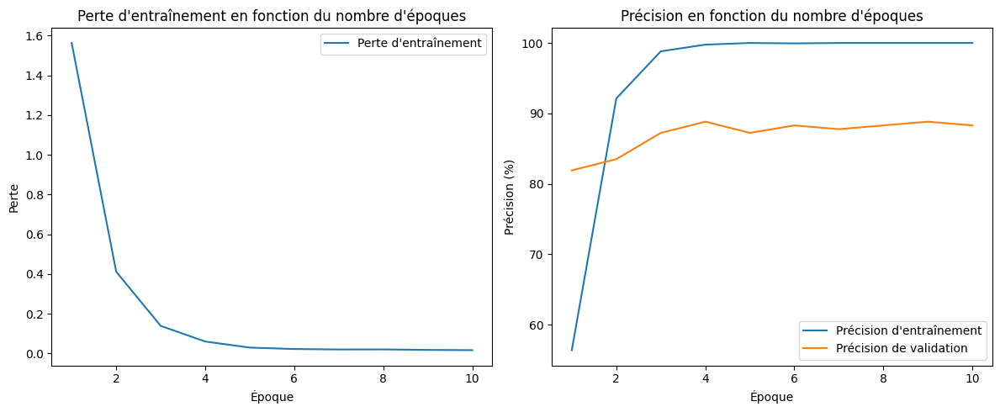

Entraînement avec les paramètres : {'batch_size': 64, 'gamma': 0.1, 'lr': 0.0001, 'num_epochs': 10, 'optimizer': 'adam', 'step_size': 10}
Époque [1/10], Perte : 1.6215, Précision Entraînement : 54.86%, Précision Validation : 81.91%
Époque [2/10], Perte : 0.4298, Précision Entraînement : 91.29%, Précision Validation : 85.11%
Époque [3/10], Perte : 0.1464, Précision Entraînement : 98.70%, Précision Validation : 83.51%
Époque [4/10], Perte : 0.0631, Précision Entraînement : 99.70%, Précision Validation : 86.70%
Époque [5/10], Perte : 0.0347, Précision Entraînement : 100.00%, Précision Validation : 86.17%
Époque [6/10], Perte : 0.0214, Précision Entraînement : 100.00%, Précision Validation : 86.17%
Époque [7/10], Perte : 0.0167, Précision Entraînement : 100.00%, Précision Validation : 87.23%
Époque [8/10], Perte : 0.0120, Précision Entraînement : 100.00%, Précision Validation : 86.70%
Époque [9/10], Perte : 0.0118, Précision Entraînement : 99.94%, Précision Validation : 87.77%
Époque [10/1

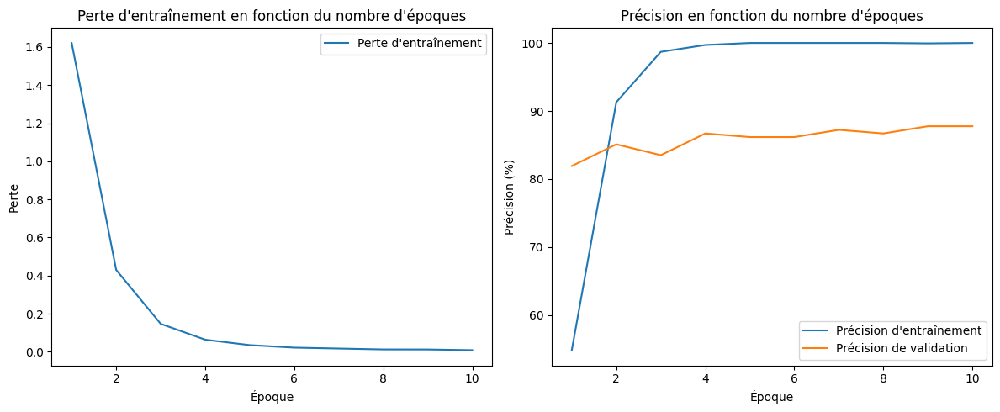

Entraînement avec les paramètres : {'batch_size': 64, 'gamma': 0.1, 'lr': 0.0001, 'num_epochs': 10, 'optimizer': 'sgd', 'step_size': 5}
Époque [1/10], Perte : 2.7537, Précision Entraînement : 11.32%, Précision Validation : 19.68%
Époque [2/10], Perte : 2.5060, Précision Entraînement : 22.16%, Précision Validation : 27.13%
Époque [3/10], Perte : 2.3217, Précision Entraînement : 33.59%, Précision Validation : 36.70%
Époque [4/10], Perte : 2.1581, Précision Entraînement : 42.12%, Précision Validation : 44.68%
Époque [5/10], Perte : 2.0055, Précision Entraînement : 50.65%, Précision Validation : 50.00%
Époque [6/10], Perte : 1.9089, Précision Entraînement : 56.10%, Précision Validation : 51.60%
Époque [7/10], Perte : 1.9034, Précision Entraînement : 55.33%, Précision Validation : 50.53%
Époque [8/10], Perte : 1.8848, Précision Entraînement : 56.99%, Précision Validation : 54.26%
Époque [9/10], Perte : 1.8731, Précision Entraînement : 56.75%, Précision Validation : 54.26%
Époque [10/10], Pe

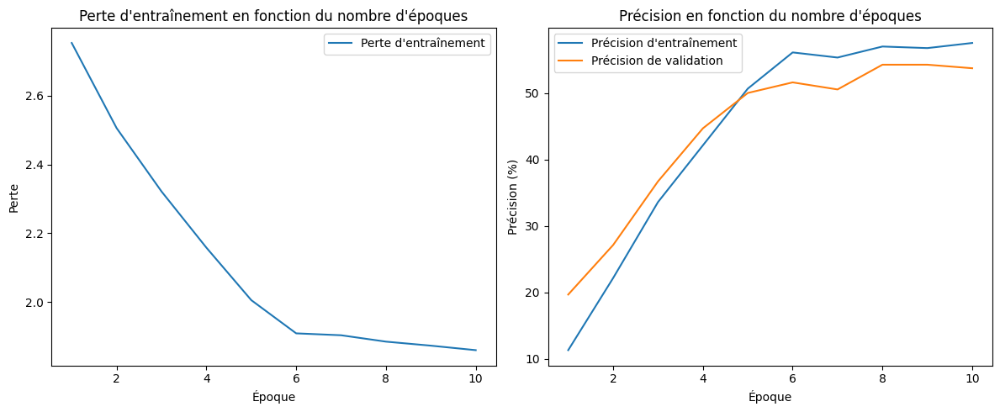

Entraînement avec les paramètres : {'batch_size': 64, 'gamma': 0.1, 'lr': 0.0001, 'num_epochs': 10, 'optimizer': 'sgd', 'step_size': 10}
Époque [1/10], Perte : 2.7348, Précision Entraînement : 10.31%, Précision Validation : 14.36%
Époque [2/10], Perte : 2.5016, Précision Entraînement : 20.32%, Précision Validation : 28.19%
Époque [3/10], Perte : 2.3237, Précision Entraînement : 30.33%, Précision Validation : 37.23%
Époque [4/10], Perte : 2.1537, Précision Entraînement : 40.82%, Précision Validation : 44.15%
Époque [5/10], Perte : 2.0088, Précision Entraînement : 50.53%, Précision Validation : 53.72%
Époque [6/10], Perte : 1.8524, Précision Entraînement : 57.58%, Précision Validation : 57.45%
Époque [7/10], Perte : 1.7290, Précision Entraînement : 62.14%, Précision Validation : 60.11%
Époque [8/10], Perte : 1.6044, Précision Entraînement : 66.88%, Précision Validation : 63.30%
Époque [9/10], Perte : 1.4951, Précision Entraînement : 69.61%, Précision Validation : 67.55%
Époque [10/10], P

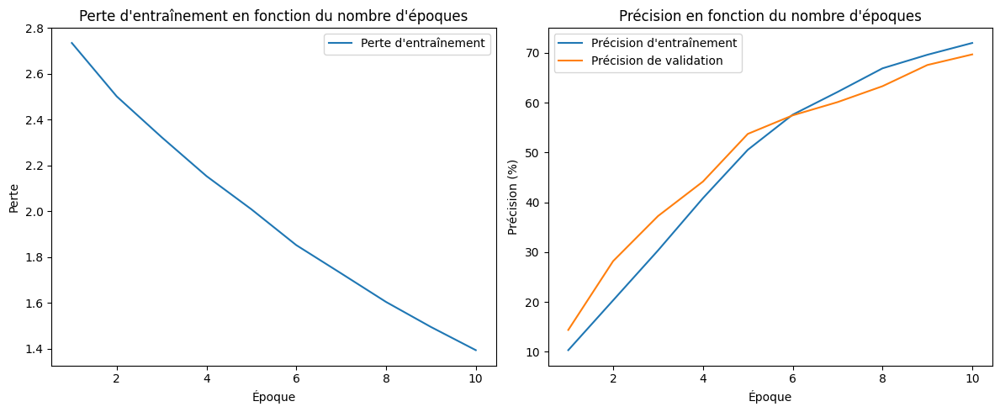

Entraînement avec les paramètres : {'batch_size': 64, 'gamma': 0.1, 'lr': 0.0001, 'num_epochs': 20, 'optimizer': 'adam', 'step_size': 5}
Époque [1/20], Perte : 1.5474, Précision Entraînement : 56.34%, Précision Validation : 83.51%
Époque [2/20], Perte : 0.4142, Précision Entraînement : 91.94%, Précision Validation : 83.51%
Époque [3/20], Perte : 0.1432, Précision Entraînement : 98.99%, Précision Validation : 85.64%
Époque [4/20], Perte : 0.0785, Précision Entraînement : 99.17%, Précision Validation : 86.17%
Époque [5/20], Perte : 0.0387, Précision Entraînement : 99.88%, Précision Validation : 85.64%
Époque [6/20], Perte : 0.0215, Précision Entraînement : 100.00%, Précision Validation : 86.17%
Époque [7/20], Perte : 0.0222, Précision Entraînement : 100.00%, Précision Validation : 86.17%
Époque [8/20], Perte : 0.0217, Précision Entraînement : 100.00%, Précision Validation : 85.64%
Époque [9/20], Perte : 0.0200, Précision Entraînement : 99.94%, Précision Validation : 86.70%
Époque [10/20]

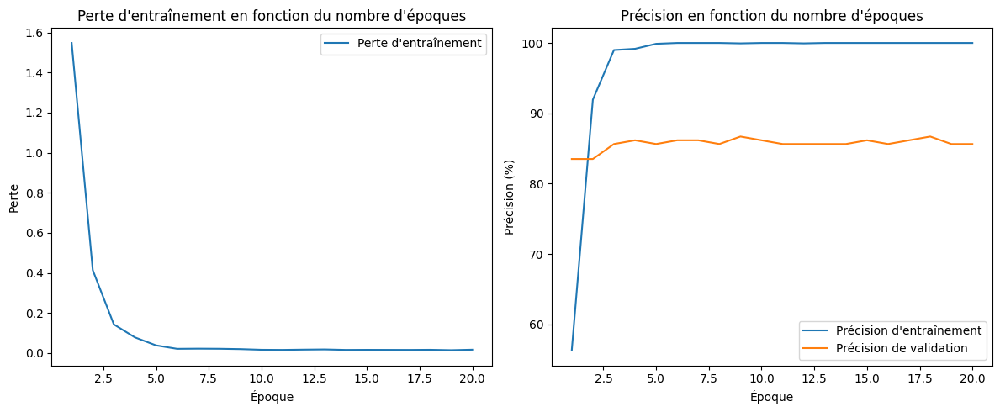

Entraînement avec les paramètres : {'batch_size': 64, 'gamma': 0.1, 'lr': 0.0001, 'num_epochs': 20, 'optimizer': 'adam', 'step_size': 10}
Époque [1/20], Perte : 1.5537, Précision Entraînement : 56.34%, Précision Validation : 81.91%
Époque [2/20], Perte : 0.4097, Précision Entraînement : 91.88%, Précision Validation : 86.70%
Époque [3/20], Perte : 0.1473, Précision Entraînement : 98.34%, Précision Validation : 86.70%
Époque [4/20], Perte : 0.0605, Précision Entraînement : 99.82%, Précision Validation : 86.70%
Époque [5/20], Perte : 0.0340, Précision Entraînement : 99.88%, Précision Validation : 86.70%
Époque [6/20], Perte : 0.0205, Précision Entraînement : 100.00%, Précision Validation : 88.30%
Époque [7/20], Perte : 0.0155, Précision Entraînement : 100.00%, Précision Validation : 88.83%
Époque [8/20], Perte : 0.0106, Précision Entraînement : 100.00%, Précision Validation : 88.30%
Époque [9/20], Perte : 0.0083, Précision Entraînement : 100.00%, Précision Validation : 90.96%
Époque [10/2

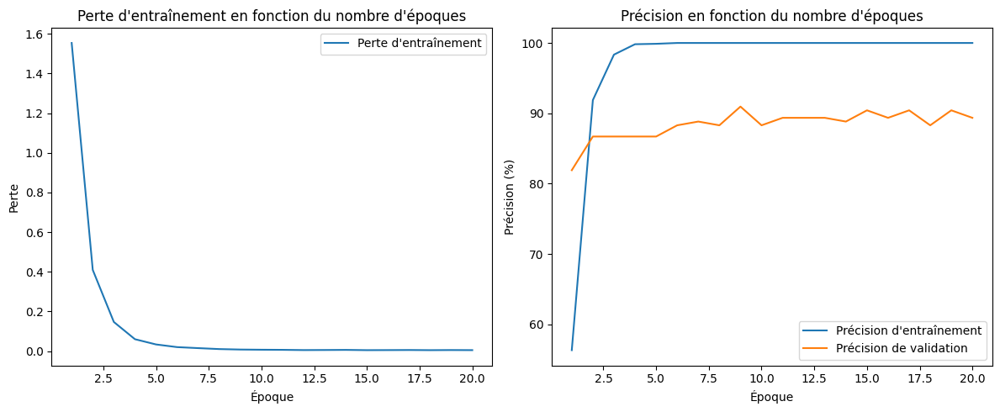

Entraînement avec les paramètres : {'batch_size': 64, 'gamma': 0.1, 'lr': 0.0001, 'num_epochs': 20, 'optimizer': 'sgd', 'step_size': 5}
Époque [1/20], Perte : 2.7052, Précision Entraînement : 10.66%, Précision Validation : 17.55%
Époque [2/20], Perte : 2.4832, Précision Entraînement : 20.02%, Précision Validation : 26.06%
Époque [3/20], Perte : 2.2982, Précision Entraînement : 33.35%, Précision Validation : 37.77%
Époque [4/20], Perte : 2.1359, Précision Entraînement : 43.13%, Précision Validation : 48.40%
Époque [5/20], Perte : 1.9861, Précision Entraînement : 50.89%, Précision Validation : 52.13%
Époque [6/20], Perte : 1.9051, Précision Entraînement : 55.21%, Précision Validation : 52.66%
Époque [7/20], Perte : 1.8900, Précision Entraînement : 56.81%, Précision Validation : 53.72%
Époque [8/20], Perte : 1.8716, Précision Entraînement : 56.99%, Précision Validation : 53.19%
Époque [9/20], Perte : 1.8564, Précision Entraînement : 57.17%, Précision Validation : 54.26%
Époque [10/20], Pe

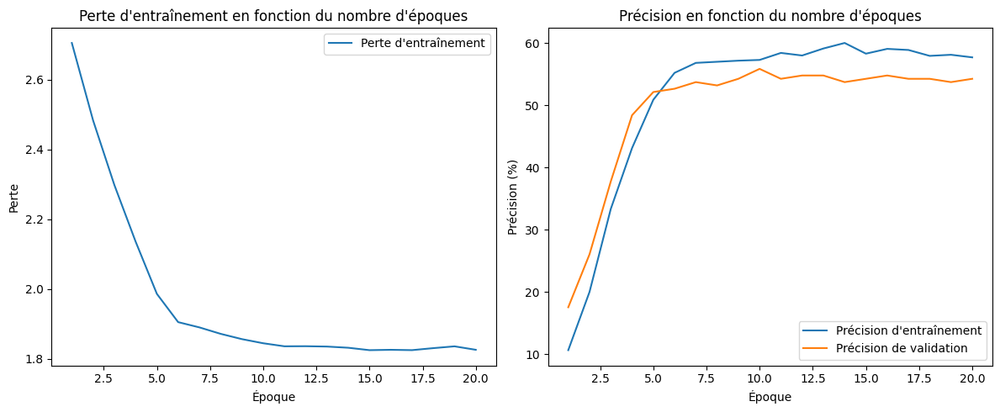

Entraînement avec les paramètres : {'batch_size': 64, 'gamma': 0.1, 'lr': 0.0001, 'num_epochs': 20, 'optimizer': 'sgd', 'step_size': 10}
Époque [1/20], Perte : 2.7292, Précision Entraînement : 10.37%, Précision Validation : 16.49%
Époque [2/20], Perte : 2.4847, Précision Entraînement : 21.45%, Précision Validation : 27.13%
Époque [3/20], Perte : 2.3092, Précision Entraînement : 32.29%, Précision Validation : 36.17%
Époque [4/20], Perte : 2.1545, Précision Entraînement : 40.70%, Précision Validation : 47.34%
Époque [5/20], Perte : 1.9994, Précision Entraînement : 50.36%, Précision Validation : 51.06%
Époque [6/20], Perte : 1.8540, Précision Entraînement : 56.46%, Précision Validation : 57.98%
Époque [7/20], Perte : 1.7271, Précision Entraînement : 61.91%, Précision Validation : 65.43%
Époque [8/20], Perte : 1.6074, Précision Entraînement : 65.88%, Précision Validation : 65.96%
Époque [9/20], Perte : 1.5015, Précision Entraînement : 68.84%, Précision Validation : 68.62%
Époque [10/20], P

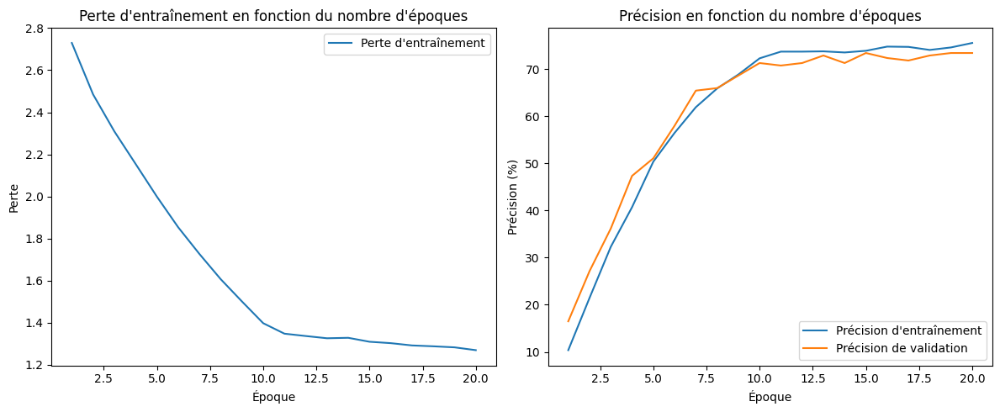

Entraînement avec les paramètres : {'batch_size': 64, 'gamma': 0.5, 'lr': 0.001, 'num_epochs': 10, 'optimizer': 'adam', 'step_size': 5}
Époque [1/10], Perte : 1.6927, Précision Entraînement : 51.54%, Précision Validation : 53.19%
Époque [2/10], Perte : 1.0454, Précision Entraînement : 67.06%, Précision Validation : 52.13%
Époque [3/10], Perte : 0.7481, Précision Entraînement : 77.01%, Précision Validation : 53.72%
Époque [4/10], Perte : 0.4894, Précision Entraînement : 84.24%, Précision Validation : 50.00%
Époque [5/10], Perte : 0.3428, Précision Entraînement : 88.92%, Précision Validation : 60.11%
Époque [6/10], Perte : 0.1564, Précision Entraînement : 95.44%, Précision Validation : 77.13%
Époque [7/10], Perte : 0.0443, Précision Entraînement : 99.35%, Précision Validation : 85.64%
Époque [8/10], Perte : 0.0239, Précision Entraînement : 99.64%, Précision Validation : 81.91%
Époque [9/10], Perte : 0.0214, Précision Entraînement : 99.59%, Précision Validation : 85.11%
Époque [10/10], Pe

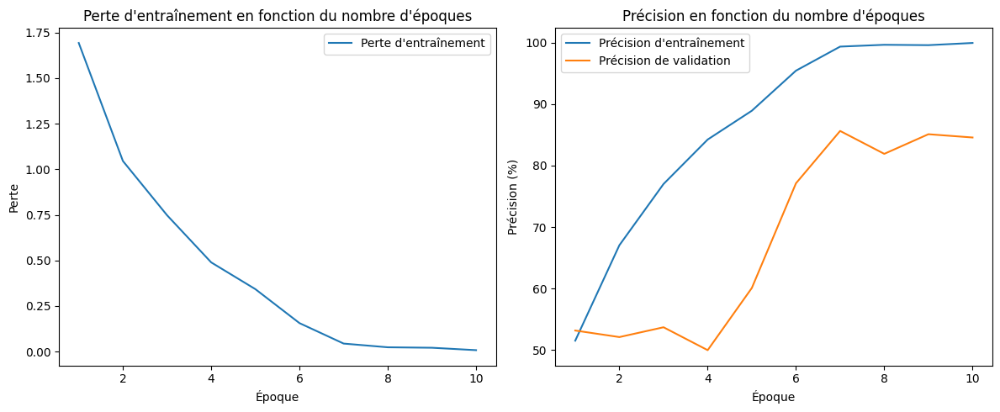

Entraînement avec les paramètres : {'batch_size': 64, 'gamma': 0.5, 'lr': 0.001, 'num_epochs': 10, 'optimizer': 'adam', 'step_size': 10}
Époque [1/10], Perte : 1.7318, Précision Entraînement : 48.05%, Précision Validation : 39.89%
Époque [2/10], Perte : 1.0427, Précision Entraînement : 68.66%, Précision Validation : 54.26%
Époque [3/10], Perte : 0.7096, Précision Entraînement : 78.44%, Précision Validation : 63.83%
Époque [4/10], Perte : 0.5688, Précision Entraînement : 83.71%, Précision Validation : 58.51%
Époque [5/10], Perte : 0.3638, Précision Entraînement : 88.80%, Précision Validation : 56.38%
Époque [6/10], Perte : 0.3038, Précision Entraînement : 89.93%, Précision Validation : 61.70%
Époque [7/10], Perte : 0.2509, Précision Entraînement : 91.94%, Précision Validation : 67.55%
Époque [8/10], Perte : 0.1531, Précision Entraînement : 95.08%, Précision Validation : 64.89%
Époque [9/10], Perte : 0.1110, Précision Entraînement : 96.50%, Précision Validation : 78.19%
Époque [10/10], P

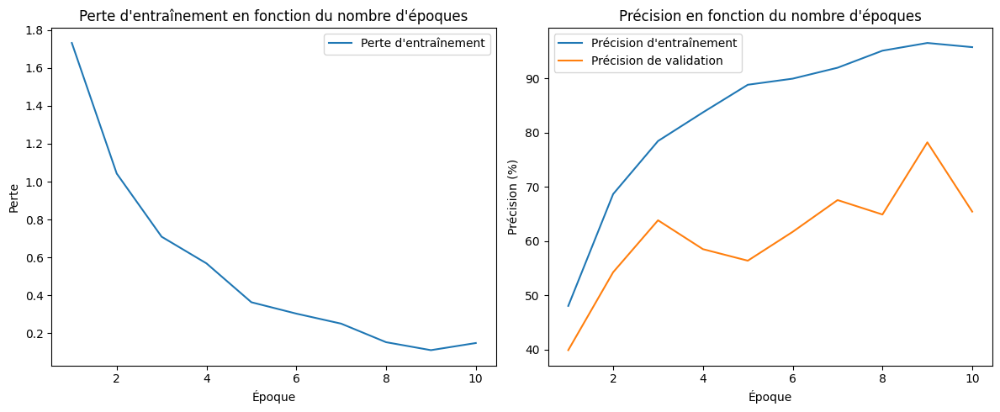

Entraînement avec les paramètres : {'batch_size': 64, 'gamma': 0.5, 'lr': 0.001, 'num_epochs': 10, 'optimizer': 'sgd', 'step_size': 5}
Époque [1/10], Perte : 2.2755, Précision Entraînement : 32.35%, Précision Validation : 58.51%
Époque [2/10], Perte : 1.2372, Précision Entraînement : 71.03%, Précision Validation : 75.00%
Époque [3/10], Perte : 0.7514, Précision Entraînement : 83.53%, Précision Validation : 80.85%
Époque [4/10], Perte : 0.5103, Précision Entraînement : 89.51%, Précision Validation : 81.91%
Époque [5/10], Perte : 0.3437, Précision Entraînement : 94.19%, Précision Validation : 82.45%
Époque [6/10], Perte : 0.2561, Précision Entraînement : 96.56%, Précision Validation : 84.04%
Époque [7/10], Perte : 0.2203, Précision Entraînement : 97.39%, Précision Validation : 85.64%
Époque [8/10], Perte : 0.1792, Précision Entraînement : 98.40%, Précision Validation : 85.11%
Époque [9/10], Perte : 0.1508, Précision Entraînement : 99.05%, Précision Validation : 86.17%
Époque [10/10], Per

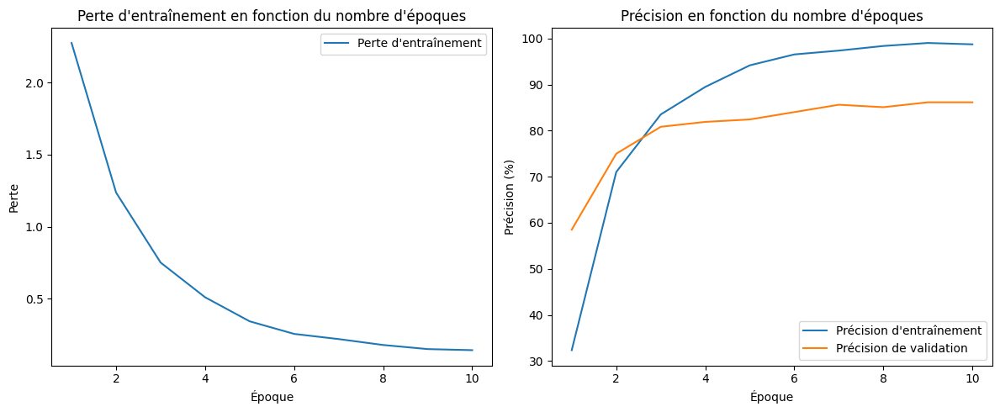

Entraînement avec les paramètres : {'batch_size': 64, 'gamma': 0.5, 'lr': 0.001, 'num_epochs': 10, 'optimizer': 'sgd', 'step_size': 10}
Époque [1/10], Perte : 2.3061, Précision Entraînement : 30.63%, Précision Validation : 63.83%
Époque [2/10], Perte : 1.2261, Précision Entraînement : 71.74%, Précision Validation : 75.00%
Époque [3/10], Perte : 0.7685, Précision Entraînement : 82.05%, Précision Validation : 83.51%
Époque [4/10], Perte : 0.5044, Précision Entraînement : 89.34%, Précision Validation : 85.11%
Époque [5/10], Perte : 0.3540, Précision Entraînement : 93.48%, Précision Validation : 85.64%
Époque [6/10], Perte : 0.2511, Précision Entraînement : 96.39%, Précision Validation : 86.17%
Époque [7/10], Perte : 0.1769, Précision Entraînement : 98.34%, Précision Validation : 85.64%
Époque [8/10], Perte : 0.1271, Précision Entraînement : 99.35%, Précision Validation : 85.64%
Époque [9/10], Perte : 0.1023, Précision Entraînement : 99.47%, Précision Validation : 86.70%
Époque [10/10], Pe

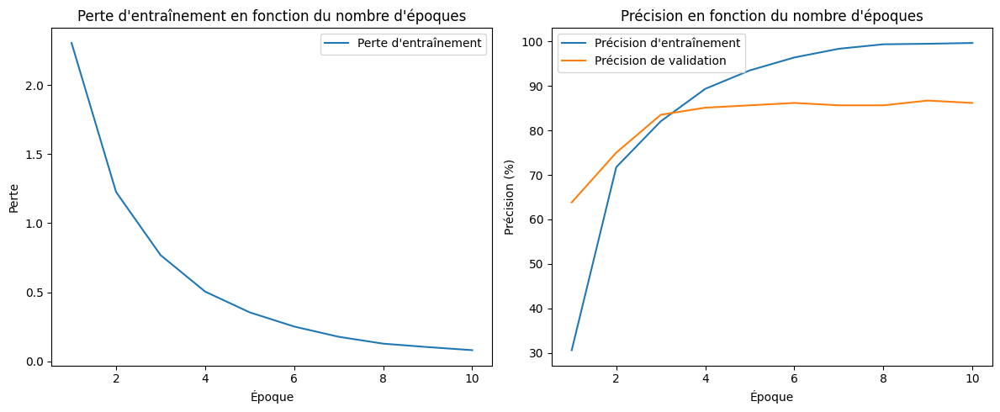

Entraînement avec les paramètres : {'batch_size': 64, 'gamma': 0.5, 'lr': 0.001, 'num_epochs': 20, 'optimizer': 'adam', 'step_size': 5}
Époque [1/20], Perte : 1.6805, Précision Entraînement : 49.23%, Précision Validation : 30.32%
Époque [2/20], Perte : 1.0213, Précision Entraînement : 68.13%, Précision Validation : 59.57%
Époque [3/20], Perte : 0.7274, Précision Entraînement : 78.08%, Précision Validation : 67.02%
Époque [4/20], Perte : 0.4777, Précision Entraînement : 85.37%, Précision Validation : 57.98%
Époque [5/20], Perte : 0.3685, Précision Entraînement : 89.22%, Précision Validation : 51.06%
Époque [6/20], Perte : 0.1800, Précision Entraînement : 94.79%, Précision Validation : 78.72%
Époque [7/20], Perte : 0.0489, Précision Entraînement : 99.17%, Précision Validation : 80.85%
Époque [8/20], Perte : 0.0280, Précision Entraînement : 99.35%, Précision Validation : 85.11%
Époque [9/20], Perte : 0.0151, Précision Entraînement : 99.88%, Précision Validation : 84.04%
Époque [10/20], Pe

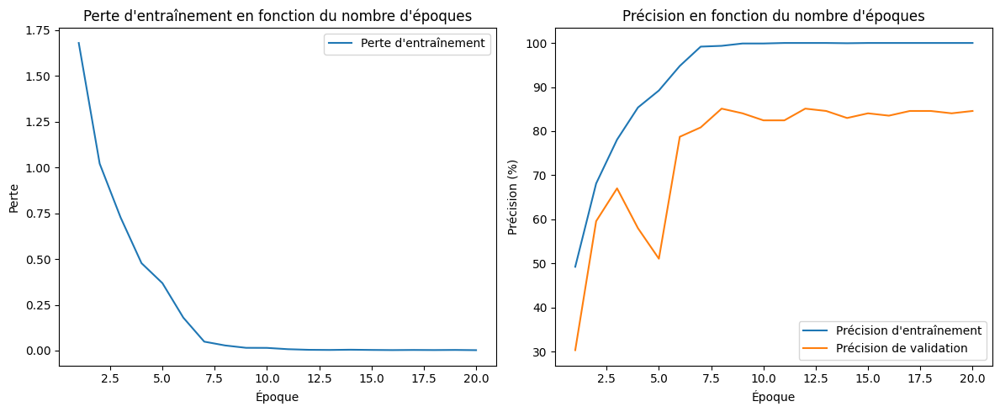

Entraînement avec les paramètres : {'batch_size': 64, 'gamma': 0.5, 'lr': 0.001, 'num_epochs': 20, 'optimizer': 'adam', 'step_size': 10}
Époque [1/20], Perte : 1.6952, Précision Entraînement : 48.40%, Précision Validation : 50.00%
Époque [2/20], Perte : 0.9943, Précision Entraînement : 68.19%, Précision Validation : 32.45%
Époque [3/20], Perte : 0.7928, Précision Entraînement : 74.88%, Précision Validation : 49.47%
Époque [4/20], Perte : 0.4833, Précision Entraînement : 84.72%, Précision Validation : 70.74%
Époque [5/20], Perte : 0.3595, Précision Entraînement : 88.27%, Précision Validation : 64.89%
Époque [6/20], Perte : 0.3038, Précision Entraînement : 90.52%, Précision Validation : 59.04%
Époque [7/20], Perte : 0.2164, Précision Entraînement : 92.77%, Précision Validation : 78.19%
Époque [8/20], Perte : 0.1852, Précision Entraînement : 93.90%, Précision Validation : 64.89%
Époque [9/20], Perte : 0.1354, Précision Entraînement : 96.50%, Précision Validation : 68.09%
Époque [10/20], P

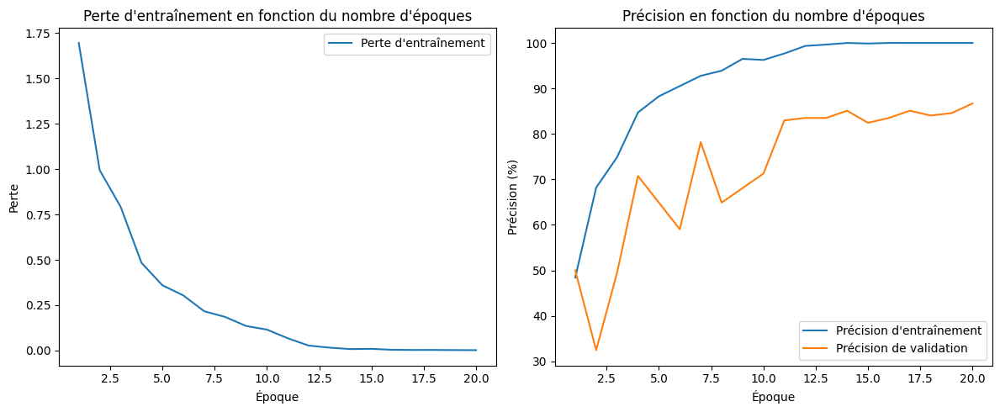

Entraînement avec les paramètres : {'batch_size': 64, 'gamma': 0.5, 'lr': 0.001, 'num_epochs': 20, 'optimizer': 'sgd', 'step_size': 5}
Époque [1/20], Perte : 2.3231, Précision Entraînement : 30.86%, Précision Validation : 62.77%
Époque [2/20], Perte : 1.2380, Précision Entraînement : 70.44%, Précision Validation : 75.53%
Époque [3/20], Perte : 0.7581, Précision Entraînement : 83.41%, Précision Validation : 83.51%
Époque [4/20], Perte : 0.5044, Précision Entraînement : 89.63%, Précision Validation : 82.45%
Époque [5/20], Perte : 0.3350, Précision Entraînement : 94.73%, Précision Validation : 81.38%
Époque [6/20], Perte : 0.2515, Précision Entraînement : 96.09%, Précision Validation : 84.04%
Époque [7/20], Perte : 0.1994, Précision Entraînement : 98.05%, Précision Validation : 83.51%
Époque [8/20], Perte : 0.1825, Précision Entraînement : 98.22%, Précision Validation : 83.51%
Époque [9/20], Perte : 0.1504, Précision Entraînement : 98.87%, Précision Validation : 81.91%
Époque [10/20], Per

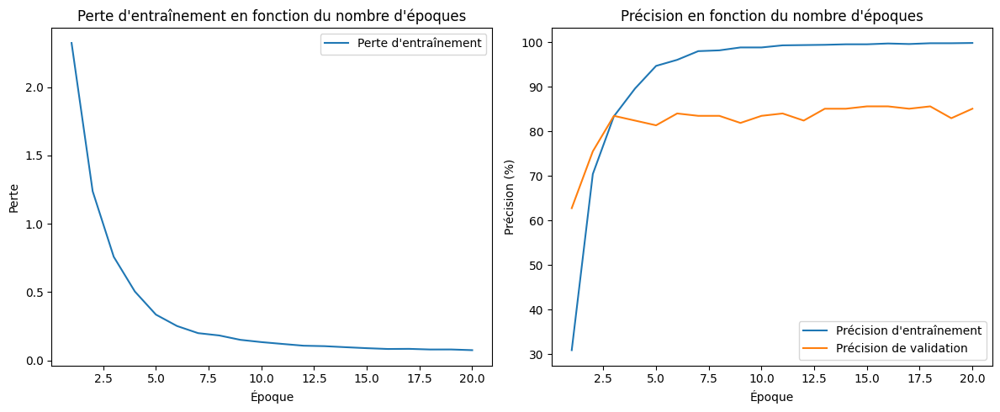

Entraînement avec les paramètres : {'batch_size': 64, 'gamma': 0.5, 'lr': 0.001, 'num_epochs': 20, 'optimizer': 'sgd', 'step_size': 10}
Époque [1/20], Perte : 2.2946, Précision Entraînement : 32.05%, Précision Validation : 57.98%
Époque [2/20], Perte : 1.2430, Précision Entraînement : 71.92%, Précision Validation : 79.79%
Époque [3/20], Perte : 0.7834, Précision Entraînement : 82.76%, Précision Validation : 82.45%
Époque [4/20], Perte : 0.5032, Précision Entraînement : 89.51%, Précision Validation : 84.04%
Époque [5/20], Perte : 0.3486, Précision Entraînement : 93.96%, Précision Validation : 86.17%
Époque [6/20], Perte : 0.2493, Précision Entraînement : 96.62%, Précision Validation : 86.70%
Époque [7/20], Perte : 0.1799, Précision Entraînement : 98.46%, Précision Validation : 84.04%
Époque [8/20], Perte : 0.1239, Précision Entraînement : 99.11%, Précision Validation : 86.17%
Époque [9/20], Perte : 0.1024, Précision Entraînement : 99.53%, Précision Validation : 85.64%
Époque [10/20], Pe

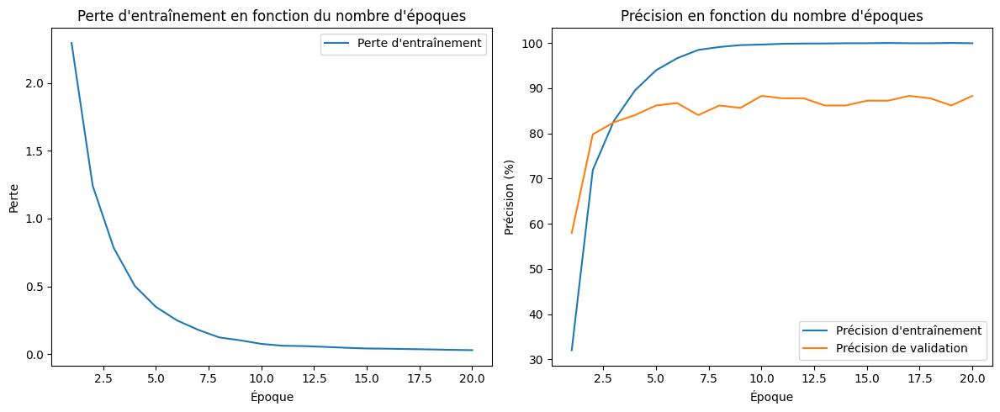

Entraînement avec les paramètres : {'batch_size': 64, 'gamma': 0.5, 'lr': 0.0001, 'num_epochs': 10, 'optimizer': 'adam', 'step_size': 5}
Époque [1/10], Perte : 1.6065, Précision Entraînement : 52.55%, Précision Validation : 82.98%
Époque [2/10], Perte : 0.4322, Précision Entraînement : 90.76%, Précision Validation : 85.64%
Époque [3/10], Perte : 0.1498, Précision Entraînement : 98.70%, Précision Validation : 87.23%
Époque [4/10], Perte : 0.0651, Précision Entraînement : 99.76%, Précision Validation : 88.30%
Époque [5/10], Perte : 0.0329, Précision Entraînement : 99.94%, Précision Validation : 87.77%
Époque [6/10], Perte : 0.0231, Précision Entraînement : 99.94%, Précision Validation : 86.70%
Époque [7/10], Perte : 0.0185, Précision Entraînement : 100.00%, Précision Validation : 87.23%
Époque [8/10], Perte : 0.0174, Précision Entraînement : 100.00%, Précision Validation : 87.77%
Époque [9/10], Perte : 0.0121, Précision Entraînement : 100.00%, Précision Validation : 87.23%
Époque [10/10]

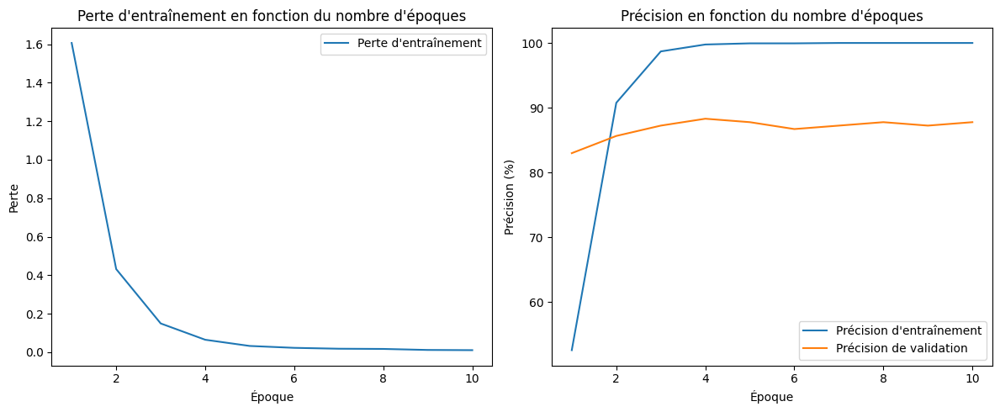

Entraînement avec les paramètres : {'batch_size': 64, 'gamma': 0.5, 'lr': 0.0001, 'num_epochs': 10, 'optimizer': 'adam', 'step_size': 10}
Époque [1/10], Perte : 1.5958, Précision Entraînement : 53.73%, Précision Validation : 80.85%
Époque [2/10], Perte : 0.4235, Précision Entraînement : 91.47%, Précision Validation : 86.17%
Époque [3/10], Perte : 0.1466, Précision Entraînement : 98.70%, Précision Validation : 84.57%
Époque [4/10], Perte : 0.0619, Précision Entraînement : 99.82%, Précision Validation : 85.64%
Époque [5/10], Perte : 0.0373, Précision Entraînement : 99.94%, Précision Validation : 88.30%
Époque [6/10], Perte : 0.0214, Précision Entraînement : 99.94%, Précision Validation : 87.77%
Époque [7/10], Perte : 0.0158, Précision Entraînement : 100.00%, Précision Validation : 87.23%
Époque [8/10], Perte : 0.0118, Précision Entraînement : 100.00%, Précision Validation : 87.23%
Époque [9/10], Perte : 0.0106, Précision Entraînement : 100.00%, Précision Validation : 88.30%
Époque [10/10

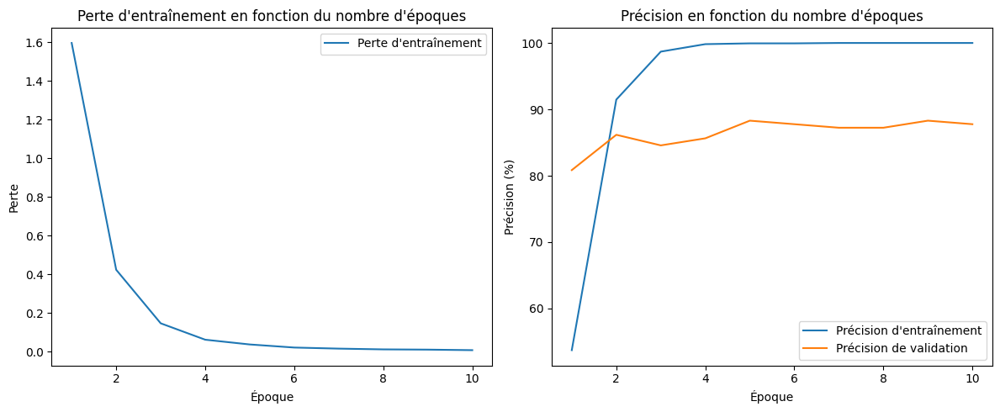

Entraînement avec les paramètres : {'batch_size': 64, 'gamma': 0.5, 'lr': 0.0001, 'num_epochs': 10, 'optimizer': 'sgd', 'step_size': 5}
Époque [1/10], Perte : 2.7610, Précision Entraînement : 9.60%, Précision Validation : 12.77%
Époque [2/10], Perte : 2.5271, Précision Entraînement : 17.95%, Précision Validation : 21.28%
Époque [3/10], Perte : 2.3463, Précision Entraînement : 31.22%, Précision Validation : 34.04%
Époque [4/10], Perte : 2.1787, Précision Entraînement : 42.18%, Précision Validation : 45.21%
Époque [5/10], Perte : 2.0300, Précision Entraînement : 49.23%, Précision Validation : 55.32%
Époque [6/10], Perte : 1.9067, Précision Entraînement : 55.57%, Précision Validation : 57.98%
Époque [7/10], Perte : 1.8407, Précision Entraînement : 57.29%, Précision Validation : 58.51%
Époque [8/10], Perte : 1.7762, Précision Entraînement : 60.84%, Précision Validation : 59.57%
Époque [9/10], Perte : 1.7042, Précision Entraînement : 62.97%, Précision Validation : 62.77%
Époque [10/10], Per

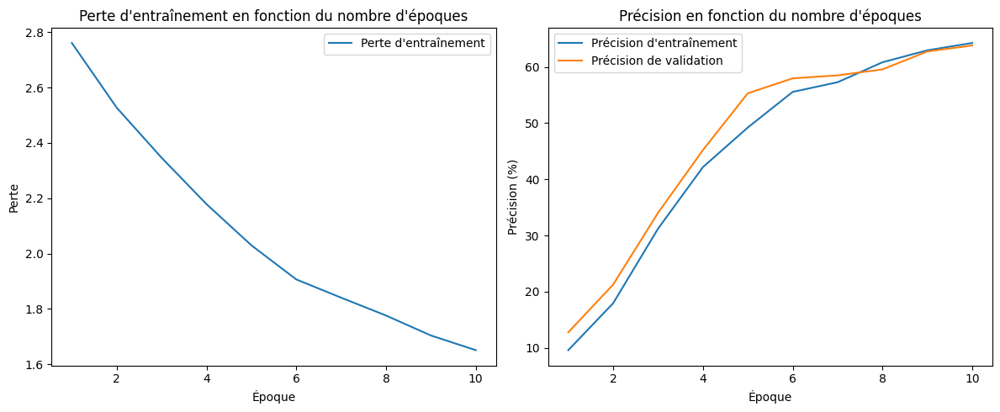

Entraînement avec les paramètres : {'batch_size': 64, 'gamma': 0.5, 'lr': 0.0001, 'num_epochs': 10, 'optimizer': 'sgd', 'step_size': 10}
Époque [1/10], Perte : 2.8146, Précision Entraînement : 8.18%, Précision Validation : 11.70%
Époque [2/10], Perte : 2.5469, Précision Entraînement : 18.19%, Précision Validation : 20.74%
Époque [3/10], Perte : 2.3610, Précision Entraînement : 30.86%, Précision Validation : 31.38%
Époque [4/10], Perte : 2.1895, Précision Entraînement : 40.23%, Précision Validation : 40.96%
Époque [5/10], Perte : 2.0180, Précision Entraînement : 51.30%, Précision Validation : 49.47%
Époque [6/10], Perte : 1.8765, Précision Entraînement : 56.75%, Précision Validation : 57.98%
Époque [7/10], Perte : 1.7377, Précision Entraînement : 62.14%, Précision Validation : 63.30%
Époque [8/10], Perte : 1.6166, Précision Entraînement : 65.40%, Précision Validation : 63.83%
Époque [9/10], Perte : 1.5074, Précision Entraînement : 70.50%, Précision Validation : 67.02%
Époque [10/10], Pe

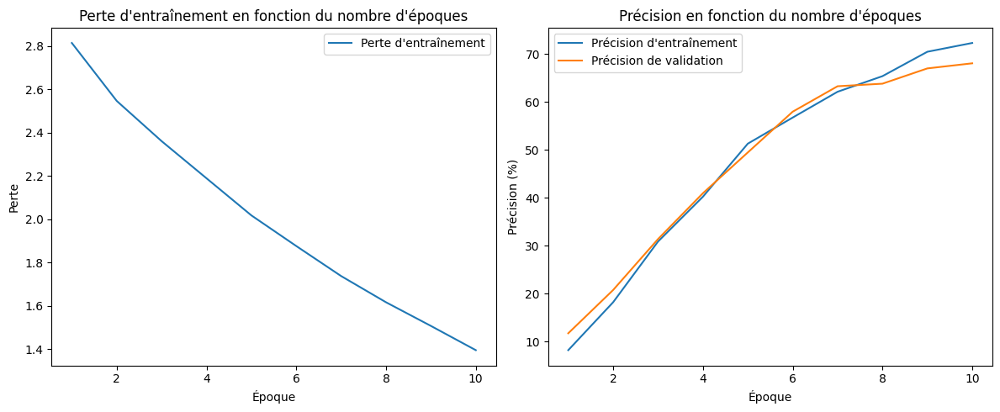

Entraînement avec les paramètres : {'batch_size': 64, 'gamma': 0.5, 'lr': 0.0001, 'num_epochs': 20, 'optimizer': 'adam', 'step_size': 5}
Époque [1/20], Perte : 1.5607, Précision Entraînement : 55.04%, Précision Validation : 79.79%
Époque [2/20], Perte : 0.4110, Précision Entraînement : 91.88%, Précision Validation : 85.11%
Époque [3/20], Perte : 0.1376, Précision Entraînement : 99.05%, Précision Validation : 86.17%
Époque [4/20], Perte : 0.0596, Précision Entraînement : 99.94%, Précision Validation : 86.70%
Époque [5/20], Perte : 0.0306, Précision Entraînement : 100.00%, Précision Validation : 86.17%
Époque [6/20], Perte : 0.0194, Précision Entraînement : 100.00%, Précision Validation : 87.23%
Époque [7/20], Perte : 0.0164, Précision Entraînement : 100.00%, Précision Validation : 87.77%
Époque [8/20], Perte : 0.0171, Précision Entraînement : 100.00%, Précision Validation : 88.30%
Époque [9/20], Perte : 0.0129, Précision Entraînement : 100.00%, Précision Validation : 88.30%
Époque [10/2

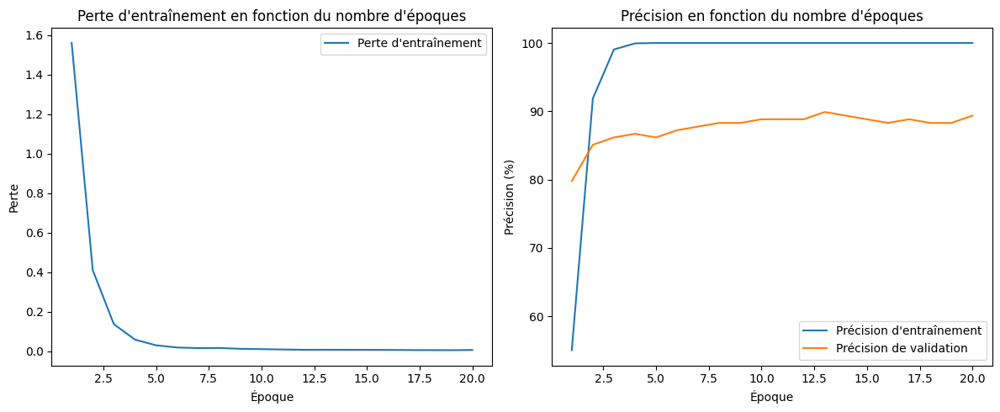

Entraînement avec les paramètres : {'batch_size': 64, 'gamma': 0.5, 'lr': 0.0001, 'num_epochs': 20, 'optimizer': 'adam', 'step_size': 10}
Époque [1/20], Perte : 1.5777, Précision Entraînement : 54.80%, Précision Validation : 78.19%
Époque [2/20], Perte : 0.4359, Précision Entraînement : 91.05%, Précision Validation : 82.98%
Époque [3/20], Perte : 0.1474, Précision Entraînement : 98.52%, Précision Validation : 86.17%
Époque [4/20], Perte : 0.0669, Précision Entraînement : 99.70%, Précision Validation : 86.70%
Époque [5/20], Perte : 0.0349, Précision Entraînement : 99.94%, Précision Validation : 87.77%
Époque [6/20], Perte : 0.0237, Précision Entraînement : 99.94%, Précision Validation : 88.83%
Époque [7/20], Perte : 0.0136, Précision Entraînement : 100.00%, Précision Validation : 89.36%
Époque [8/20], Perte : 0.0112, Précision Entraînement : 100.00%, Précision Validation : 88.30%
Époque [9/20], Perte : 0.0102, Précision Entraînement : 100.00%, Précision Validation : 89.36%
Époque [10/20

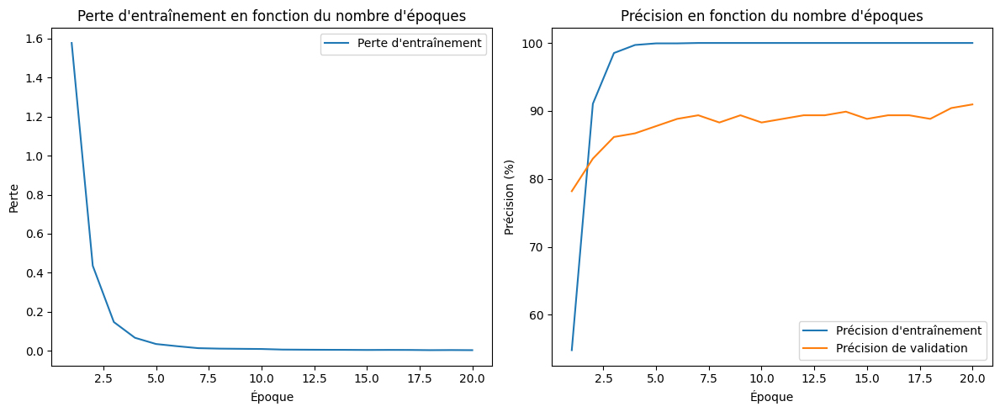

Entraînement avec les paramètres : {'batch_size': 64, 'gamma': 0.5, 'lr': 0.0001, 'num_epochs': 20, 'optimizer': 'sgd', 'step_size': 5}
Époque [1/20], Perte : 2.7642, Précision Entraînement : 8.29%, Précision Validation : 11.70%
Époque [2/20], Perte : 2.5328, Précision Entraînement : 18.54%, Précision Validation : 22.87%
Époque [3/20], Perte : 2.3466, Précision Entraînement : 30.45%, Précision Validation : 30.32%
Époque [4/20], Perte : 2.1749, Précision Entraînement : 40.52%, Précision Validation : 44.15%
Époque [5/20], Perte : 2.0226, Précision Entraînement : 48.05%, Précision Validation : 54.26%
Époque [6/20], Perte : 1.9052, Précision Entraînement : 54.86%, Précision Validation : 56.38%
Époque [7/20], Perte : 1.8310, Précision Entraînement : 57.70%, Précision Validation : 58.51%
Époque [8/20], Perte : 1.7731, Précision Entraînement : 59.66%, Précision Validation : 61.17%
Époque [9/20], Perte : 1.7039, Précision Entraînement : 63.27%, Précision Validation : 64.89%
Époque [10/20], Per

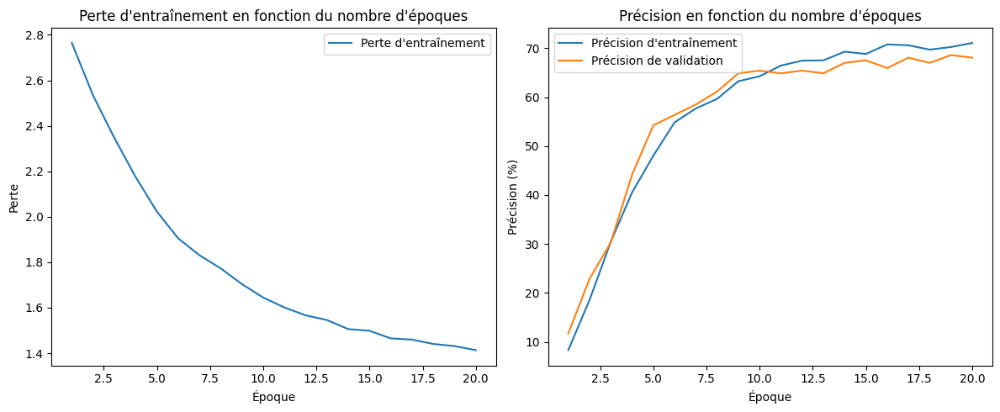

Entraînement avec les paramètres : {'batch_size': 64, 'gamma': 0.5, 'lr': 0.0001, 'num_epochs': 20, 'optimizer': 'sgd', 'step_size': 10}
Époque [1/20], Perte : 2.7488, Précision Entraînement : 9.60%, Précision Validation : 14.36%
Époque [2/20], Perte : 2.4984, Précision Entraînement : 20.68%, Précision Validation : 24.47%
Époque [3/20], Perte : 2.3200, Précision Entraînement : 33.12%, Précision Validation : 35.11%
Époque [4/20], Perte : 2.1521, Précision Entraînement : 41.71%, Précision Validation : 47.87%
Époque [5/20], Perte : 2.0026, Précision Entraînement : 50.30%, Précision Validation : 56.38%
Époque [6/20], Perte : 1.8614, Précision Entraînement : 56.22%, Précision Validation : 61.70%
Époque [7/20], Perte : 1.7253, Précision Entraînement : 61.49%, Précision Validation : 63.30%
Époque [8/20], Perte : 1.6051, Précision Entraînement : 65.64%, Précision Validation : 68.09%
Époque [9/20], Perte : 1.4968, Précision Entraînement : 69.31%, Précision Validation : 68.62%
Époque [10/20], Pe

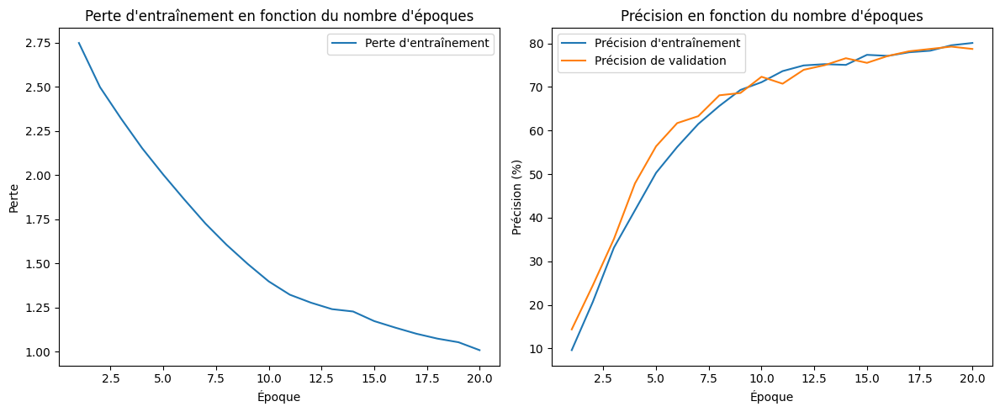


Meilleurs paramètres : {'batch_size': 64, 'gamma': 0.5, 'lr': 0.0001, 'num_epochs': 20, 'optimizer': 'adam', 'step_size': 10}
Meilleure précision de validation : 90.96%


In [ ]:
best_params, best_accuracy = grid_search(train_loader, val_loader, num_classes=num_classes)

On obient ainsi :

Meilleurs paramètres :

 {'batch_size': 64, 'gamma': 0.5, 'lr': 0.0001, 'num_epochs': 20, 'optimizer': 'adam', 'step_size': 10}

Meilleure précision de validation : 90.96%

### Création du meilleur modèle

In [32]:
model = create_resnet18_model(num_classes)
model.to(device)
batch_size =64
gamma =0.5
lr =0.0001
num_epochs =20
optimizer = optim.Adam(model.parameters(), lr= lr)
step_size =10
scheduler = StepLR(optimizer, step_size= step_size, gamma=gamma)
criterion = nn.CrossEntropyLoss()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Époque [1/20], Perte : 1.5438, Précision Entraînement : 57.41%, Précision Validation : 79.79%
Époque [2/20], Perte : 0.4209, Précision Entraînement : 92.06%, Précision Validation : 84.04%
Époque [3/20], Perte : 0.1437, Précision Entraînement : 98.76%, Précision Validation : 87.23%
Époque [4/20], Perte : 0.0589, Précision Entraînement : 99.88%, Précision Validation : 86.70%
Époque [5/20], Perte : 0.0337, Précision Entraînement : 99.94%, Précision Validation : 86.70%
Époque [6/20], Perte : 0.0209, Précision Entraînement : 100.00%, Précision Validation : 87.77%
Époque [7/20], Perte : 0.0166, Précision Entraînement : 99.94%, Précision Validation : 88.30%
Époque [8/20], Perte : 0.0122, Précision Entraînement : 100.00%, Précision Validation : 88.30%
Époque [9/20], Perte : 0.0102, Précision Entraînement : 100.00%, Précision Validation : 88.30%
Époque [10/20], Perte : 0.0084, Précision Entraînement : 100.00%, Précision Validation : 88.30%
Époque [11/20], Perte : 0.0061, Précision Entraînement 

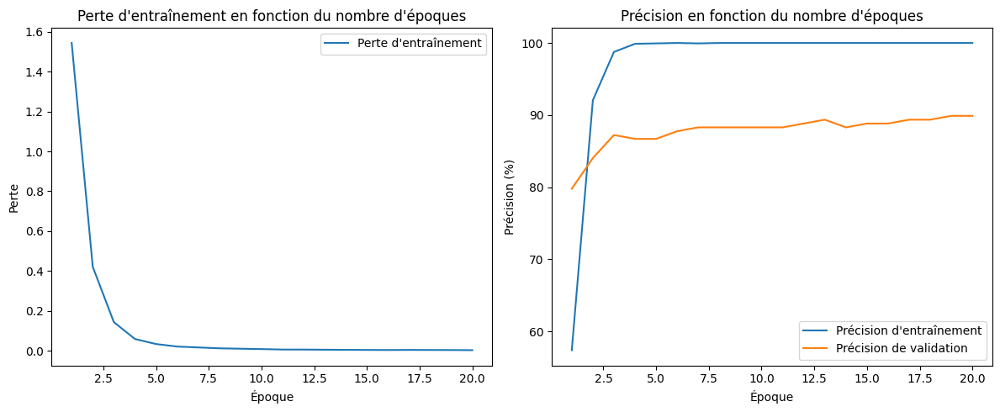

In [33]:
train_loss, train_accuraci, val_accuraci = train(model, train_loader, val_loader, criterion, optimizer, scheduler, num_epochs= 20)

In [34]:
# Évaluation finale sur le jeu de test
test_accuracy, pred_label = evaluate(model, test_loader)
print(f"Taux de précision sur le jeu de test : {test_accuracy:.2f}%")

Taux de précision sur le jeu de test : 85.50%


À l'aide de cette exploration sur tous ces paramètres, on a pu définir la meilleure combinaison de paramètres pour notre modèle. Encore une fois, cette optimisation n'est pas exhaustive, par exemple nous n'avons pris que 10 ou 20 epoch mais il aurait était préférable de réaliser une bien meilleur optimisation sur ce paramètre. Pour des raisons de temps de calcul, on s'en contentera.

## Test en fonction du nombre d'artiste

Avec notre modèle sélectionner, on peut maintenant tester les résultats en fonction du nombre d'artistes gardé.

Ici, il serait judicieux de re faire une optimisation pour savoir quel modèle est le mieux avec quels paramètres. En effet, en changeant le problème, on a des chances de changer sa solution.

Pour des raisons de simplification, on se contentera de tester avec le meilleur modèle choisi précédemment.

### Fonction pour tester différent Tab_min et Tab_max

In [39]:
def test_model_with_different_tabmin_tabmax(art_dataset, full_dataset_transformed, tab_min_values, tab_max_values, num_epochs=20):
    """
    Fonction pour tester le modèle ResNet18 en fonction de différentes valeurs de TAB_MIN et TAB_MAX.
    """
    test_accuracies = []

    for tab_min in tab_min_values:
        for tab_max in tab_max_values:
            print(f"Testing with TAB_MIN = {tab_min}, TAB_MAX = {tab_max}...")

            # Filtrer les datasets en fonction de TAB_MIN et TAB_MAX
            art_datasetf, full_dataset_transformedf = filter_datasets(art_dataset, full_dataset_transformed, ARTIST_COUNT, tab_min, tab_max)
            art_datasetf, label_mapping = remap_labels(art_datasetf, art_dataset.classes)
            full_dataset_transformedf, _ = remap_labels(full_dataset_transformedf, full_dataset_transformed.classes)

            # Séparation des données et création des loaders
            loaders = split_and_load_data(art_datasetf, full_dataset_transformedf, test_split=0.2, val_split=0.1, batch_size=64, random_seed=42)
            train_loader = loaders["train_loader"]
            train_loader_transformed = loaders["train_loader_transformed"]
            val_loader = loaders["val_loader"]
            test_loader = loaders["test_loader"]

            num_classes = len(set([art_dataset.classes[label] for _, label in art_datasetf]))  # Nombre d'artistes
            print(f"Nombre d'artistes : {num_classes}")

            # Créer le modèle ResNet18
            model = create_resnet18_model(num_classes)
            model.to(device)

            # Optimiseur et scheduler
            optimizer = optim.Adam(model.parameters(), lr=0.0001)
            scheduler = StepLR(optimizer, step_size=10, gamma=0.5)
            criterion = nn.CrossEntropyLoss()

            # Entraînement du modèle
            train(model, train_loader, val_loader, criterion, optimizer, scheduler, num_epochs)

            # Évaluer la précision sur l'ensemble de test
            test_accuracy,_ = evaluate(model, test_loader)
            test_accuracies.append(test_accuracy)

            print(f"Test accuracy with TAB_MIN = {tab_min}, TAB_MAX = {tab_max}: {test_accuracy:.2f}%")

    # Tracer les résultats
    plt.figure(figsize=(10, 6))
    plt.plot(test_accuracies, label='Test Accuracy', marker='o')
    plt.xlabel('Test Number (Different TAB_MIN/TAB_MAX Combinations)')
    plt.ylabel('Accuracy (%)')
    plt.title('Test Accuracy for Different TAB_MIN/TAB_MAX Combinations')
    plt.legend()
    plt.show()

    return test_accuracies


### Comparaison

In [40]:
tab_min_values = [80, 100]  # Exemples de valeurs de TAB_MIN
tab_max_values = [200,900]  # Exemples de valeurs de TAB_MAX

In [ ]:
test_accuracies = test_model_with_different_tabmin_tabmax(art_dataset, full_dataset_transformed, tab_min_values, tab_max_values)

Testing with TAB_MIN = 80, TAB_MAX = 200...


Malheureusement, ici, les calculs sont très long et très coûteux en ressource. Google colab ne permet donc pas de pouvoir faire une comparaison efficace entre les résultats selon le nombre d'artistes gardés.

Il serait néanmoins possible de le faire avec du temps en le faisant 1 par 1. On verrait ainsi que moins il y a d'artiste meilleur sont les performances.

 On pourrait aussi voir quels sont les résultats quand on sous échantillonne les artistes ayant trop de tableau pour les inclure ce qui pourrait peut être permettre d'augmenter le nombre d'artistes pris en compte sans diminuer les performances du modèle.

# Analyse des resultats en fonction des styles et des artistes

On peut maintenant s'attacher à analyser les résultats d'un autre angle et essayer de comprendre pourquoi notre modèle fait de mauvaise prédiction. Les artistes qu'ils confond ont il des style similaires ? Confond t-il toujours les mêmes artistes ?

In [36]:
# Créer un vecteur pour stocker les prédictions
all_predictions = []

# Boucle sur les données du test_loader
for images, labels in test_loader:
  images, labels = images.to(device), labels.to(device)
  outputs = model(images)
  _, predicted = torch.max(outputs, 1)

  # Convertir les prédictions en une liste de nombres et ajouter à all_predictions
  all_predictions.extend(predicted.cpu().numpy().tolist())

# all_predictions contient maintenant toutes les prédictions du test_dataset
len(all_predictions)

469

In [37]:
def get_artist_genre(artist_name, df_artists):
  """
  Returns the genre of a given artist using the df_artists DataFrame.
  Handles artist names with underscores by replacing them with spaces.

  Args:
    artist_name: The name of the artist (can contain underscores).
    df_artists: The DataFrame containing artist information, including genre.

  Returns:
    The genre of the artist, or None if the artist is not found.
  """
  try:
    # Replace underscores with spaces in the artist name
    artist_name_processed = artist_name.replace("_", " ")

    artist_row = df_artists[df_artists['name'] == artist_name_processed]
    if not artist_row.empty:
      return artist_row['genre'].iloc[0]
    else:
      return None
  except Exception as e:
    print(f"Erreur lors de la recherche de l'artiste : {e}")
    return None

# Example usage (assuming df_artists is your DataFrame)
artist_name = "Pablo_Picasso"  # Artist name with underscores
genre = get_artist_genre(artist_name, df_artists)
if genre:
  print(f"Le genre de {artist_name} est : {genre}")
else:
  print(f"Artiste {artist_name} non trouvé dans la base de données.")

Le genre de Pablo_Picasso est : Cubism


In [39]:
# Affichage d'un tabelau comparatif avec les prediction de all_predication , le vrai artiste , le style de l'artiste prédit et le style du vrai artist
import pandas as pd

# Create a list to store the results
results = []

# Iterate through the test dataset and predictions
for i in range(len(test_loader.dataset)):
  image, true_label = test_loader.dataset[i]
  predicted_label = all_predictions[i]

  true_artist = art_dataset.classes[true_label]  # Get true artist name
  predicted_artist = art_dataset.classes[predicted_label]  # Get predicted artist name

  true_artist_style = get_artist_genre(true_artist, df_artists)
  predicted_artist_style = get_artist_genre(predicted_artist, df_artists)
  results.append([predicted_artist, true_artist, predicted_artist_style, true_artist_style])

# Create a Pandas DataFrame
df_results = pd.DataFrame(results, columns=['Predicted Artist', 'True Artist', 'Predicted Artist Style', 'True Artist Style'])

# Display the DataFrame
df_results

,Predicted Artist,True Artist,Predicted Artist Style,True Artist Style
0,Alfred_Sisley,Edouard_Manet,Impressionism,"Realism,Impressionism"
1,Albrecht_Dürer,Albrecht_Dürer,Northern Renaissance,Northern Renaissance
2,Diego_Rivera,Diego_Rivera,"Social Realism,Muralism","Social Realism,Muralism"
3,El_Greco,El_Greco,Mannerism,Mannerism
4,Diego_Rivera,Diego_Rivera,"Social Realism,Muralism","Social Realism,Muralism"
...,...,...,...,...
464,Albrecht_Dürer,Albrecht_Dürer,Northern Renaissance,Northern Renaissance
465,Camille_Pissarro,Camille_Pissarro,"Impressionism,Post-Impressionism","Impressionism,Post-Impressionism"
466,Edvard_Munch,Edvard_Munch,"Symbolism,Expressionism","Symbolism,Expressionism"
467,Amedeo_Modigliani,Amedeo_Modigliani,Expressionism,Expressionism


## Comparaisons en fonction des styles

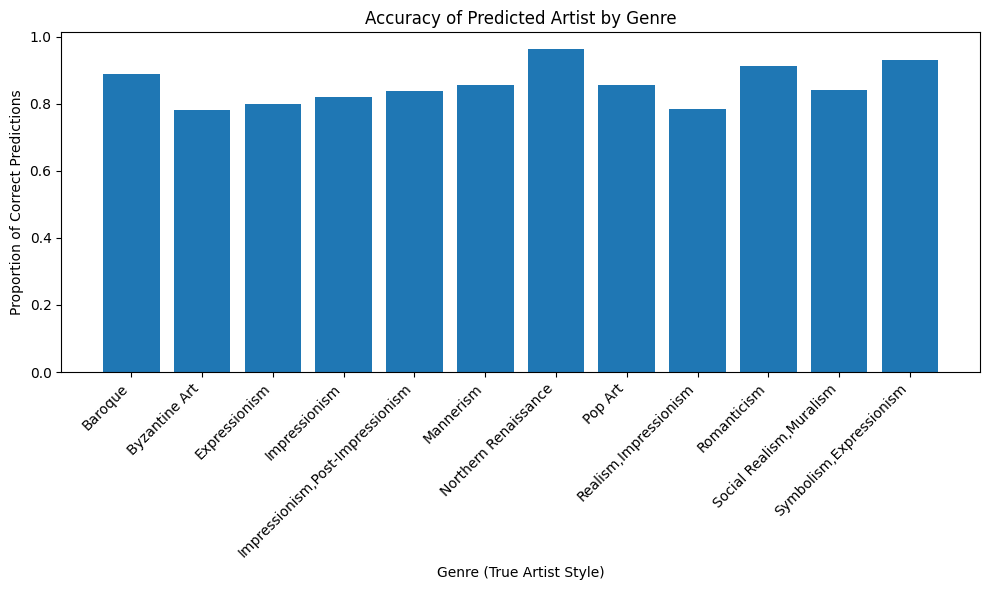

In [40]:
# affichage de la proportion de fois ou predicted artist = true artist en fonction du genre

# Create a new column indicating whether the prediction was correct
df_results['Correct Prediction'] = df_results['Predicted Artist'] == df_results['True Artist']

# Group by genre (True Artist Style) and calculate the proportion of correct predictions
genre_accuracy = df_results.groupby('True Artist Style')['Correct Prediction'].mean()

# Create a bar chart using matplotlib or seaborn
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 6))
plt.bar(genre_accuracy.index, genre_accuracy.values)
plt.xlabel('Genre (True Artist Style)')
plt.ylabel('Proportion of Correct Predictions')
plt.title('Accuracy of Predicted Artist by Genre')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

On peut voir ici que les styles des tableaux sont bien prédits de manière équivalente peu importe leur style ceci est aussi dû au fait qu'on a ici 12 styles représentés pour 15 artistes différents.


In [82]:
# Assuming df_results is the DataFrame created in the previous code block.
artist_counts_by_style = df_results.groupby('True Artist Style')['True Artist'].nunique()
artist_counts_by_style

,True Artist
True Artist Style,
Baroque,2
Byzantine Art,1
Expressionism,1
Impressionism,3
"Impressionism,Post-Impressionism",1
Mannerism,1
Northern Renaissance,1
Pop Art,1
"Realism,Impressionism",1


Il y a donc peu d'artistes au style similaire ce qui peut participer aux bons résultats de notre modèle. Prendre plus d'artiste pourrait permettre, faire apparaître des différence de résultats entre les styles. On pourrait ainsi identifier un style pour lequel les tableaux se ressemblent trop aux yeux du modèle.

In [79]:
# Filter the DataFrame to show rows where 'True Artist Style' equals 'Predicted Artist Style' and 'Correct Prediction' is False
filtered_df = df_results[(df_results['True Artist Style'] == df_results['Predicted Artist Style']) & (df_results['Correct Prediction'] == False)]

# Display the filtered DataFrame
filtered_df

,Predicted Artist,True Artist,Predicted Artist Style,True Artist Style,Correct Prediction
109,Claude_Monet,Edgar_Degas,Impressionism,Impressionism,False
124,Claude_Monet,Alfred_Sisley,Impressionism,Impressionism,False
234,Claude_Monet,Edgar_Degas,Impressionism,Impressionism,False
313,Alfred_Sisley,Edgar_Degas,Impressionism,Impressionism,False
318,Claude_Monet,Alfred_Sisley,Impressionism,Impressionism,False


On voit par exemple que des tableaux de style Impressionism sont souvent confondus avec des tableaux du même style. On peut alors bien imaginé comment les performances du modèle pourrait chuter en augmentant le nombre d'artistes par style et donc en augmentant le nombre de tableaux similaires.

## Fonction pour afficher les images en fonction des indices données

In [43]:
def denormalize(image, mean, std):
    image = image * std + mean
    return np.clip(image, 0, 1)  # Clip pour garder les valeurs entre 0 et 1

In [61]:
def display_images_with_predictions(indices, test_dataset, predictions):
    """
    Displays images at specified indices with their true labels and predicted labels.

    Args:
        indices: A list of indices of images to display.
        dataset: The dataset containing images and labels.  Assumed to support indexing and have an attribute 'classes'.
        predictions: A list of predicted labels corresponding to the dataset.
    """
    import matplotlib.pyplot as plt

    fig, axes = plt.subplots( 1,len(indices), figsize=(5*len(indices), 5))  # Adjust figsize as needed

    if len(indices) == 1:  # Handle single image case
        axes = [axes]

    for i, index in enumerate(indices):
        print(index)
        image, true_label = test_dataset[index]
        image = image.unsqueeze(0).to(device) # Add batch dimension and move to device
        image = image.squeeze(0).cpu().numpy().transpose(1, 2, 0)

        # Dénormaliser l'image si elle a été normalisée
        image = denormalize(image, np.array([0.5, 0.5, 0.5]), np.array([0.5, 0.5, 0.5]))

        real_label = true_label
        predicted_label = predictions[index]

        real_author = art_dataset.classes[real_label]
        predicted_author = art_dataset.classes[predicted_label]

        axes[i].imshow(image)
        axes[i].set_title(f"True: {real_author}\nPredicted: {predicted_author}")
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()

## Comparaisons en fonction des artistes

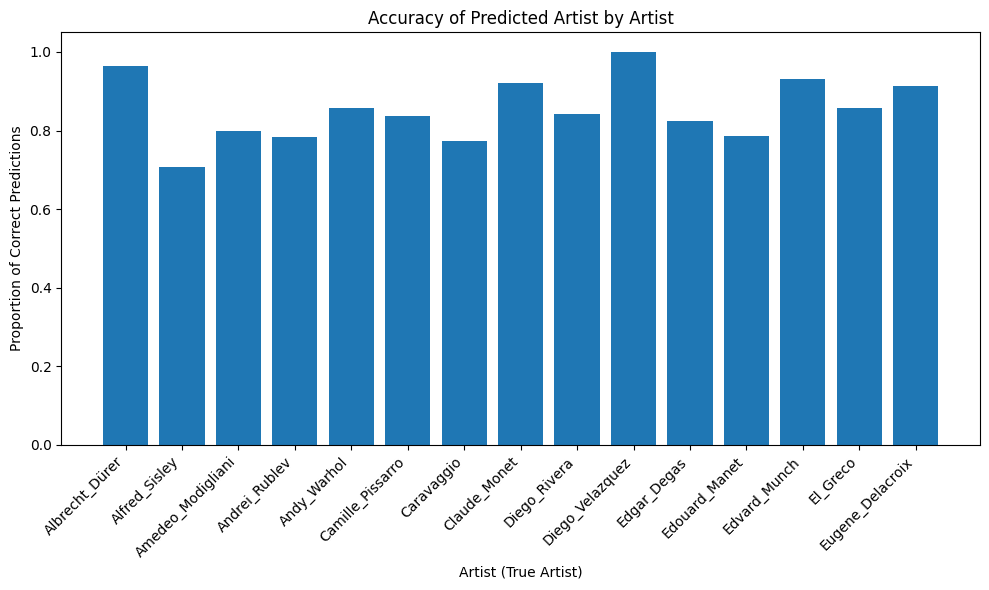

In [41]:
# prompt: afficher plot la proportion de fois ou predicted artist = true artist en fonction de l'artist

# Create a new column indicating whether the prediction was correct
df_results['Correct Prediction'] = df_results['Predicted Artist'] == df_results['True Artist']

# Group by True Artist and calculate the proportion of correct predictions
artist_accuracy = df_results.groupby('True Artist')['Correct Prediction'].mean()

# Create a bar chart using matplotlib or seaborn
plt.figure(figsize=(10, 6))
plt.bar(artist_accuracy.index, artist_accuracy.values)
plt.xlabel('Artist (True Artist)')
plt.ylabel('Proportion of Correct Predictions')
plt.title('Accuracy of Predicted Artist by Artist')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

60
7
15


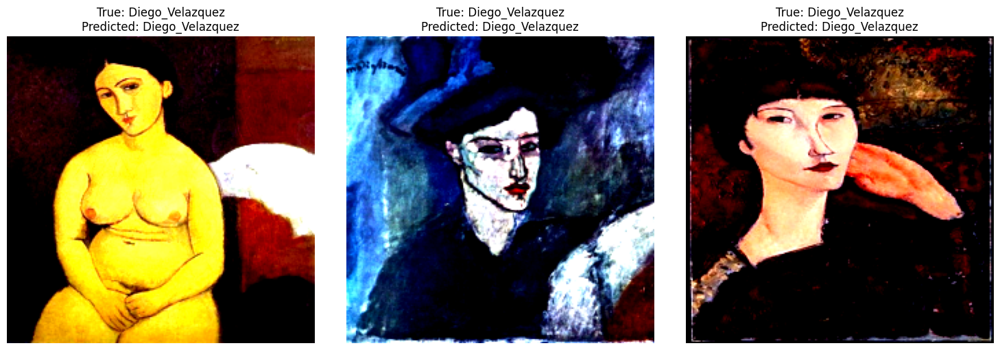

In [62]:
indices = {7,15,60}
display_images_with_predictions(indices, test_loader.dataset, all_predictions)

On peut voir ici qu'il n'y a quelques différence entre les artiste. Diego Velazquez par exemple est très bien prédit par le modèle car il à la fois un style très différent des autres artistes tout en ayant un style qui se retrouve facilement dans ces différents tableaux.

In [65]:
# prompt: afficher df_resultes ou true artist est alfred sisley

# Filter the DataFrame to show rows where 'True Artist' is 'Alfred Sisley'
df_sisley = df_results[df_results['True Artist'] == 'Alfred_Sisley']

# Display the filtered DataFrame
df_sisley

,Predicted Artist,True Artist,Predicted Artist Style,True Artist Style,Correct Prediction
31,Alfred_Sisley,Alfred_Sisley,Impressionism,Impressionism,True
45,Alfred_Sisley,Alfred_Sisley,Impressionism,Impressionism,True
53,Alfred_Sisley,Alfred_Sisley,Impressionism,Impressionism,True
101,Alfred_Sisley,Alfred_Sisley,Impressionism,Impressionism,True
110,Alfred_Sisley,Alfred_Sisley,Impressionism,Impressionism,True
114,Eugene_Delacroix,Alfred_Sisley,Romanticism,Impressionism,False
124,Claude_Monet,Alfred_Sisley,Impressionism,Impressionism,False
133,Edvard_Munch,Alfred_Sisley,"Symbolism,Expressionism",Impressionism,False
161,Alfred_Sisley,Alfred_Sisley,Impressionism,Impressionism,True
165,Alfred_Sisley,Alfred_Sisley,Impressionism,Impressionism,True


73
101
133


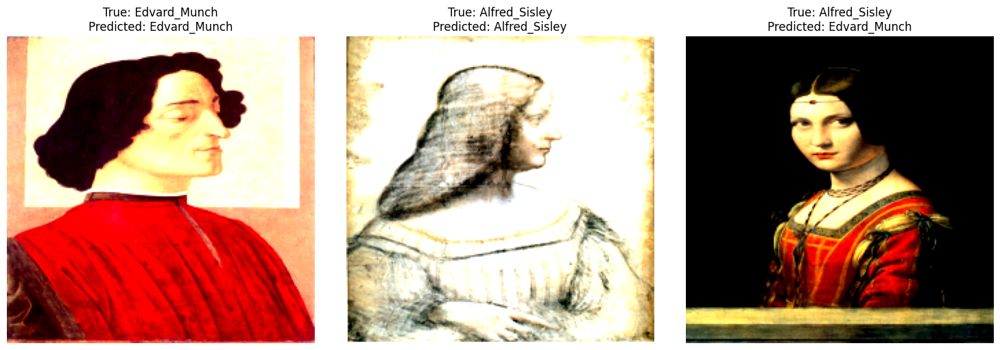

121
202
62


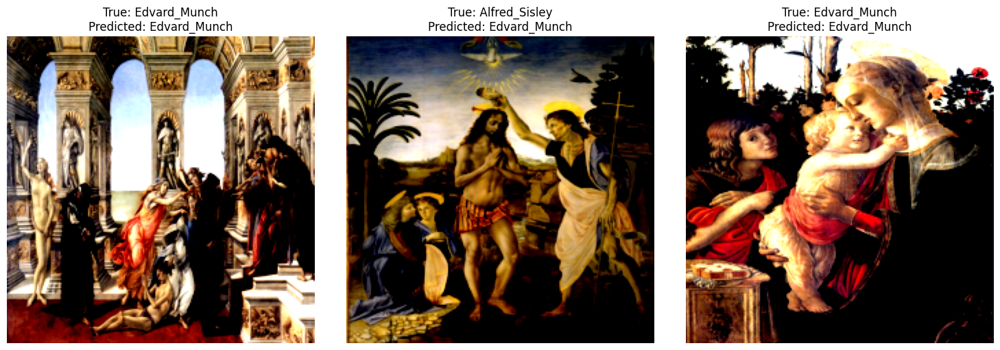

In [64]:
indices = {133,101,73}
display_images_with_predictions(indices, test_loader.dataset, all_predictions)
indices = {202,62,121}
display_images_with_predictions(indices, test_loader.dataset, all_predictions)

On peut ici comprendre les erreurs de notre modèle sur les prédictions des tableaux d'Alfred Sisley. On voit par exemple qu'il prédit parfois Edvard Munch ce qui s'explique par le fait que comme montrer sur les tableaux ci-dessus, leur style son similaires, avec des couleurs similaires et des représentations assez similaires.

# Conclusion

La classification des œuvres d’art par artiste est donc un problème complexe. On a pu voir comment selctionner et optimiser notre modèle afin d'obtenir,sur un sous problème à 15 artiste uniquement, jusqu'a 85% de bonne prédiction.

Cependant il est très dur d'obtenir de meilleur performance surtout lorque l'on augment les nombre d'artistes. Cela est dû à plusieur facteur :

Variabilité des styles : Un artiste peut produire des œuvres très différentes en termes de style, couleur et technique, ce qui complique l’identification des caractéristiques communes. Deux œuvres d’un même artiste peuvent être visuellement très différentes.

Similarité inter-artistes : À l’inverse, des artistes différents peuvent créer des œuvres qui se ressemblent énormément. Cette ambiguïté visuelle rend difficile, même pour l’œil humain, de différencier certains artistes.


# Bonus : pistes d'amélioration





*   Augmentation des données : En appliquant des techniques de data augmentation, le modèle pourrait être mieux préparé à reconnaître les œuvres sous des perspectives et styles variés.

* Exploration de caractéristiques contextuelles : En enrichissant le modèle avec des informations contextuelles, telles que le style artistique ou la période de création, on pourrait aider le modèle à affiner sa compréhension des différences subtiles entre les artistes.

* Utilisation de modèles plus complexe : il existe de nombreux modèles disponible qui pourrait nous permettre de peut être améliorer les performances il serait intéressant de les tester

## Data augmentation

On peut ici entraîner les modèles définit précedent sur nos données train transformées.

In [66]:
from torch.utils.data import ConcatDataset, DataLoader

train_dataset = train_loader.dataset  # Dataset original non transformé
train_dataset_transformed = train_loader_transformed.dataset  # Dataset transformé

# Combinez les deux datasets
combined_dataset = ConcatDataset([train_dataset, train_dataset_transformed])

# Créez un DataLoader pour le dataset combiné
combined_train_loader = DataLoader(combined_dataset, batch_size=batch_size, shuffle=True)

In [68]:
modelT = create_resnet18_model(num_classes)
modelT.to(device)
batch_size =64
gamma =0.5
lr =0.0001
num_epochs =20
optimizer = optim.Adam(model.parameters(), lr= lr)
step_size =10
scheduler = StepLR(optimizer, step_size= step_size, gamma=gamma)
criterion = nn.CrossEntropyLoss()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Époque [1/20], Perte : 3.0047, Précision Entraînement : 6.78%, Précision Validation : 3.72%
Époque [2/20], Perte : 3.0064, Précision Entraînement : 6.78%, Précision Validation : 3.72%
Époque [3/20], Perte : 3.0041, Précision Entraînement : 6.72%, Précision Validation : 3.72%
Époque [4/20], Perte : 3.0055, Précision Entraînement : 6.90%, Précision Validation : 3.72%
Époque [5/20], Perte : 3.0047, Précision Entraînement : 7.08%, Précision Validation : 3.72%
Époque [6/20], Perte : 3.0029, Précision Entraînement : 6.81%, Précision Validation : 3.72%
Époque [7/20], Perte : 3.0052, Précision Entraînement : 6.81%, Précision Validation : 3.72%
Époque [8/20], Perte : 3.0053, Précision Entraînement : 6.84%, Précision Validation : 3.72%
Époque [9/20], Perte : 3.0056, Précision Entraînement : 6.72%, Précision Validation : 3.72%
Époque [10/20], Perte : 3.0042, Précision Entraînement : 7.08%, Précision Validation : 3.72%
Époque [11/20], Perte : 3.0060, Précision Entraînement : 6.96%, Précision Valid

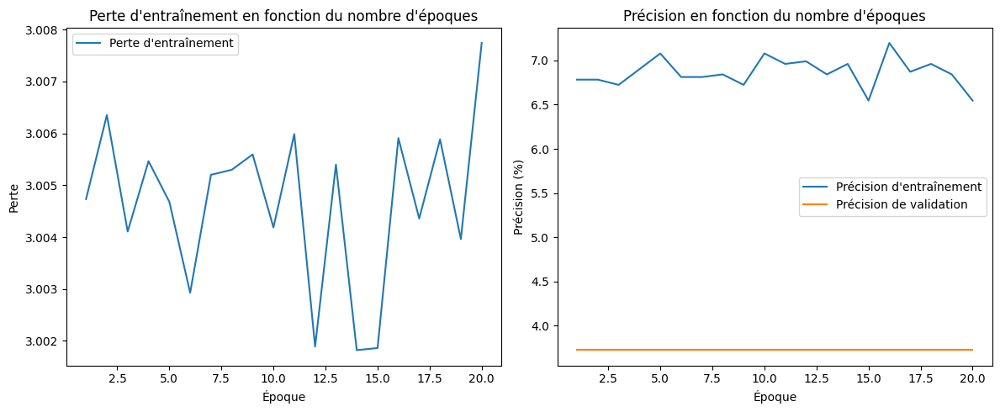

([3.004733382530932,
  3.0063532793296956,
  3.00410813205647,
  3.0054645763253265,
  3.0046821945118456,
  3.002927969086845,
  3.005202387863735,
  3.0052991408222125,
  3.005594109589199,
  3.0041877188772523,
  3.0059868884536454,
  3.001890668329203,
  3.0053971578490057,
  3.001821805846016,
  3.0018630432632736,
  3.005908525215005,
  3.004360225965392,
  3.0058848498002537,
  3.003962705720146,
  3.0077431516827278],
 [6.783175355450237,
  6.783175355450237,
  6.7239336492890995,
  6.901658767772512,
  7.079383886255924,
  6.812796208530806,
  6.812796208530806,
  6.842417061611374,
  6.7239336492890995,
  7.079383886255924,
  6.960900473933649,
  6.990521327014218,
  6.842417061611374,
  6.960900473933649,
  6.546208530805687,
  7.197867298578199,
  6.872037914691943,
  6.960900473933649,
  6.842417061611374,
  6.546208530805687],
 [3.723404255319149,
  3.723404255319149,
  3.723404255319149,
  3.723404255319149,
  3.723404255319149,
  3.723404255319149,
  3.723404255319149,


In [69]:
train(modelT, combined_train_loader, val_loader, criterion, optimizer, scheduler, num_epochs= 20)

In [70]:
# Évaluation finale sur le jeu de test
test_accuracyT, pred_labelT = evaluate(modelT, test_loader)
print(f"Taux de précision sur le jeu de test : {test_accuracyT:.2f}%")

Taux de précision sur le jeu de test : 6.40%


On voit ici que les résultats sont très mauvais, cela est sûrement dû à des transformations excessives ou inadéquates, altérant ainsi les caractéristiques distinctives des tableaux.

Le modèle est alors incapable de les associer correctement aux bons artistes.
Par exemple, certaines augmentations, comme les rotations importantes, les flous, ou les changements de couleur excessifs, peuvent rendre les œuvres méconnaissables.

Il pourrait être intéressant de tester de nombreuses transformations différentes afin de déterminer si cela améliorerait les résultats, mais il est très peu probable que cela fonctionne étant la particularité du problème et les résultats obtenus sur les différents tests réalisés.